In [1]:
%config Completer.use_jedi = False

In [2]:
%load_ext autoreload
%autoreload 2

In [5]:
# from arch.bootstrap import StationaryBootstrap
# from arch.bootstrap import IndependentSamplesBootstrap
# from arch.bootstrap import bootstrapped_difference
# from bootstrapped import bootstrap as bs
# from bootstrapped import compare_functions as cf
import hdbscan
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import matplotlib as mpl
import math
import numpy as np
import os
import pandas as pd
import pickle
import random
from scipy.optimize import nnls
from scipy.optimize import curve_fit
from scipy.optimize import minimize
import scipy
import scipy.cluster.hierarchy as sch
from scipy.stats import mannwhitneyu, normaltest
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import affinity_propagation
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import PCA
from sklearn.linear_model import ElasticNet
from sklearn.datasets import make_regression
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statannotations.Annotator import Annotator
import umap
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

/home/atheistpoet/anaconda3/envs/scvi_cell_cycle_env/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/atheistpoet/anaconda3/envs/scvi_cell_cycle_env/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/atheistpoet/anaconda3/envs/s

In [6]:
from utils import create_abundance_header_new, compute_cons_abun_prod, hierarchical_cluster_metabs, \
    get_metabs_clusters, avg_consumption_df, fit_ss_Ri, match_lhs_rhs_fit, \
    blindly_pred_abun_growth, fit_dynamic_Ri, compute_growth_ratio_iterate_blind_seq, \
    blindly_pred_abun_growth_seq, blindly_pred_abun_loggrowth, remove_passages, fit_dynamic_Ri_with_sim_inoc, \
    fit_dynamic_Ri_with_sim_inoc_bal, compute_Ri_dynamic_goodness_of_fit, \
    plot_panel_pred_vs_obs_abundance_blind, compute_growth_ratio_iterate_blind, \
    blindly_pred_abun_growth_without_inoc

# Get data

In [7]:
# directory with all data
data_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'jin_pollard'))

In [8]:
# metabolite names and indices of the selected metabolites (metabolites used for the 
# species-metabolite consumption matrix, c_species^metabolite)
file_metabNames = os.path.join(data_dir, 
                                "metabolites_list_FC.csv")
df_metabNames = pd.read_csv(file_metabNames, sep=",", header=0)

file_metabIds = os.path.join(data_dir, 
                                "metabolite_indices.csv")
df_metabIds = pd.read_csv(file_metabIds, sep=",", header=None)

metab_names = df_metabNames.iloc[:, 1].values[df_metabIds.iloc[:, 0].values - 1]

unique_, counts_ = np.unique(metab_names, return_counts=True)

id_rep = np.where(counts_ > 1)[0]

for rep_ in id_rep:
    id_m = np.where(metab_names == unique_[rep_])[0]
    
    for count_, id_ in enumerate(id_m):
        metab_names[id_] = f'{metab_names[id_]}_{count_}'

In [9]:
metab_names

array(['GALACTOSAMINE', 'N-METHYL-ASPARTIC ACID_0',
       '2-AMINO-2-METHYLPROPANOIC ACID', 'NICOTINIC ACID', 'OLEIC ACID',
       'MANNOSE 6-PHOSPHATE', 'VALINE_0', 'SUCROSE_0', 'THREONINE_0',
       'BETA-ALANINE_0', '1,3-DIAMINOPROPANE', '3-HYDROXYPROPIONIC ACID',
       '5,6-DIHYDROURACIL', '1-METHYL-HYDANTOIN', 'SUCCINIC ACID',
       '2-HYDROXY-2-METHYLBUTYRIC ACID', '5-METHYLCYTOSINE',
       '3-HYDROXY-2-METHYL-4-PYRONE', 'PIPECOLIC ACID', 'CINNAMALDEHYDE',
       'N-BENZYLFORMAMIDE', 'UROCANIC ACID', 'ETHANOLAMINE PHOSPHATE',
       '8-HYDROXYQUINOLINE_0', 'SPERMIDINE', '3-AMINOSALICYLIC ACID',
       'CARNITINE', '2-(4-HYDROXYPHENYL)PROPIONIC ACID',
       'AMINO(4-HYDROXYCYCLOHEXYL)ACETIC ACID', 'PHOSPHOCHOLINE',
       '3,4-DIHYDROXY-PHENYLALANINE', 'OMEGA-HYDROXYDODECANOIC ACID',
       'PROPIONYLCARNITINE', 'N-ACETYL-TYROSINE',
       'TRYPTOPHAN ETHYL ESTER', 'CYSTINE', 'N1-ACETYLSPERMINE',
       'HEPTADECANOIC ACID', '1-METHYLADENOSINE', 'STEARIC ACID',
       'RAC-GL

In [89]:
# species names and indices of the selected species (metabolites used for the 
# species abundance matrix, B_species_k)
file_speciesNames = os.path.join(data_dir, 
                                "species_list.csv")
df_speciesNames = pd.read_csv(file_speciesNames, sep=",", header=0)

file_speciesIds = os.path.join(data_dir, 
                                "species_indices.csv")
df_speciesIds = pd.read_csv(file_speciesIds, sep=",", header=None)
species_names = df_speciesNames.iloc[:, 0].values[df_speciesIds.iloc[:, 0].values - 1]

In [90]:
species_names

array(['Acidaminococcus fermentans DSMZ 20731',
       'Acidaminococcus intestini D21 BEI HM-81',
       'Anaerostipes caccae DSMZ 14662',
       'Anaerotruncus colihominis DSMZ 17241',
       'Bacteroides caccae ATCC 43185',
       'Bacteroides cellulosilyticus DSMZ 14838',
       'Bacteroides coprophilus DSMZ 18228',
       'Bacteroides dorei 5_1_36/D4 BEI HM-29',
       'Bacteroides dorei DSMZ 17855', 'Bacteroides eggerthii ATCC 27754',
       'Bacteroides finegoldii DSMZ 17565',
       'Bacteroides fragilis 3_1_12 BEI HM-20',
       'Bacteroides intestinalis DSMZ 17393',
       'Bacteroides ovatus ATCC 8483', 'Bacteroides plebeius DSMZ 17135',
       'Bacteroides sp. 1_1_6 BEI HM-23',
       'Bacteroides sp. 2_1_16 BEI HM-58',
       'Bacteroides sp. 2_1_22 BEI HM-18',
       'Bacteroides sp. 3_1_19 BEI HM-19',
       'Bacteroides sp. 9_1_42FAA BEI HM-27',
       'Bacteroides sp. D20 BEI HM-189',
       'Bacteroides stercoris ATCC 43183',
       'Bacteroides thetaiotaomicron VPI 54

In [91]:
# species-metabolite consumption matrix, c_species^metabolite
file_speciesProd = os.path.join(data_dir, 
                                "species_metabolite_production_matrix.csv")
thresh_zero_prod = 0
df_speciesProd = pd.read_csv(file_speciesProd, sep=",", header=None)
df_speciesProd[df_speciesProd == 0] = thresh_zero_prod
# num_species, num_metabs = df_speciesProd.shape

In [92]:
# species-metabolite consumption matrix, c_species^metabolite
file_speciesMetab = os.path.join(data_dir, 
                                "species_metabolite_consumption_matrix.csv")
thresh_zero_metab = 0
df_speciesMetab = pd.read_csv(file_speciesMetab, sep=",", header=None)
df_speciesMetab[df_speciesMetab == 0] = thresh_zero_metab
num_species, num_metabs = df_speciesMetab.shape
df_speciesMetab.columns = metab_names
df_speciesMetab.index = species_names

In [93]:
df_speciesMetab

,GALACTOSAMINE,N-METHYL-ASPARTIC ACID_0,2-AMINO-2-METHYLPROPANOIC ACID,NICOTINIC ACID,OLEIC ACID,MANNOSE 6-PHOSPHATE,VALINE_0,SUCROSE_0,THREONINE_0,BETA-ALANINE_0,...,TRANEXAMIC ACID,TRIGONELLINE,TRYPTAMINE,TRYPTOPHAN,TYRAMINE,TYROSINE,URACIL,URIDINE,VALINE_1,XANTHOSINE
Acidaminococcus fermentans DSMZ 20731,0.00000,0.992959,0.000000,0.000000,0.000000,0.000000,0.014442,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.104553,0.000000,0.221836,0.070147,0.000000,0.0
Acidaminococcus intestini D21 BEI HM-81,0.00000,0.987929,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.916520,0.000000,...,0.000000,0.000000,0.135037,0.000000,0.143596,0.000000,0.790017,0.000000,0.000000,0.0
Anaerostipes caccae DSMZ 14662,0.00000,0.000000,0.000000,0.000000,0.071749,0.786843,0.000000,0.000000,0.000000,0.813938,...,0.000000,0.000000,0.283760,0.020476,0.864645,0.134274,0.960560,0.000000,0.285223,0.0
Anaerotruncus colihominis DSMZ 17241,0.00000,0.119998,0.000000,0.997475,0.000000,0.175925,0.161736,0.000000,0.141034,0.096047,...,0.000000,0.181099,0.000000,0.977622,0.057470,0.405372,0.996726,0.985360,0.036128,0.0
Bacteroides caccae ATCC 43185,0.00000,0.402634,0.000000,0.000000,0.000000,0.827697,0.000000,0.000000,0.288069,0.457678,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.949384,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ruminococcus gnavus ATCC 29149,0.00000,0.200966,0.141728,0.000000,0.000000,0.652087,0.050226,0.000000,0.348466,0.348539,...,0.000000,0.000000,0.000000,0.298522,0.000000,0.000000,0.000000,0.974129,0.000000,0.0
Ruminococcus torques ATCC 27756,0.44559,0.058588,0.000000,0.179604,0.000000,0.361881,0.000000,0.000000,0.130612,0.000373,...,0.000000,0.000000,0.000000,0.025765,0.000000,0.039111,0.314827,0.797749,0.000000,0.0
Slackia exigua ATCC 700122,0.00000,0.000000,0.000000,0.000000,0.938443,0.375303,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.002837,0.371886,0.932531,0.000000,0.0
Streptococcus thermophilus LMD-9 ATCC 19258,0.00000,0.162898,0.217158,0.000000,0.000000,0.563057,0.000000,0.273662,0.079772,0.077823,...,0.253915,0.043567,0.637154,0.161100,0.151394,0.000710,0.532648,0.799041,0.065574,0.0


In [94]:
# species abundances for all passages and bioreplicates
num_passages = 6
num_bioRep = 3
file_speciesAbun = os.path.join(data_dir, 
                                "species_abundances.csv")
df_speciesAbun = pd.read_csv(file_speciesAbun, sep=",", header=None)
df_speciesAbun.columns = create_abundance_header_new(num_bioRep=num_bioRep, num_passages=num_passages)
df_speciesAbun_raw = df_speciesAbun.copy()
thresh_zero = 1e-8
df_speciesAbun[df_speciesAbun == 0] = thresh_zero
df_speciesAbun.index = species_names
df_speciesAbun_T = df_speciesAbun.copy()
df_speciesAbun_T = df_speciesAbun_T.transpose()

In [95]:
# species abundances for all passages and bioreplicates
num_passages = 6
num_bioRep = 3
file_speciesAbun_super_agar = os.path.join(data_dir, 
                                "species_abundances_plain_agar_supernatant.csv")
df_speciesAbun_super_agar = pd.read_csv(file_speciesAbun_super_agar, sep=",", header=None)
df_speciesAbun_super_agar.columns = \
    create_abundance_header_new(num_bioRep=num_bioRep, num_passages=num_passages)
df_speciesAbun_super_agar_raw = df_speciesAbun_super_agar.copy()
thresh_zero = 1e-8
df_speciesAbun_super_agar[df_speciesAbun_super_agar == 0] = thresh_zero
df_speciesAbun_super_agar.index = species_names
df_speciesAbun_super_agar_T = df_speciesAbun_super_agar.copy()
df_speciesAbun_super_agar_T = df_speciesAbun_super_agar_T.transpose()

SignificanceResult(statistic=0.7735208443503792, pvalue=1.877235066355581e-226)
PearsonRResult(statistic=0.6904302686235642, pvalue=2.2445882421165145e-161)


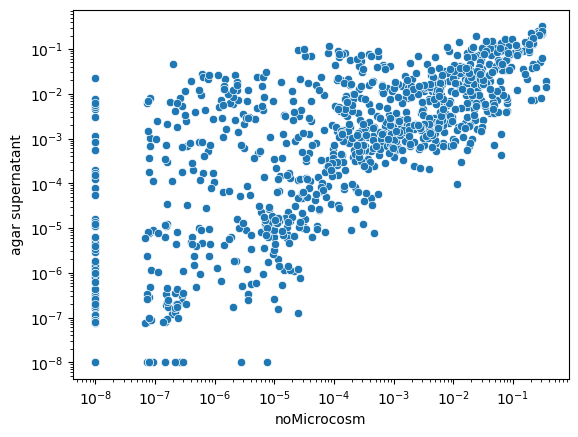

In [96]:
y = np.array(df_speciesAbun_super_agar).flatten()
x = np.array(df_speciesAbun).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("noMicrocosm")
plt_.set_ylabel("agar supernatant")
print(scipy.stats.spearmanr(x, y))
print(scipy.stats.pearsonr(x, y))

In [97]:
# species abundances for all passages and bioreplicates
num_passages = 6
num_bioRep = 3
file_speciesAbun_mucin = os.path.join(data_dir, 
                                "species_abundances_mucin_supernatant.csv")
df_speciesAbun_mucin = pd.read_csv(file_speciesAbun_mucin, sep=",", header=None)
df_speciesAbun_mucin.columns = \
    create_abundance_header_new(num_bioRep=num_bioRep, num_passages=num_passages)
df_speciesAbun_mucin_raw = df_speciesAbun_mucin.copy()
thresh_zero = 1e-8
df_speciesAbun_mucin[df_speciesAbun_mucin == 0] = thresh_zero
df_speciesAbun_mucin.index = species_names
df_speciesAbun_mucin_T = df_speciesAbun_mucin.copy()
df_speciesAbun_mucin_T = df_speciesAbun_mucin_T.transpose()

SignificanceResult(statistic=0.9198071163033489, pvalue=0.0)
PearsonRResult(statistic=0.8890501181858015, pvalue=0.0)


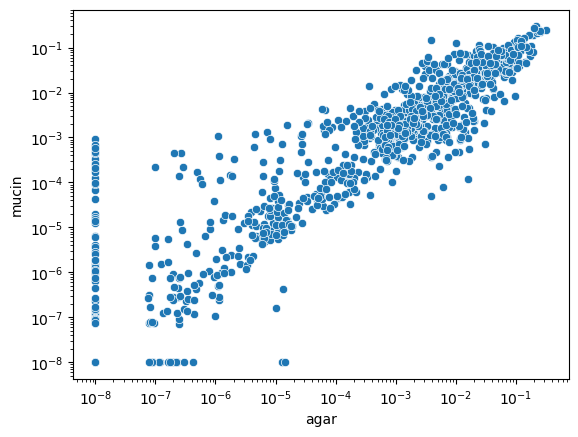

In [98]:
x = np.array(df_speciesAbun_super_agar).flatten()
# x = np.array(df_speciesAbun).flatten()
y = np.array(df_speciesAbun_mucin).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
# plt_.set_xlabel("noMicrocosm")
plt_.set_xlabel("agar")
plt_.set_ylabel("mucin")
print(scipy.stats.spearmanr(x, y))
print(scipy.stats.pearsonr(x, y))

SignificanceResult(statistic=0.7021738744023178, pvalue=2.1431366586293513e-29)
PearsonRResult(statistic=0.46465995221786427, pvalue=1.6352848782189457e-11)


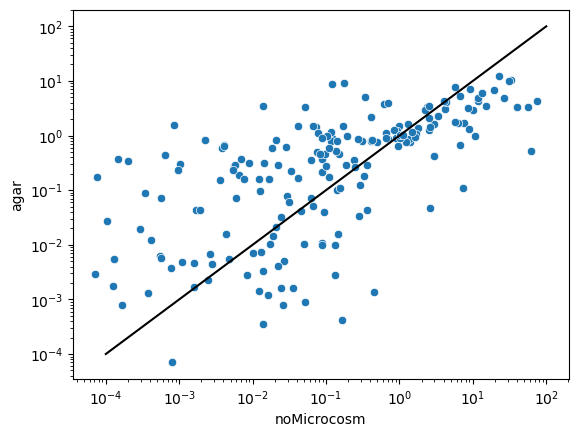

In [99]:
pass_ = 0
id_pass = [pass_, pass_ + 5, pass_ + 10] 
x = np.array(df_speciesAbun_ratio.iloc[:, id_pass]).flatten()
# x = np.array(df_speciesAbun).flatten()
y = np.array(df_speciesAbun_super_agar_ratio.iloc[:, id_pass]).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("noMicrocosm")
plt_.set_ylabel("agar")
plt_.plot([1e-4, 1e2], [1e-4, 1e2], c="black")
# plt_.set_ylabel("mucin")
print(scipy.stats.spearmanr(x, y))
print(scipy.stats.pearsonr(x, y))

In [100]:

file_speciesAbun = os.path.join(data_dir, 
                                "species_abundances_inoculum.csv")
df_speciesAbun_inoc = pd.read_csv(file_speciesAbun, sep=",", header=None)
df_speciesAbun_inoc.columns = ["inoculum"]
df_speciesAbun_inoc[df_speciesAbun_inoc == 0] = thresh_zero
df_speciesAbun_inoc.index = species_names

In [101]:
# consumption, abundance product. Sum of species-metabolite consumption matrix, c_species^metabolite, for each 
# metabolite for each passage (and replicate) across all the species
# df_cons_abun_prod = df_speciesAbun_T.dot(df_speciesMetab)
df_cons_abun_prod = compute_cons_abun_prod(df_speciesMetab=df_speciesMetab, 
                                           df_speciesAbun=df_speciesAbun)
df_cons_abun_prod_avg = df_cons_abun_prod.mean(axis=0)
id_metabs_sorted = np.argsort(df_cons_abun_prod_avg)[::-1]

In [102]:
passages_ = np.array(['p1', 'p2', 'p3', 'p4', 'p5', 'p6'])
reps_ = np.array(['r0', 'r1', 'r2'])
df_speciesAbun_ratio = pd.DataFrame()
df_speciesAbun_ratio_corr = pd.DataFrame()
df_speciesAbun_new = pd.DataFrame()
df_speciesAbun_prev = pd.DataFrame()
df_speciesAbun_next = pd.DataFrame()
df_speciesAbun_split = pd.DataFrame()
count_ = 0
brep_vec = list(range(num_bioRep))
for rep_ in reps_:
    for pass_ in range(1, len(passages_)):
        col_1 = passages_[pass_ - 1] + "_" + rep_
        col_2 = passages_[pass_] + "_" + rep_
        
        df_speciesAbun_prev[col_2] = df_speciesAbun[col_1].values
        df_speciesAbun_next[col_2] = df_speciesAbun[col_2].values
        
        array_1 = np.array(df_speciesAbun[col_2].values / df_speciesAbun[col_1].values)
        array_2 = np.array(df_speciesAbun[col_2].values)
        array_3 = np.array(df_speciesAbun[col_1].values)
        
        df_speciesAbun_new[col_1] = df_speciesAbun[col_1].values
        df_speciesAbun_new[col_2] = df_speciesAbun[col_2].values
        df_speciesAbun_ratio[col_2] = array_1.copy()
        df_speciesAbun_ratio_corr[col_2] = array_1.copy()
        id_ = np.where((array_3 == thresh_zero) & (array_2 == thresh_zero))[0]
#         id_ = np.where((array_2 == thresh_zero))[0]
#         id_ = np.where(array_1 == 1)[0]
        
        if len(id_) > 0:
            df_speciesAbun_ratio.iloc[id_, count_] = -1
            rep_alt = list(set(reps_) - set([rep_]))
            ratio_vec = []
            for id_tmp in id_:
                abun_alt_ratio = []
                for rep__ in rep_alt:
                    col_1_ = passages_[pass_ - 1] + "_" + rep__
                    col_2_ = passages_[pass_] + "_" + rep__
                    val_1 = df_speciesAbun[col_1_].values[id_tmp]
                    val_2 = df_speciesAbun[col_2_].values[id_tmp]
                    if (val_1 != thresh_zero) | (val_2 != thresh_zero):
                        abun_alt_ratio.append(val_2 / val_1)
                if len(abun_alt_ratio) != 0:
                    df_speciesAbun_ratio_corr.iloc[id_tmp, count_] = \
                        np.exp(np.mean(np.log10(np.array(abun_alt_ratio))))
                else:
                    df_speciesAbun_ratio_corr.iloc[id_tmp, count_] = -1
                
        count_ += 1

In [103]:
# previous and next abundances for supernatant agar
passages_ = np.array(['p1', 'p2', 'p3', 'p4', 'p5', 'p6'])
reps_ = np.array(['r0', 'r1', 'r2'])
df_speciesAbun_super_agar_ratio = pd.DataFrame()
df_speciesAbun_super_agar_ratio_corr = pd.DataFrame()
df_speciesAbun_super_agar_new = pd.DataFrame()
df_speciesAbun_super_agar_prev = pd.DataFrame()
df_speciesAbun_super_agar_next = pd.DataFrame()
df_speciesAbun_super_agar_split = pd.DataFrame()
count_ = 0
brep_vec = list(range(num_bioRep))
for rep_ in reps_:
    for pass_ in range(1, len(passages_)):
        col_1 = passages_[pass_ - 1] + "_" + rep_
        col_2 = passages_[pass_] + "_" + rep_
        
        df_speciesAbun_super_agar_prev[col_2] = df_speciesAbun_super_agar[col_1].values
        df_speciesAbun_super_agar_next[col_2] = df_speciesAbun_super_agar[col_2].values
        
        array_1 = np.array(df_speciesAbun_super_agar[col_2].values / df_speciesAbun_super_agar[col_1].values)
        array_2 = np.array(df_speciesAbun_super_agar[col_2].values)
        array_3 = np.array(df_speciesAbun_super_agar[col_1].values)
        
        df_speciesAbun_super_agar_new[col_1] = df_speciesAbun_super_agar[col_1].values
        df_speciesAbun_super_agar_new[col_2] = df_speciesAbun_super_agar[col_2].values
        df_speciesAbun_super_agar_ratio[col_2] = array_1.copy()
        df_speciesAbun_super_agar_ratio_corr[col_2] = array_1.copy()
        id_ = np.where((array_3 == thresh_zero) & (array_2 == thresh_zero))[0]
#         id_ = np.where((array_2 == thresh_zero))[0]
#         id_ = np.where(array_1 == 1)[0]
        
        if len(id_) > 0:
            df_speciesAbun_super_agar_ratio.iloc[id_, count_] = -1
            rep_alt = list(set(reps_) - set([rep_]))
            ratio_vec = []
            for id_tmp in id_:
                Abun_super_agar_alt_ratio = []
                for rep__ in rep_alt:
                    col_1_ = passages_[pass_ - 1] + "_" + rep__
                    col_2_ = passages_[pass_] + "_" + rep__
                    val_1 = df_speciesAbun_super_agar[col_1_].values[id_tmp]
                    val_2 = df_speciesAbun_super_agar[col_2_].values[id_tmp]
                    if (val_1 != thresh_zero) | (val_2 != thresh_zero):
                        Abun_super_agar_alt_ratio.append(val_2 / val_1)
                if len(Abun_super_agar_alt_ratio) != 0:
                    df_speciesAbun_super_agar_ratio_corr.iloc[id_tmp, count_] = \
                        np.exp(np.mean(np.log10(np.array(Abun_super_agar_alt_ratio))))
                else:
                    df_speciesAbun_super_agar_ratio_corr.iloc[id_tmp, count_] = -1
                
        count_ += 1

In [104]:
# previous and next abundances for mucin agar
passages_ = np.array(['p1', 'p2', 'p3', 'p4', 'p5', 'p6'])
reps_ = np.array(['r0', 'r1', 'r2'])
df_speciesAbun_mucin_ratio = pd.DataFrame()
df_speciesAbun_mucin_ratio_corr = pd.DataFrame()
df_speciesAbun_mucin_new = pd.DataFrame()
df_speciesAbun_mucin_prev = pd.DataFrame()
df_speciesAbun_mucin_next = pd.DataFrame()
df_speciesAbun_mucin_split = pd.DataFrame()
count_ = 0
brep_vec = list(range(num_bioRep))
for rep_ in reps_:
    for pass_ in range(1, len(passages_)):
        col_1 = passages_[pass_ - 1] + "_" + rep_
        col_2 = passages_[pass_] + "_" + rep_
        
        df_speciesAbun_mucin_prev[col_2] = df_speciesAbun_mucin[col_1].values
        df_speciesAbun_mucin_next[col_2] = df_speciesAbun_mucin[col_2].values
        
        array_1 = np.array(df_speciesAbun_mucin[col_2].values / df_speciesAbun_mucin[col_1].values)
        array_2 = np.array(df_speciesAbun_mucin[col_2].values)
        array_3 = np.array(df_speciesAbun_mucin[col_1].values)
        
        df_speciesAbun_mucin_new[col_1] = df_speciesAbun_mucin[col_1].values
        df_speciesAbun_mucin_new[col_2] = df_speciesAbun_mucin[col_2].values
        df_speciesAbun_mucin_ratio[col_2] = array_1.copy()
        df_speciesAbun_mucin_ratio_corr[col_2] = array_1.copy()
        id_ = np.where((array_3 == thresh_zero) & (array_2 == thresh_zero))[0]
#         id_ = np.where((array_2 == thresh_zero))[0]
#         id_ = np.where(array_1 == 1)[0]
        
        if len(id_) > 0:
            df_speciesAbun_mucin_ratio.iloc[id_, count_] = -1
            rep_alt = list(set(reps_) - set([rep_]))
            ratio_vec = []
            for id_tmp in id_:
                Abun_mucin_alt_ratio = []
                for rep__ in rep_alt:
                    col_1_ = passages_[pass_ - 1] + "_" + rep__
                    col_2_ = passages_[pass_] + "_" + rep__
                    val_1 = df_speciesAbun_mucin[col_1_].values[id_tmp]
                    val_2 = df_speciesAbun_mucin[col_2_].values[id_tmp]
                    if (val_1 != thresh_zero) | (val_2 != thresh_zero):
                        Abun_mucin_alt_ratio.append(val_2 / val_1)
                if len(Abun_mucin_alt_ratio) != 0:
                    df_speciesAbun_mucin_ratio_corr.iloc[id_tmp, count_] = \
                        np.exp(np.mean(np.log10(np.array(Abun_mucin_alt_ratio))))
                else:
                    df_speciesAbun_mucin_ratio_corr.iloc[id_tmp, count_] = -1
                
        count_ += 1

# parameters setup

In [105]:
date_ = '20230517'
distance_metric = 'euclidean'
# distance_metric = 'correlation'
metab_cluster_mean_func = 'geometric'
metab_cluster_mean_func = "linear"
clustering_method = "hdbscan"
clustering_method = "hierarch_clust"
random_seed = 635
# random_seed = 9876
# random_seed = 7360
# microcosm_type = "supernatantAgar"
# microcosm_type = "mucin"
microcosm_type = "noMicrocosm"

In [106]:
if microcosm_type == "noMicrocosm":
    df_speciesAbun_mdl = df_speciesAbun.copy()
    df_speciesAbun_prev_mdl = df_speciesAbun_prev.copy()
    df_speciesAbun_next_mdl = df_speciesAbun_next.copy()
    df_speciesAbun_ratio_mdl = df_speciesAbun_ratio.copy()
elif microcosm_type == "supernatantAgar":
    df_speciesAbun_mdl = df_speciesAbun_super_agar.copy()
    df_speciesAbun_prev_mdl = df_speciesAbun_super_agar_prev.copy()
    df_speciesAbun_next_mdl = df_speciesAbun_super_agar_next.copy()
    df_speciesAbun_ratio_mdl = df_speciesAbun_super_agar_ratio.copy()
elif microcosm_type == "mucin":
    df_speciesAbun_mdl = df_speciesAbun_mucin.copy()
    df_speciesAbun_prev_mdl = df_speciesAbun_mucin_prev.copy()
    df_speciesAbun_next_mdl = df_speciesAbun_mucin_next.copy()
    df_speciesAbun_ratio_mdl = df_speciesAbun_mucin_ratio.copy()

## Embed species metabolite consumption matrix using umap, project to 10 dimensional space for clustering later

In [25]:
dim_project = 20
n_clusters_kmean = 60
n_clusters_hclust = 70
X = df_speciesMetab.copy().T
reducer = umap.UMAP(metric=distance_metric, n_components=dim_project, random_state=random_seed)
embedding = reducer.fit_transform(X)

## Cluster metabs by first setting to 0 values less than 0.3 in the consumption matrix. Next, removing metabs with 0 consumption across all the species. Then, only metabs with non-zero consumption for more than and equal to 5 species were clustered. Metabs with non-zero consumption less than 5 were kept as single metab clusters

136
68
88


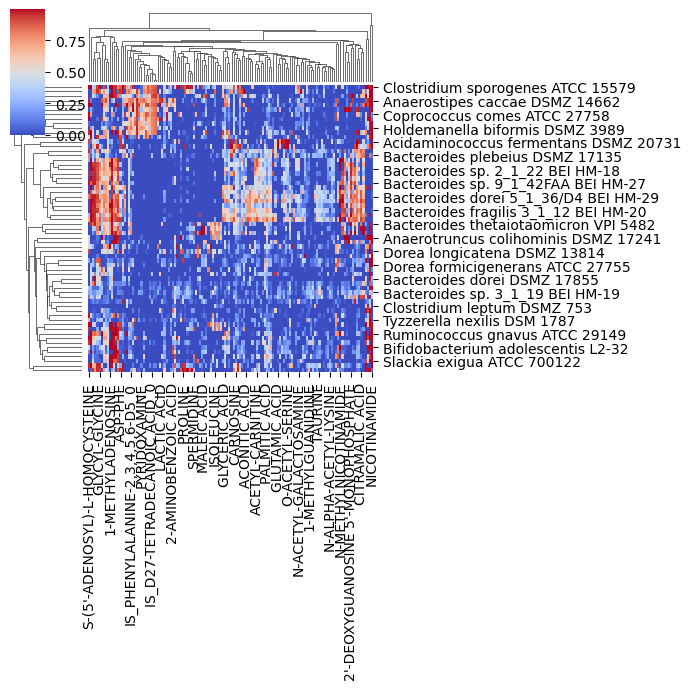

In [108]:
bin_thresh = 0.3
species_num_thresh = 5

df_tmp = df_speciesMetab.copy()
df_tmp[df_tmp < bin_thresh] = 0
df_tmp[df_tmp >= bin_thresh] = 1

sum_ = np.sum(np.array(df_tmp), axis=0)
id_metabs_clust = np.where(sum_ >= species_num_thresh)[0]
id_metabs_rm = np.where(sum_ == 0)[0]
id_metabs_single_clust = np.where((sum_ < species_num_thresh) & \
                                  (sum_ > 0))[0]
print(len(id_metabs_clust))
print(len(id_metabs_rm))
print(len(id_metabs_single_clust))

n_clusters_hclust = 10
cluster_labels = hierarchical_cluster_metabs(df_speciesMetab.iloc[:, id_metabs_clust].copy(), \
                                             n_clusters=n_clusters_hclust, metric=distance_metric)

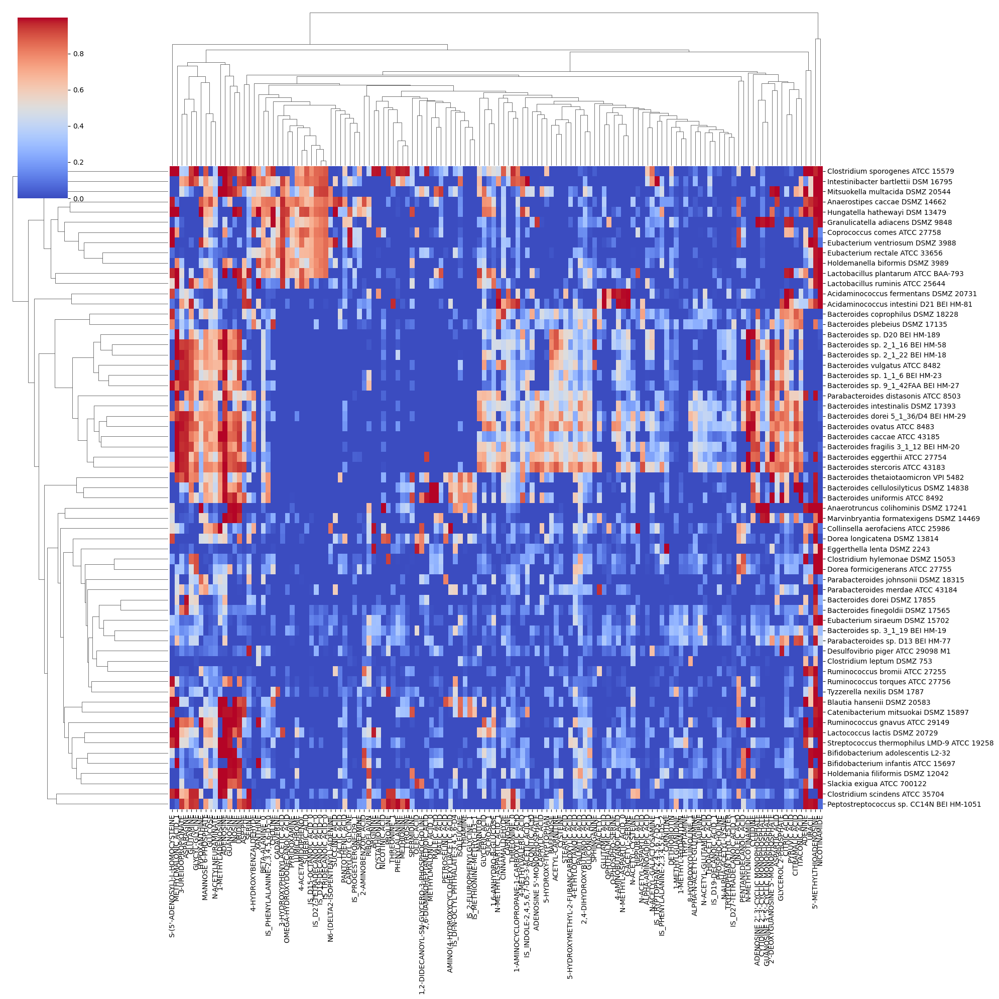

In [85]:
plt_ = sns.clustermap(df_speciesMetab.iloc[:, id_metabs_clust].copy(), \
                      cmap="coolwarm", figsize=(20, 20), \
                      metric=distance_metric, xticklabels=True, yticklabels=True)
# plt_.set_xtic

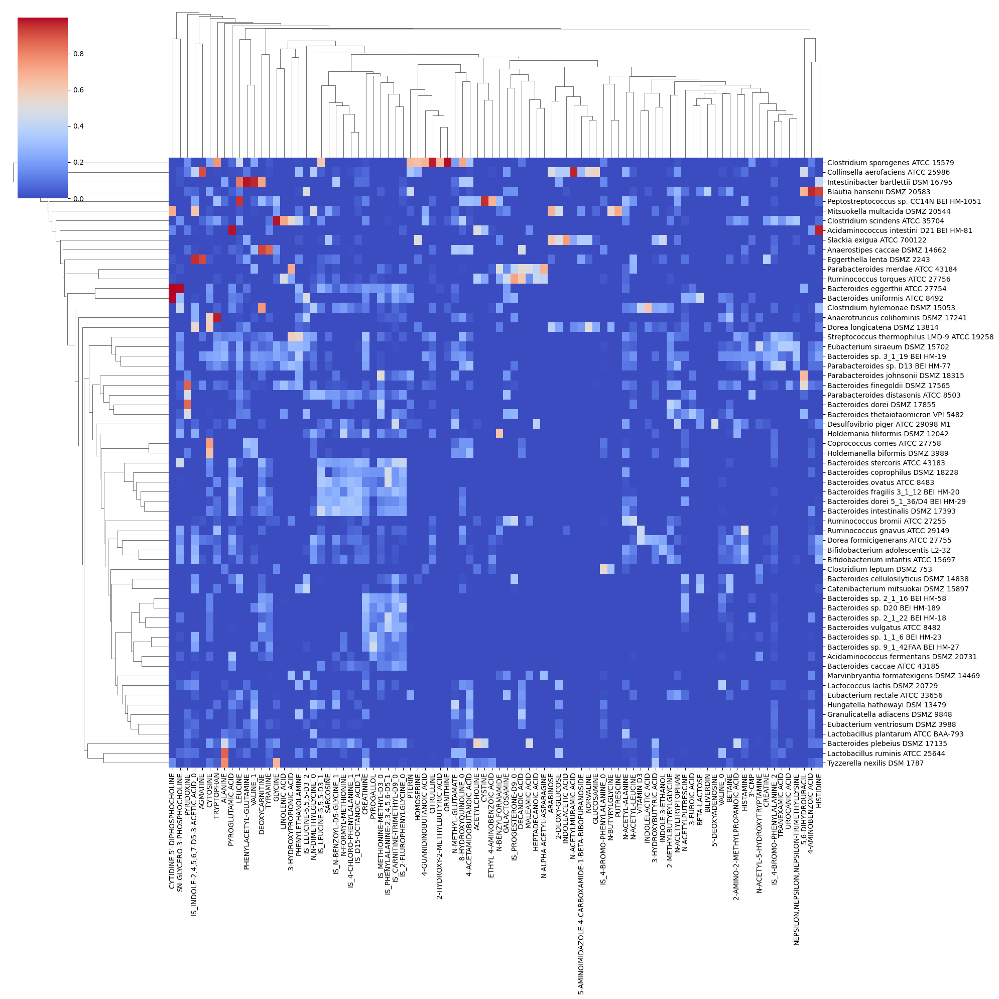

In [81]:
plt_ = sns.clustermap(df_speciesMetab.iloc[:, id_metabs_single_clust].copy(), \
                      cmap="coolwarm", figsize=(20, 20), \
                      metric=distance_metric, xticklabels=True, yticklabels=True)
# plt_.set_xtic

In [104]:
clust_labels, clust_counts = np.unique(cluster_labels, return_counts=True)
print(clust_labels)
print(clust_counts)

clust_labels_full = np.hstack([clust_labels, \
                               np.arange(len(clust_labels), \
                                         len(clust_labels) + len(id_metabs_single_clust))])
clust_counts_full = np.hstack([clust_counts, np.ones(len(id_metabs_single_clust))])
clust_counts_full = clust_counts_full.astype(np.int64)

[0 1 2 3 4 5 6 7 8 9]
[ 5 25 30  5 15  5 24  7  6 14]


In [277]:
df_metabs_clusters, df_speciesMetab_new = \
    get_metabs_clusters(df_speciesMetab, bin_thresh=0.3, species_num_thresh=5, \
                        n_clusters_hclust=10, distance_metric="euclidean", \
                        method_cluster="ward")

In [278]:
df_speciesMetab_cluster = avg_consumption_df(df_speciesMetab_new, df_metabs_clusters, \
                                             metab_cluster_mean_func="linear")

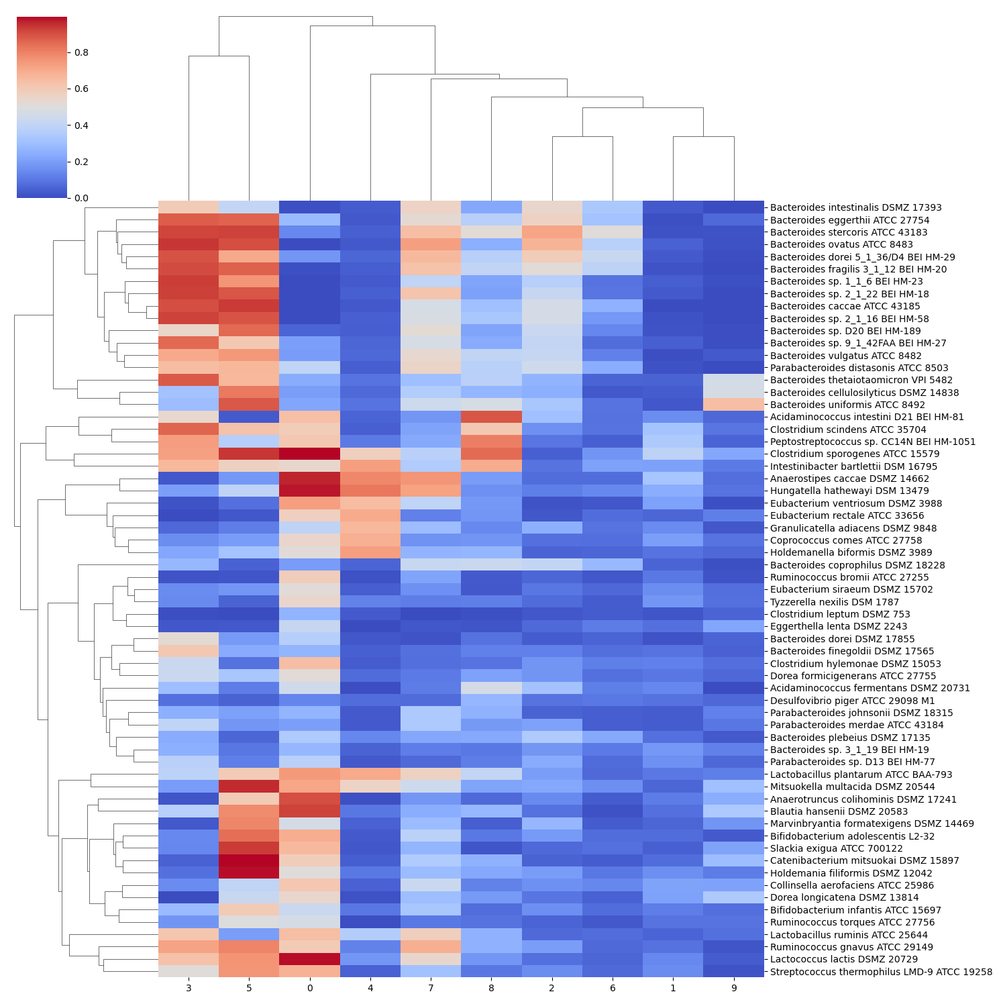

In [279]:
plt_ = sns.clustermap(df_speciesMetab_cluster.iloc[:, range(10)], \
                      cmap="coolwarm", figsize=(15, 15), \
                      metric=distance_metric, xticklabels=True, yticklabels=True)

In [280]:
df_metabs_clusters

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE..."
1,1,25,"[1, 6, 7, 24, 48, 62, 64, 66, 78, 83, 86, 90, ...","[NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ..."
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI..."
3,3,5,"[35, 80, 93, 95, 106]","[3-UREIDOPROPIONATE, ASPARAGINE, GLUTAMINE, GL..."
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,..."
...,...,...,...,...
93,93,1,[219],[SN-GLYCERO-3-PHOSPHOCHOLINE]
94,94,1,[220],[TRANEXAMIC ACID]
95,95,1,[221],[TRYPTOPHAN]
96,96,1,[222],[TYRAMINE]


## Fit steady state Ri with the new cluster

In [34]:
date_ = '20230518'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_steadyState' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_steadyState' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                       df_speciesAbun_ratio_mdl, \
                       file_save=file_save, num_passages=6, pass_rm=pass_rm)
with open(file_save, "wb") as file_:
     pickle.dump(Ri_ss_obj, file_) 

In [35]:
Ri_noMicrocosm_steadyState_fit_all = Ri_ss_obj['Ri_noMicrocosm_steadyState_fit_all']
Ri_noMicrocosm_steadyState_fit_avg = Ri_ss_obj['Ri_noMicrocosm_steadyState_fit_avg']
Ri_noMicrocosm_steadyState_fit_joint = Ri_ss_obj['Ri_noMicrocosm_steadyState_fit_joint']

## steady state Ri: Plot RHS vs LHS from Ri fit

In [32]:
save_file = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_RHS_vs_LHS_Ri_fit_steadyState.png'))

match_lhs_rhs_fit(Ri_noMicrocosm_steadyState_fit_avg, \
                  df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
                  num_passages=6)

In [35]:
id_order = np.argsort(-Ri_noMicrocosm_steadyState_fit_avg)
Ri_order = Ri_noMicrocosm_steadyState_fit_avg.copy()
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['Ri'] = Ri_noMicrocosm_steadyState_fit_avg
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[range(20), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE...",0.165564
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.149873
23,23,1,[149],[IS_METHIONINE-METHYL-D3_0],0.141382
92,92,1,[218],[PYROGLUTAMIC ACID],0.095231
5,5,5,"[15, 73, 96, 100, 135]","[1-METHYLADENOSINE, ADENOSINE, GUANOSINE, INOS...",0.049910
26,26,1,[152],"[IS_INDOLE-2,4,5,6,7-D5-3-ACETIC ACID_0]",0.037043
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.030714
64,64,1,[190],[CREATININE],0.027527
21,21,1,[147],[IS_CARNITINE-TRIMETHYL-D9_0],0.023432
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.021669


In [36]:
df_metabs_clusters_order.iloc[range(20), 3].values

array([list(["5'-METHYLTHIOADENOSINE", 'ADENINE', 'NICOTINAMIDE', "S-(5'-ADENOSYL)-L-HOMOCYSTEINE", 'URACIL']),
       list(['N-METHYL-ASPARTIC ACID_0', 'STEARIC ACID', 'CITRIC ACID', 'CITRAMALIC ACID', 'ITACONIC ACID', 'ACONITIC ACID', 'DIACETYL', 'PYRUVIC ACID', '4-METHYLVALERIC ACID', '2,4-DIHYDROXYBUTANOIC ACID', '5-HYDROXYMETHYL-2-FURANCARBOXYLIC ACID', 'N-ACETYL-CYSTEINE', 'GLUCONIC ACID', 'N-METHYL-ASPARTIC ACID_1', "2'-DEOXYGUANOSINE 5'-MONOPHOSPHATE", '4-AMINOBUTANOIC ACID', '4-ETHYLOCTANOIC ACID', 'ACETYL-CARNITINE', "ADENOSINE 2',3'-CYCLIC MONOPHOSPHATE", 'ASPARTIC ACID', 'CYSTEINE', 'CYTIDINE', "CYTIDINE 2',3'-CYCLIC MONOPHOSPHATE", 'GLYCEROL 2-PHOSPHATE', "GUANOSINE 3',5'-CYCLIC MONOPHOSPHATE", 'RAFFINOSE', 'N-METHYLNICOTINAMIDE', 'O-ACETYL-SERINE', 'PALMITIC ACID', 'PENTANEDECANOIC ACID']),
       list(['IS_METHIONINE-METHYL-D3_0']), list(['PYROGLUTAMIC ACID']),
       list(['1-METHYLADENOSINE', 'ADENOSINE', 'GUANOSINE', 'INOSINE', 'URIDINE']),
       list(['IS_INDOLE-2,4

In [155]:
blindly_pred_abun_growth(p_vec_new, df_speciesMetab_cluster, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_steadyState_fit_avg, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8)

In [34]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_steadyState' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth(p_vec_new, df_speciesMetab_cluster, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_steadyState_fit_avg, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=True)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


## Fit dynamic Ri

In [30]:
date_ = '20230518'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])

for rep_ in range(n_repeats):
    print(f'repeat = {rep_}')
    Ri_dynamic_obj[rep_] = fit_dynamic_Ri_with_sim_inoc(df_speciesMetab_cluster, \
                                                             df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                                             df_speciesAbun_ratio_mdl, p_vec_new, \
                                                             file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
    
with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

repeat = 0
count = 0, p_tmp = 0.001
count = 1, p_tmp = 0.01
count = 2, p_tmp = 0.05
count = 3, p_tmp = 0.06
count = 4, p_tmp = 0.07
count = 5, p_tmp = 0.08
count = 6, p_tmp = 0.09
count = 7, p_tmp = 0.1
count = 8, p_tmp = 0.125
count = 9, p_tmp = 0.15
count = 10, p_tmp = 0.175
count = 11, p_tmp = 0.2
count = 12, p_tmp = 0.3
count = 13, p_tmp = 0.4
count = 14, p_tmp = 0.5
count = 15, p_tmp = 0.55
count = 16, p_tmp = 0.6
count = 17, p_tmp = 0.65
count = 18, p_tmp = 0.7
repeat = 1
count = 0, p_tmp = 0.001
count = 1, p_tmp = 0.01
count = 2, p_tmp = 0.05
count = 3, p_tmp = 0.06
count = 4, p_tmp = 0.07
count = 5, p_tmp = 0.08
count = 6, p_tmp = 0.09
count = 7, p_tmp = 0.1
count = 8, p_tmp = 0.125
count = 9, p_tmp = 0.15
count = 10, p_tmp = 0.175
count = 11, p_tmp = 0.2
count = 12, p_tmp = 0.3
count = 13, p_tmp = 0.4
count = 14, p_tmp = 0.5
count = 15, p_tmp = 0.55
count = 16, p_tmp = 0.6
count = 17, p_tmp = 0.65
count = 18, p_tmp = 0.7
repeat = 2
count = 0, p_tmp = 0.001
count = 1, p_tmp = 0

PearsonRResult(statistic=0.9797234122963117, pvalue=7.783152928176264e-69)
PearsonRResult(statistic=0.950852361140949, pvalue=1.132375990303177e-50)


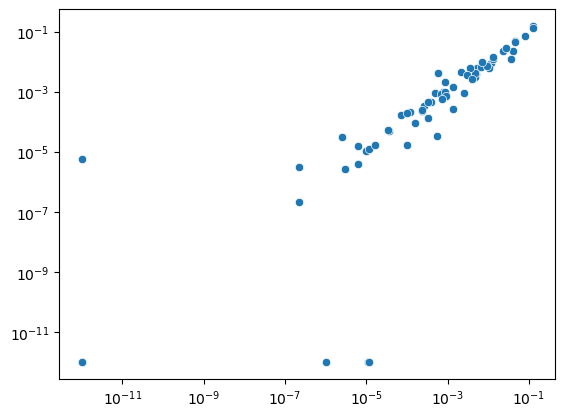

In [63]:
rep_1 = 0
rep_2 = 8
count_p = 7

x = Ri_dynamic_obj[rep_1]['Ri_noMicrocosm_dynamicAll_fit_avg'][count_p]
y = Ri_dynamic_obj[rep_2]['Ri_noMicrocosm_dynamicAll_fit_avg'][count_p]

x[x == 0] = 1e-12
y[y == 0] = 1e-12

plt_ = sns.scatterplot(x=x, y=y)
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)

print(scipy.stats.pearsonr(x, y))
print(scipy.stats.pearsonr(np.log10(x), np.log10(y)))

In [32]:
date_ = '20230518'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 

In [33]:
Ri_dynamic_obj.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [34]:
# Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
# Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
# Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']
n_repeats = 10
Ri_noMicrocosm_dynamicAll_fit_avg = {}
Ri_noMicrocosm_dynamicAll_fit_joint = {}
num_metabs = df_speciesMetab_cluster.shape[1]
for count_p in range(len(p_vec_new)):
    Ri_noMicrocosm_dynamicAll_fit_avg[count_p] = np.zeros((num_metabs))
    Ri_noMicrocosm_dynamicAll_fit_joint[count_p] = np.zeros((num_metabs))
    for rep_ in range(n_repeats):
        Ri_noMicrocosm_dynamicAll_fit_avg[count_p] += \
            Ri_dynamic_obj[rep_]['Ri_noMicrocosm_dynamicAll_fit_avg'][count_p]
        Ri_noMicrocosm_dynamicAll_fit_joint[count_p] += \
            Ri_dynamic_obj[rep_]['Ri_noMicrocosm_dynamicAll_fit_joint'][count_p]
    Ri_noMicrocosm_dynamicAll_fit_avg[count_p] /= n_repeats
    Ri_noMicrocosm_dynamicAll_fit_joint[count_p] /= n_repeats
        

In [35]:
np.sum(Ri_noMicrocosm_dynamicAll_fit_avg[7])
# np.sum(Ri_dynamic_obj[99]['Ri_noMicrocosm_dynamicAll_fit_avg'][0])
np.sum(Ri_noMicrocosm_dynamicAll_fit_joint[7])

0.6638243871870391

In [32]:
for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_RHS_vs_LHS_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_avg[count_p], \
                      df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
                      num_passages=6)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001
count = 1, p = 0.01
count = 2, p = 0.05
count = 3, p = 0.06
count = 4, p = 0.07
count = 5, p = 0.08
count = 6, p = 0.09
count = 7, p = 0.1
count = 8, p = 0.125
count = 9, p = 0.15
count = 10, p = 0.175
count = 11, p = 0.2
count = 12, p = 0.3
count = 13, p = 0.4
count = 14, p = 0.5
count = 15, p = 0.55
count = 16, p = 0.6
count = 17, p = 0.65
count = 18, p = 0.7


In [36]:
count_p = 7
id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_avg[count_p])
# id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_joint[count_p])
Ri_order = Ri_noMicrocosm_dynamicAll_fit_avg.copy()[count_p]
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['Ri'] = Ri_noMicrocosm_dynamicAll_fit_avg[count_p]
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[range(20), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
7,7,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.138091
92,92,1,[218],[PYROGLUTAMIC ACID],0.128546
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.077521
5,5,5,"[15, 73, 96, 100, 135]","[1-METHYLADENOSINE, ADENOSINE, GUANOSINE, INOS...",0.042533
23,23,1,[149],[IS_METHIONINE-METHYL-D3_0],0.041279
83,83,1,[209],[N-METHYL-GLUTAMATE],0.027713
1,1,25,"[1, 6, 7, 24, 48, 62, 64, 66, 78, 83, 86, 90, ...","[NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ...",0.027293
3,3,5,"[35, 80, 93, 95, 106]","[3-UREIDOPROPIONATE, ASPARAGINE, GLUTAMINE, GL...",0.027250
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.018972
42,42,1,[168],[GLYCINE],0.013530


In [33]:
df_metabs_clusters_order.iloc[range(20), 3].values

array([list(['MANNOSE 6-PHOSPHATE', 'GLUCOSE', 'SUCROSE_1', 'GLYCERIC ACID', '1,6-ANHYDRO-B-GLUCOSE', 'HYPOXANTHINE', 'N-ACETYLNEURAMINATE']),
       list(['PYROGLUTAMIC ACID']),
       list(['N-METHYL-ASPARTIC ACID_0', 'STEARIC ACID', 'CITRIC ACID', 'CITRAMALIC ACID', 'ITACONIC ACID', 'ACONITIC ACID', 'DIACETYL', 'PYRUVIC ACID', '4-METHYLVALERIC ACID', '2,4-DIHYDROXYBUTANOIC ACID', '5-HYDROXYMETHYL-2-FURANCARBOXYLIC ACID', 'N-ACETYL-CYSTEINE', 'GLUCONIC ACID', 'N-METHYL-ASPARTIC ACID_1', "2'-DEOXYGUANOSINE 5'-MONOPHOSPHATE", '4-AMINOBUTANOIC ACID', '4-ETHYLOCTANOIC ACID', 'ACETYL-CARNITINE', "ADENOSINE 2',3'-CYCLIC MONOPHOSPHATE", 'ASPARTIC ACID', 'CYSTEINE', 'CYTIDINE', "CYTIDINE 2',3'-CYCLIC MONOPHOSPHATE", 'GLYCEROL 2-PHOSPHATE', "GUANOSINE 3',5'-CYCLIC MONOPHOSPHATE", 'RAFFINOSE', 'N-METHYLNICOTINAMIDE', 'O-ACETYL-SERINE', 'PALMITIC ACID', 'PENTANEDECANOIC ACID']),
       list(['1-METHYLADENOSINE', 'ADENOSINE', 'GUANOSINE', 'INOSINE', 'URIDINE']),
       list(['IS_METHIONINE-METHY

In [37]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth(p_vec_new, df_speciesMetab_cluster_tmp, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_dynamicAll_fit_avg, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [58]:
num_rand = 1
vals_inoc_rand = np.zeros((num_species))
for rand_ in range(num_rand):
    vals_ = np.random.exponential(1 / num_species, num_species)
    vals_ /= np.sum(vals_)
    vals_inoc_rand[:] += vals_
vals_inoc_rand /= num_rand

PearsonRResult(statistic=-0.11257985919220942, pvalue=0.37968411966210047)
SignificanceResult(statistic=-0.15668202764976957, pvalue=0.22008118340344526)


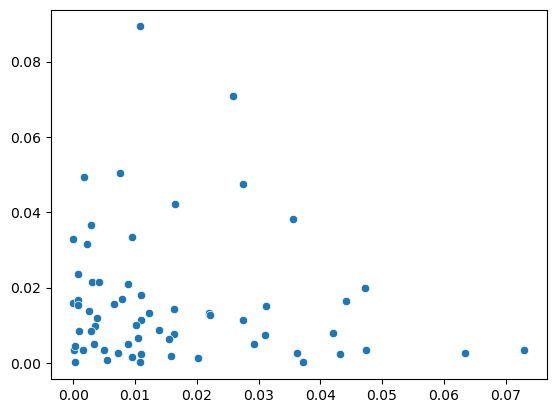

In [59]:
x = df_speciesAbun_inoc.iloc[:, 0].values
y = vals_inoc_rand
plt_ = sns.scatterplot(x=x, y=y)
print(scipy.stats.pearsonr(x, y))
print(scipy.stats.spearmanr(x, y))

In [51]:
pass_ = 0
x = df_speciesAbun_mdl.iloc[:, [pass_ + 1, pass_ + 1 + 6, pass_ + 1 + 12]]
x = np.array(x)
x = 10**np.mean(np.log10(x), axis=1)
# x = np.mean(x, axis=1)
y = df_speciesAbun_inoc.iloc[:, 0].values
y = df_speciesAbun_mdl.iloc[:, [pass_, pass_ + 6, pass_ + 12]]
y = np.array(y)
y = 10**np.mean(np.log10(y), axis=1)

ratio_ = x / y
id_ = np.where(ratio_ > 1)[0]
len(id_)
np.max(ratio_)

34.922372592360865

# balanced fitting of Ri

In [32]:
date_ = '20230518'
n_repeats = 100
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_balanced'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}_balanced' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])

# for rep_ in range(n_repeats):
#     print(f'repeat = {rep_}')
Ri_dynamic_obj = fit_dynamic_Ri_with_sim_inoc_bal(df_speciesMetab_cluster, \
                                                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                                        df_speciesAbun_ratio_mdl, p_vec_new, \
                                                        file_save, num_passages=5, pass_rm=[1, 2, 3, 4])

count = 0, p_tmp = 0.001
rand loop = 0
rand loop = 1
rand loop = 2
rand loop = 3
rand loop = 4
rand loop = 5
rand loop = 6
rand loop = 7
rand loop = 8
rand loop = 9
rand loop = 10
rand loop = 11
rand loop = 12
rand loop = 13
rand loop = 14
rand loop = 15
rand loop = 16
rand loop = 17
rand loop = 18
rand loop = 19
rand loop = 20
rand loop = 21
rand loop = 22
rand loop = 23
rand loop = 24
rand loop = 25
rand loop = 26
rand loop = 27
rand loop = 28
rand loop = 29
rand loop = 30
rand loop = 31
rand loop = 32
rand loop = 33
rand loop = 34
rand loop = 35
rand loop = 36
rand loop = 37
rand loop = 38
rand loop = 39
rand loop = 40
rand loop = 41
rand loop = 42
rand loop = 43
rand loop = 44
rand loop = 45
rand loop = 46
rand loop = 47
rand loop = 48
rand loop = 49
rand loop = 50
rand loop = 51
rand loop = 52
rand loop = 53
rand loop = 54
rand loop = 55
rand loop = 56
rand loop = 57
rand loop = 58
rand loop = 59
rand loop = 60
rand loop = 61
rand loop = 62
rand loop = 63
rand loop = 64
rand loop 

rand loop = 50
rand loop = 51
rand loop = 52
rand loop = 53
rand loop = 54
rand loop = 55
rand loop = 56
rand loop = 57
rand loop = 58
rand loop = 59
rand loop = 60
rand loop = 61
rand loop = 62
rand loop = 63
rand loop = 64
rand loop = 65
rand loop = 66
rand loop = 67
rand loop = 68
rand loop = 69
rand loop = 70
rand loop = 71
rand loop = 72
rand loop = 73
rand loop = 74
rand loop = 75
rand loop = 76
rand loop = 77
rand loop = 78
rand loop = 79
rand loop = 80
rand loop = 81
rand loop = 82
rand loop = 83
rand loop = 84
rand loop = 85
rand loop = 86
rand loop = 87
rand loop = 88
rand loop = 89
rand loop = 90
rand loop = 91
rand loop = 92
rand loop = 93
rand loop = 94
rand loop = 95
rand loop = 96
rand loop = 97
rand loop = 98
rand loop = 99
count = 6, p_tmp = 0.09
rand loop = 0
rand loop = 1
rand loop = 2
rand loop = 3
rand loop = 4
rand loop = 5
rand loop = 6
rand loop = 7
rand loop = 8
rand loop = 9
rand loop = 10
rand loop = 11
rand loop = 12
rand loop = 13
rand loop = 14
rand loop =

rand loop = 23
rand loop = 24
rand loop = 25
rand loop = 26
rand loop = 27
rand loop = 28
rand loop = 29
rand loop = 30
rand loop = 31
rand loop = 32
rand loop = 33
rand loop = 34
rand loop = 35
rand loop = 36
rand loop = 37
rand loop = 38
rand loop = 39
rand loop = 40
rand loop = 41
rand loop = 42
rand loop = 43
rand loop = 44
rand loop = 45
rand loop = 46
rand loop = 47
rand loop = 48
rand loop = 49
rand loop = 50
rand loop = 51
rand loop = 52
rand loop = 53
rand loop = 54
rand loop = 55
rand loop = 56
rand loop = 57
rand loop = 58
rand loop = 59
rand loop = 60
rand loop = 61
rand loop = 62
rand loop = 63
rand loop = 64
rand loop = 65
rand loop = 66
rand loop = 67
rand loop = 68
rand loop = 69
rand loop = 70
rand loop = 71
rand loop = 72
rand loop = 73
rand loop = 74
rand loop = 75
rand loop = 76
rand loop = 77
rand loop = 78
rand loop = 79
rand loop = 80
rand loop = 81
rand loop = 82
rand loop = 83
rand loop = 84
rand loop = 85
rand loop = 86
rand loop = 87
rand loop = 88
rand loop 

rand loop = 72
rand loop = 73
rand loop = 74
rand loop = 75
rand loop = 76
rand loop = 77
rand loop = 78
rand loop = 79
rand loop = 80
rand loop = 81
rand loop = 82
rand loop = 83
rand loop = 84
rand loop = 85
rand loop = 86
rand loop = 87
rand loop = 88
rand loop = 89
rand loop = 90
rand loop = 91
rand loop = 92
rand loop = 93
rand loop = 94
rand loop = 95
rand loop = 96
rand loop = 97
rand loop = 98
rand loop = 99
count = 17, p_tmp = 0.65
rand loop = 0
rand loop = 1
rand loop = 2
rand loop = 3
rand loop = 4
rand loop = 5
rand loop = 6
rand loop = 7
rand loop = 8
rand loop = 9
rand loop = 10
rand loop = 11
rand loop = 12
rand loop = 13
rand loop = 14
rand loop = 15
rand loop = 16
rand loop = 17
rand loop = 18
rand loop = 19
rand loop = 20
rand loop = 21
rand loop = 22
rand loop = 23
rand loop = 24
rand loop = 25
rand loop = 26
rand loop = 27
rand loop = 28
rand loop = 29
rand loop = 30
rand loop = 31
rand loop = 32
rand loop = 33
rand loop = 34
rand loop = 35
rand loop = 36
rand loop 

In [41]:
date_ = '20230518'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_balanced'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}_balanced' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 

In [42]:
# Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
# Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
# Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']
n_repeats = 100
Ri_noMicrocosm_dynamicAll_fit_joint = {}
num_metabs = df_speciesMetab_cluster.shape[1]
for count_p in range(len(p_vec_new)):
    Ri_noMicrocosm_dynamicAll_fit_joint[count_p] = np.zeros((num_metabs))
    for rep_ in range(n_repeats):
        Ri_noMicrocosm_dynamicAll_fit_joint[count_p] += \
            Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][count_p]
    Ri_noMicrocosm_dynamicAll_fit_joint[count_p] /= n_repeats
        

In [34]:
np.sum(Ri_noMicrocosm_dynamicAll_fit_joint[7])

0.7758290479969482

In [35]:
for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_RHS_vs_LHS_Ri_fit_dynamic_p{p_tmp}.png'))

#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_avg[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)
    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
                      num_passages=6)

count = 0, p = 0.001
count = 1, p = 0.01
count = 2, p = 0.05
count = 3, p = 0.06
count = 4, p = 0.07
count = 5, p = 0.08
count = 6, p = 0.09
count = 7, p = 0.1
count = 8, p = 0.125
count = 9, p = 0.15
count = 10, p = 0.175
count = 11, p = 0.2
count = 12, p = 0.3
count = 13, p = 0.4
count = 14, p = 0.5
count = 15, p = 0.55
count = 16, p = 0.6
count = 17, p = 0.65
count = 18, p = 0.7


In [43]:
count_p = 7
id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_joint[count_p])
Ri_order = Ri_noMicrocosm_dynamicAll_fit_joint.copy()[count_p]
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['Ri'] = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[range(20), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
92,92,1,[218],[PYROGLUTAMIC ACID],0.138189
7,7,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.131660
3,3,5,"[35, 80, 93, 95, 106]","[3-UREIDOPROPIONATE, ASPARAGINE, GLUTAMINE, GL...",0.076996
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.059212
5,5,5,"[15, 73, 96, 100, 135]","[1-METHYLADENOSINE, ADENOSINE, GUANOSINE, INOS...",0.057457
23,23,1,[149],[IS_METHIONINE-METHYL-D3_0],0.038552
1,1,25,"[1, 6, 7, 24, 48, 62, 64, 66, 78, 83, 86, 90, ...","[NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ...",0.032385
8,8,6,"[4, 8, 63, 79, 84, 126]","[THREONINE_0, CINNAMALDEHYDE, 1-AMINOCYCLOPROP...",0.025209
83,83,1,[209],[N-METHYL-GLUTAMATE],0.023351
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.021681


In [44]:
df_metabs_clusters_order.iloc[range(20), 3].values

array([list(['PYROGLUTAMIC ACID']),
       list(['MANNOSE 6-PHOSPHATE', 'GLUCOSE', 'SUCROSE_1', 'GLYCERIC ACID', '1,6-ANHYDRO-B-GLUCOSE', 'HYPOXANTHINE', 'N-ACETYLNEURAMINATE']),
       list(['3-UREIDOPROPIONATE', 'ASPARAGINE', 'GLUTAMINE', 'GLYCYL-GLYCINE', 'METHYLMALONIC ACID_1']),
       list(['N-METHYL-ASPARTIC ACID_0', 'STEARIC ACID', 'CITRIC ACID', 'CITRAMALIC ACID', 'ITACONIC ACID', 'ACONITIC ACID', 'DIACETYL', 'PYRUVIC ACID', '4-METHYLVALERIC ACID', '2,4-DIHYDROXYBUTANOIC ACID', '5-HYDROXYMETHYL-2-FURANCARBOXYLIC ACID', 'N-ACETYL-CYSTEINE', 'GLUCONIC ACID', 'N-METHYL-ASPARTIC ACID_1', "2'-DEOXYGUANOSINE 5'-MONOPHOSPHATE", '4-AMINOBUTANOIC ACID', '4-ETHYLOCTANOIC ACID', 'ACETYL-CARNITINE', "ADENOSINE 2',3'-CYCLIC MONOPHOSPHATE", 'ASPARTIC ACID', 'CYSTEINE', 'CYTIDINE', "CYTIDINE 2',3'-CYCLIC MONOPHOSPHATE", 'GLYCEROL 2-PHOSPHATE', "GUANOSINE 3',5'-CYCLIC MONOPHOSPHATE", 'RAFFINOSE', 'N-METHYLNICOTINAMIDE', 'O-ACETYL-SERINE', 'PALMITIC ACID', 'PENTANEDECANOIC ACID']),
       list

In [37]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_balanced'))
df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
# df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth(p_vec_new, df_speciesMetab_cluster_tmp, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_dynamicAll_fit_joint, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False)

In [41]:
sample_names = df_speciesAbun_mdl.columns.values
n_breps = 3
samples_first = sample_names[0 + np.arange(n_breps) * num_passages]
ratio_init = np.zeros((num_species, n_breps))
for rep_ in range(n_breps):
    vals_ = np.random.exponential(1 / num_species, num_species)
    vals_ /= np.sum(vals_)
    ratio_init[:, rep_] = df_speciesAbun_mdl[samples_first[rep_]].values / \
        vals_
ratio_init = 10**np.mean(np.log10(ratio_init), axis=1)
ratio_init

array([5.15957944e+00, 9.15135449e+01, 2.26396246e+00, 5.63976938e-03,
       4.81776750e+01, 5.91175156e-01, 4.84606003e-06, 1.62935296e+01,
       2.04372953e+00, 6.09912868e-02, 1.02333237e-01, 2.80727038e+00,
       1.75305118e+00, 1.55168039e-01, 1.45582040e-03, 2.02000877e+00,
       3.90514100e+00, 2.30875090e-02, 2.71246158e+00, 8.15503361e+00,
       3.66198151e+00, 5.27556269e+00, 2.70115409e+00, 2.23848961e-01,
       5.13522916e-01, 6.00019717e-03, 1.55386739e-02, 2.43108375e-04,
       8.43433508e-05, 4.78432830e-02, 2.00664064e-03, 7.92494635e-01,
       2.54593417e-01, 7.74683707e-02, 2.19634103e-02, 6.41080639e-03,
       5.70780245e-02, 1.03550677e-04, 1.21669094e-01, 1.36124430e-02,
       1.67480004e-01, 3.63858218e-03, 5.01824108e-02, 8.73866560e-05,
       8.36290786e-02, 5.54434971e-01, 3.93628937e-03, 4.06943250e-05,
       7.16993315e+00, 3.61563038e+00, 1.90172208e-03, 1.53925804e+00,
       1.80642768e-03, 2.32662402e-01, 2.76723243e-01, 2.68559006e+00,
      

In [53]:
pass_rm=[1, 2, 3, 4]
pass_keep = remove_passages(pass_rm, num_passages=5)
df_speciesAbun_prev_tmp = df_speciesAbun_prev_mdl.copy().iloc[:, pass_keep]
df_speciesAbun_next_tmp = df_speciesAbun_next_mdl.copy().iloc[:, pass_keep]
df_speciesAbun_ratio_tmp = df_speciesAbun_ratio_mdl.copy().iloc[:, pass_keep]

sample_names = df_speciesAbun_prev_tmp.columns.values
num_passes_keep = int(len(pass_keep) / n_breps)
samples_first = sample_names[0 + np.arange(n_breps) * num_passes_keep]
inoc_samples = []
samples_rearrange = []
for rep_ in range(n_breps):
    inoc_samples.append(f'inoc_r{rep_}')
    df_speciesAbun_prev_tmp[inoc_samples[rep_]] = np.ones((num_species)) / num_species
    df_speciesAbun_next_tmp[inoc_samples[rep_]] = \
        df_speciesAbun_prev_tmp.loc[:, samples_first[rep_]].values
    df_speciesAbun_ratio_tmp[inoc_samples[rep_]] = \
        df_speciesAbun_next_tmp[inoc_samples[rep_]].values / \
            df_speciesAbun_prev_tmp[inoc_samples[rep_]].values
    samples_rearrange.append(f'inoc_r{rep_}')
    for pass_ in range(num_passes_keep):
        samples_rearrange.append(sample_names[rep_ * num_passes_keep + pass_])
df_speciesAbun_prev_tmp = df_speciesAbun_prev_tmp.loc[:, samples_rearrange]
df_speciesAbun_next_tmp = df_speciesAbun_next_tmp.loc[:, samples_rearrange]
df_speciesAbun_ratio_tmp = df_speciesAbun_ratio_tmp.loc[:, samples_rearrange]
print(df_speciesAbun_prev_tmp)
print(df_speciesAbun_next_tmp)
print(df_speciesAbun_ratio_tmp)

     inoc_r0         p2_r0   inoc_r1         p2_r2   inoc_r2         p2_r1
0   0.015873  3.180398e-02  0.015873  4.710307e-02  0.015873  3.751642e-02
1   0.015873  2.174619e-01  0.015873  1.584982e-01  0.015873  2.173035e-01
2   0.015873  3.053745e-02  0.015873  3.420288e-02  0.015873  3.393580e-02
3   0.015873  7.641646e-05  0.015873  7.865395e-05  0.015873  9.158013e-05
4   0.015873  7.633257e-02  0.015873  6.615639e-02  0.015873  7.271956e-02
..       ...           ...       ...           ...       ...           ...
58  0.015873  2.173690e-03  0.015873  3.988645e-03  0.015873  2.753382e-03
59  0.015873  2.727114e-04  0.015873  2.444333e-04  0.015873  2.477832e-04
60  0.015873  1.776472e-03  0.015873  2.231052e-03  0.015873  1.821668e-03
61  0.015873  3.879986e-07  0.015873  8.277804e-07  0.015873  6.177283e-07
62  0.015873  1.178492e-04  0.015873  2.247130e-04  0.015873  1.197888e-04

[63 rows x 6 columns]
         inoc_r0         p2_r0       inoc_r1         p2_r2       inoc_r2  \
0

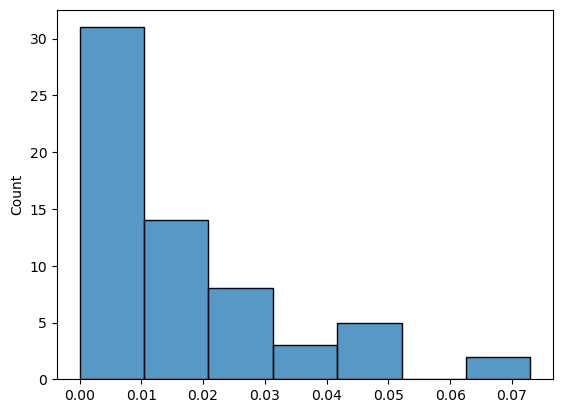

In [55]:
x = df_speciesAbun_inoc.iloc[:, 0].values
plt_ = sns.histplot(x)


0.9191366833743019
0.9999999999999999


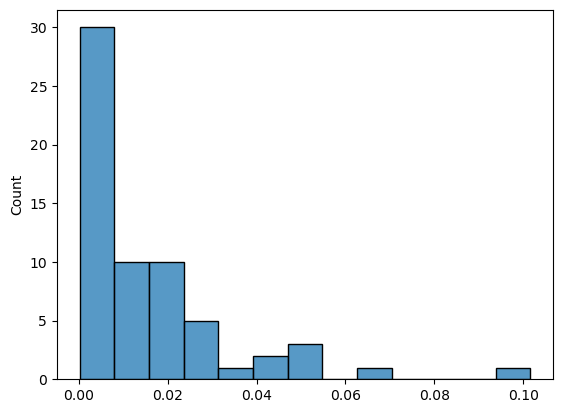

In [45]:
vals_ = 10**np.random.normal(np.log10(1 / 63), 0.2, 63)
vals_ = np.random.exponential(1 / 63, 63)
print(np.sum(vals_))
vals_ /= np.sum(vals_)
print(np.sum(vals_))
plt_ = sns.histplot(vals_)

In [52]:
samples_rearrange

['inoc_r0', 'p2_r0', 'inoc_r1', 'p2_r2', 'inoc_r2', 'p2_r1']

In [33]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_logGrowth'))
blindly_pred_abun_loggrowth(p_vec_new, df_speciesMetab_cluster, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_dynamicAll_fit_avg, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=1000, \
                         thresh_zero=1e-8, Ri_ss=False)

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/home/tarunm3/miniconda3/envs/pyg_env/lib/python3.9/site-packages/PIL/ImageFile.py", line 518, in _save
    fh = fp.fileno()
AttributeError: '_idat' object has no attribute 'fileno'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/tarunm3/miniconda3/envs/pyg_env/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3460, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_55407/3879246589.py", line 6, in <module>
    blindly_pred_abun_growth_seq(p_vec_new, df_speciesMetab_cluster, \
  File "/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py", line 1530, in blindly_pred_abun_growth_seq
    fig.figure.savefig(file_save, \
  File "/home/tarunm3/miniconda3/envs/pyg_env/lib/python3.9/site-packages/matplotlib/figure.py", line 3343, in savefig
    self.canvas.print_figure(fname, **kwargs)
  File "/home/tarunm3/mi

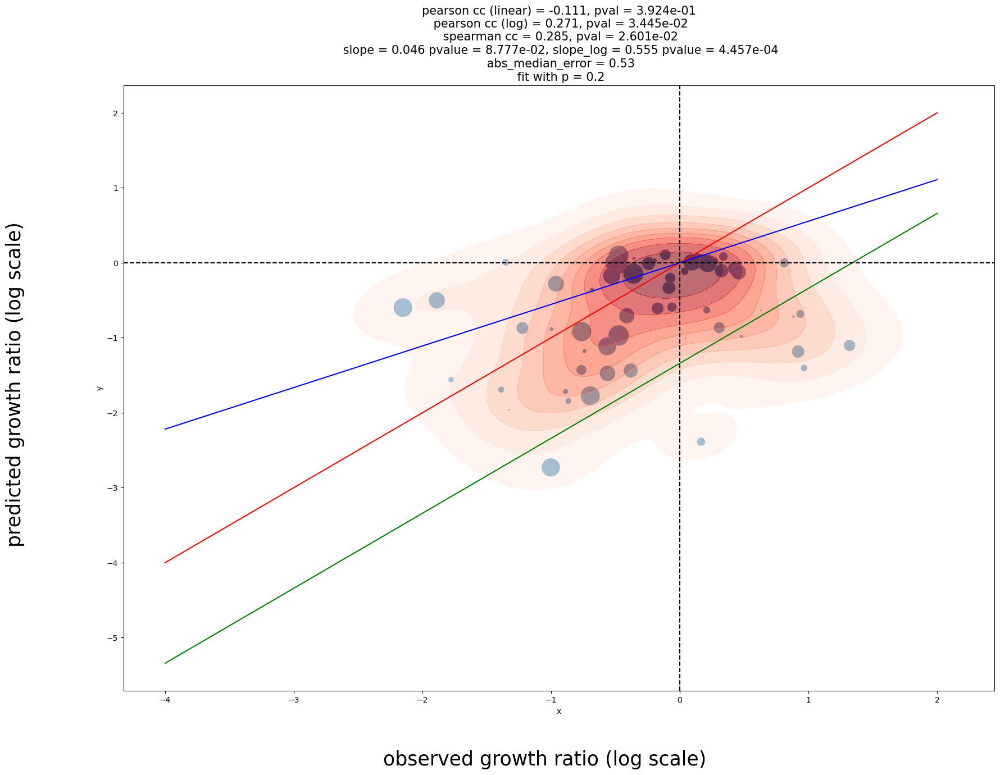

In [45]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_predSpeciesSeq'))
blindly_pred_abun_growth_seq(p_vec_new, df_speciesMetab_cluster, \
                             df_speciesAbun_inoc, df_speciesAbun_mdl, \
                             df_speciesAbun_prev_mdl, \
                             df_speciesAbun_ratio_mdl, \
                             Ri_noMicrocosm_dynamicAll_fit_avg, save_dir, save_dir, \
                             save_dir, num_passages=6, num_iter=100, \
                             thresh_zero=1e-8, Ri_ss=False)

In [ ]:
growth_rate_all =  \
    compute_growth_ratio_iterate_blind_seq(df_speciesAbun_prev_mdl, \
                                           df_speciesAbun_next_mdl, p_tmp, Ri, \
                                           df_speciesMetab, num_iter=100)

## fit dynamic Ri without simulated inoculum

In [36]:
date_ = '20230518'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_noSimInoc'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}_noSimInoc' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])

Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
                                      df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                      df_speciesAbun_ratio_mdl, p_vec_new, \
                                      file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
    
with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001
count = 1, p_tmp = 0.01
count = 2, p_tmp = 0.05
count = 3, p_tmp = 0.06
count = 4, p_tmp = 0.07
count = 5, p_tmp = 0.08
count = 6, p_tmp = 0.09
count = 7, p_tmp = 0.1
count = 8, p_tmp = 0.125
count = 9, p_tmp = 0.15
count = 10, p_tmp = 0.175
count = 11, p_tmp = 0.2
count = 12, p_tmp = 0.3
count = 13, p_tmp = 0.4
count = 14, p_tmp = 0.5
count = 15, p_tmp = 0.55
count = 16, p_tmp = 0.6
count = 17, p_tmp = 0.65
count = 18, p_tmp = 0.7


In [37]:
date_ = '20230518'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_noSimInoc'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}_noSimInoc' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 

In [38]:
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [39]:
for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_RHS_vs_LHS_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_avg[count_p], \
                      df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
                      num_passages=6)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001
count = 1, p = 0.01
count = 2, p = 0.05
count = 3, p = 0.06
count = 4, p = 0.07
count = 5, p = 0.08
count = 6, p = 0.09
count = 7, p = 0.1
count = 8, p = 0.125
count = 9, p = 0.15
count = 10, p = 0.175
count = 11, p = 0.2
count = 12, p = 0.3
count = 13, p = 0.4
count = 14, p = 0.5
count = 15, p = 0.55
count = 16, p = 0.6
count = 17, p = 0.65
count = 18, p = 0.7


In [39]:
count_p = 7
id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_avg[count_p])
# id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_joint[count_p])
Ri_order = Ri_noMicrocosm_dynamicAll_fit_avg.copy()[count_p]
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['Ri'] = Ri_noMicrocosm_dynamicAll_fit_avg[count_p]
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[range(20), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
7,7,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.170053
92,92,1,[218],[PYROGLUTAMIC ACID],0.162396
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.081052
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE...",0.057110
53,53,1,[179],[3'-CMP],0.050726
37,37,1,[163],[BETA-LACTOSE],0.045554
15,15,1,[141],[2-HYDROXY-2-METHYLBUTYRIC ACID],0.039668
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.027435
66,66,1,[192],[CYTOSINE],0.025693
19,19,1,[145],[CYSTINE],0.023667


In [40]:
df_metabs_clusters_order.iloc[range(20), 3].values

array([list(['MANNOSE 6-PHOSPHATE', 'GLUCOSE', 'SUCROSE_1', 'GLYCERIC ACID', '1,6-ANHYDRO-B-GLUCOSE', 'HYPOXANTHINE', 'N-ACETYLNEURAMINATE']),
       list(['PYROGLUTAMIC ACID']),
       list(['BETA-ALANINE_0', 'OMEGA-HYDROXYDODECANOIC ACID', 'IS_PHENYLALANINE-2,3,4,5,6-D5_0', 'IS_D15-OCTANOIC ACID_0', 'IS_D19-DECANOIC ACID_0', 'IS_TRIDECANOIC ACID_0', 'IS_D27-TETRADECANOIC ACID_0', 'XANTHINE', '4-ACETAMIDOPHENOL', '3-HYDROXYPHENYLACETIC ACID', 'CADAVERINE', 'CHOLINE', 'LUMICHROME', 'PYRIDOXAMINE', 'SUBERIC ACID']),
       list(["5'-METHYLTHIOADENOSINE", 'ADENINE', 'NICOTINAMIDE', "S-(5'-ADENOSYL)-L-HOMOCYSTEINE", 'URACIL']),
       list(["3'-CMP"]), list(['BETA-LACTOSE']),
       list(['2-HYDROXY-2-METHYLBUTYRIC ACID']),
       list(['N-ACETYLTRYPTOPHAN']), list(['CYTOSINE']),
       list(['CYSTINE']), list(['3-FUROIC ACID']),
       list(['IS_PHENYLALANINE-2,3,4,5,6-D5_1']),
       list(['N-METHYL-ASPARTIC ACID_0', 'STEARIC ACID', 'CITRIC ACID', 'CITRAMALIC ACID', 'ITACONIC ACID', 'AC

In [41]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_noSimInoc'))
df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth(p_vec_new, df_speciesMetab_cluster_tmp, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_dynamicAll_fit_avg, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


# fit Ri dynamic with actual inoculum

In [47]:
date_ = '20230518'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculum'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculum' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])

# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
Ri_dynamic_obj = fit_dynamic_Ri_with_sim_inoc(df_speciesMetab_cluster, \
                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                 df_speciesAbun_ratio_mdl, p_vec_new, \
                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                                 use_true_inoc=True, df_speciesAbun_inoc=df_speciesAbun_inoc)
    
with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

[9.49151731e-03 7.29762011e-03 4.40807297e-02 5.46147627e-03
 4.31423000e-02 3.87835733e-03 1.00000000e-08 4.73006843e-02
 3.71157244e-02 2.19679844e-02 9.54839724e-03 2.92637225e-02
 4.74318541e-02 6.85296284e-04 9.95089794e-05 1.63454445e-02
 4.21053890e-02 7.30019646e-02 3.12395948e-02 6.34162287e-02
 2.01210448e-02 2.74545217e-02 2.58465732e-02 1.04556284e-02
 2.75206741e-02 7.80986065e-03 1.58563973e-02 7.16095520e-04
 1.79949928e-03 7.51923290e-03 6.53233124e-03 1.65238689e-02
 1.63005657e-02 3.33899405e-03 1.09728667e-02 1.21846730e-02
 3.47819617e-03 1.55646712e-02 8.87744463e-03 3.08338853e-03
 1.09296229e-02 4.12501893e-03 5.01644991e-03 8.88618820e-03
 9.35255165e-04 1.02026735e-02 2.53046120e-03 3.50009292e-04
 2.93485137e-03 2.93385535e-03 2.64954009e-04 3.10517128e-02
 3.03649274e-05 2.21681105e-02 3.62382911e-02 3.55612842e-02
 1.60098652e-03 1.07650067e-02 1.09839961e-02 1.08700224e-02
 2.19785189e-03 7.85005660e-04 1.38077052e-02]
count = 0, p_tmp = 0.001
count = 1, p_

In [45]:
df_speciesAbun_inoc.iloc[:, 0].values

array([9.49151731e-03, 7.29762011e-03, 4.40807297e-02, 5.46147627e-03,
       4.31423000e-02, 3.87835733e-03, 1.00000000e-08, 4.73006843e-02,
       3.71157244e-02, 2.19679844e-02, 9.54839724e-03, 2.92637225e-02,
       4.74318541e-02, 6.85296284e-04, 9.95089794e-05, 1.63454445e-02,
       4.21053890e-02, 7.30019646e-02, 3.12395948e-02, 6.34162287e-02,
       2.01210448e-02, 2.74545217e-02, 2.58465732e-02, 1.04556284e-02,
       2.75206741e-02, 7.80986065e-03, 1.58563973e-02, 7.16095520e-04,
       1.79949928e-03, 7.51923290e-03, 6.53233124e-03, 1.65238689e-02,
       1.63005657e-02, 3.33899405e-03, 1.09728667e-02, 1.21846730e-02,
       3.47819617e-03, 1.55646712e-02, 8.87744463e-03, 3.08338853e-03,
       1.09296229e-02, 4.12501893e-03, 5.01644991e-03, 8.88618820e-03,
       9.35255165e-04, 1.02026735e-02, 2.53046120e-03, 3.50009292e-04,
       2.93485137e-03, 2.93385535e-03, 2.64954009e-04, 3.10517128e-02,
       3.03649274e-05, 2.21681105e-02, 3.62382911e-02, 3.55612842e-02,
      

In [ ]:
date_ = '20230518'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculum'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculum' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 

In [51]:
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [52]:
for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_RHS_vs_LHS_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_avg[count_p], \
                      df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
                      num_passages=6)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001
count = 1, p = 0.01
count = 2, p = 0.05
count = 3, p = 0.06
count = 4, p = 0.07
count = 5, p = 0.08
count = 6, p = 0.09
count = 7, p = 0.1
count = 8, p = 0.125
count = 9, p = 0.15
count = 10, p = 0.175
count = 11, p = 0.2
count = 12, p = 0.3
count = 13, p = 0.4
count = 14, p = 0.5
count = 15, p = 0.55
count = 16, p = 0.6
count = 17, p = 0.65
count = 18, p = 0.7


In [55]:
count_p = 7
id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_avg[count_p])
id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_joint[count_p])
Ri_order = Ri_noMicrocosm_dynamicAll_fit_joint.copy()[count_p]
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['Ri'] = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[range(20), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
7,7,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.212717
92,92,1,[218],[PYROGLUTAMIC ACID],0.127163
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.078024
8,8,6,"[4, 8, 63, 79, 84, 126]","[THREONINE_0, CINNAMALDEHYDE, 1-AMINOCYCLOPROP...",0.062772
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE...",0.045379
23,23,1,[149],[IS_METHIONINE-METHYL-D3_0],0.025273
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.024588
31,31,1,[157],[3-FUROIC ACID],0.016814
45,45,1,[171],[ACETYLCHOLINE],0.016322
90,90,1,[216],[PYRIDOXINE],0.015227


In [54]:
df_metabs_clusters_order.iloc[range(20), 3].values

array([list(['MANNOSE 6-PHOSPHATE', 'GLUCOSE', 'SUCROSE_1', 'GLYCERIC ACID', '1,6-ANHYDRO-B-GLUCOSE', 'HYPOXANTHINE', 'N-ACETYLNEURAMINATE']),
       list(['PYROGLUTAMIC ACID']),
       list(['N-METHYL-ASPARTIC ACID_0', 'STEARIC ACID', 'CITRIC ACID', 'CITRAMALIC ACID', 'ITACONIC ACID', 'ACONITIC ACID', 'DIACETYL', 'PYRUVIC ACID', '4-METHYLVALERIC ACID', '2,4-DIHYDROXYBUTANOIC ACID', '5-HYDROXYMETHYL-2-FURANCARBOXYLIC ACID', 'N-ACETYL-CYSTEINE', 'GLUCONIC ACID', 'N-METHYL-ASPARTIC ACID_1', "2'-DEOXYGUANOSINE 5'-MONOPHOSPHATE", '4-AMINOBUTANOIC ACID', '4-ETHYLOCTANOIC ACID', 'ACETYL-CARNITINE', "ADENOSINE 2',3'-CYCLIC MONOPHOSPHATE", 'ASPARTIC ACID', 'CYSTEINE', 'CYTIDINE', "CYTIDINE 2',3'-CYCLIC MONOPHOSPHATE", 'GLYCEROL 2-PHOSPHATE', "GUANOSINE 3',5'-CYCLIC MONOPHOSPHATE", 'RAFFINOSE', 'N-METHYLNICOTINAMIDE', 'O-ACETYL-SERINE', 'PALMITIC ACID', 'PENTANEDECANOIC ACID']),
       list(['THREONINE_0', 'CINNAMALDEHYDE', '1-AMINOCYCLOPROPANE-1-CARBOXYLIC ACID', 'ASP-PHE', 'CARNOSINE', 'SERIN

In [56]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculum'))
df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth(p_vec_new, df_speciesMetab_cluster_tmp, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_dynamicAll_fit_avg, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [59]:
n_breps = 3
vals_inoc_rand = np.zeros((num_species, n_breps))
for rep_ in range(n_breps):
    vals_inoc_rand[:, rep_] = df_speciesAbun_inoc.iloc[:, 0].values

In [65]:
pass_rm=[1, 2, 3, 4]
pass_keep = remove_passages(pass_rm, num_passages=5)
df_speciesAbun_prev_tmp = df_speciesAbun_prev_mdl.copy().iloc[:, pass_keep]
df_speciesAbun_next_tmp = df_speciesAbun_next_mdl.copy().iloc[:, pass_keep]
df_speciesAbun_ratio_tmp = df_speciesAbun_ratio_mdl.copy().iloc[:, pass_keep]
use_only_inoc_to_one = True

In [71]:
sample_names = df_speciesAbun_prev_tmp.columns.values
num_passes_keep = int(len(pass_keep) / n_breps)
samples_first = sample_names[0 + np.arange(n_breps) * num_passes_keep]
inoc_samples = []
samples_rearrange = []
for rep_ in range(n_breps):
    inoc_samples.append(f'inoc_r{rep_}')
    # vals_ = 10**np.random.normal(np.log10(1 / num_species), 0.2, num_species)
    # vals_ = np.random.exponential(1 / num_species, num_species)
    # vals_ /= np.sum(vals_)
    vals_ = vals_inoc_rand[:, rep_]
    df_speciesAbun_prev_tmp[inoc_samples[rep_]] = vals_
    df_speciesAbun_next_tmp[inoc_samples[rep_]] = \
        df_speciesAbun_prev_tmp.loc[:, samples_first[rep_]].values
    df_speciesAbun_ratio_tmp[inoc_samples[rep_]] = \
        df_speciesAbun_next_tmp[inoc_samples[rep_]].values / \
            df_speciesAbun_prev_tmp[inoc_samples[rep_]].values
    samples_rearrange.append(f'inoc_r{rep_}')
    for pass_ in range(num_passes_keep):
        samples_rearrange.append(sample_names[rep_ * num_passes_keep + pass_])
df_speciesAbun_prev_tmp = df_speciesAbun_prev_tmp.loc[:, samples_rearrange]
df_speciesAbun_next_tmp = df_speciesAbun_next_tmp.loc[:, samples_rearrange]
df_speciesAbun_ratio_tmp = df_speciesAbun_ratio_tmp.loc[:, samples_rearrange]
num_passages += 1

num_passages_tmp = int(df_speciesAbun_prev_tmp.shape[1] / n_breps)
if use_only_inoc_to_one:
    id_samples = [0, num_passages_tmp, 2 * num_passages_tmp]

In [73]:
df_speciesAbun_next_tmp.iloc[:, id_samples]

,inoc_r0,inoc_r1,inoc_r2
0,0.009492,3.180398e-02,0.009492
1,0.007298,2.174619e-01,0.007298
2,0.044081,3.053745e-02,0.044081
3,0.005461,7.641646e-05,0.005461
4,0.043142,7.633257e-02,0.043142
...,...,...,...
58,0.010984,2.173690e-03,0.010984
59,0.010870,2.727114e-04,0.010870
60,0.002198,1.776472e-03,0.002198
61,0.000785,3.879986e-07,0.000785


# Fit Ri with only inoc to 1 transition

In [74]:
date_ = '20230518'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculumto1'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculumto1' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])

# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
Ri_dynamic_obj = fit_dynamic_Ri_with_sim_inoc(df_speciesMetab_cluster, \
                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                 df_speciesAbun_ratio_mdl, p_vec_new, \
                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                                 use_true_inoc=True, df_speciesAbun_inoc=df_speciesAbun_inoc, \
                                             use_only_inoc_to_one=True)
    
with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

[9.49151731e-03 7.29762011e-03 4.40807297e-02 5.46147627e-03
 4.31423000e-02 3.87835733e-03 1.00000000e-08 4.73006843e-02
 3.71157244e-02 2.19679844e-02 9.54839724e-03 2.92637225e-02
 4.74318541e-02 6.85296284e-04 9.95089794e-05 1.63454445e-02
 4.21053890e-02 7.30019646e-02 3.12395948e-02 6.34162287e-02
 2.01210448e-02 2.74545217e-02 2.58465732e-02 1.04556284e-02
 2.75206741e-02 7.80986065e-03 1.58563973e-02 7.16095520e-04
 1.79949928e-03 7.51923290e-03 6.53233124e-03 1.65238689e-02
 1.63005657e-02 3.33899405e-03 1.09728667e-02 1.21846730e-02
 3.47819617e-03 1.55646712e-02 8.87744463e-03 3.08338853e-03
 1.09296229e-02 4.12501893e-03 5.01644991e-03 8.88618820e-03
 9.35255165e-04 1.02026735e-02 2.53046120e-03 3.50009292e-04
 2.93485137e-03 2.93385535e-03 2.64954009e-04 3.10517128e-02
 3.03649274e-05 2.21681105e-02 3.62382911e-02 3.55612842e-02
 1.60098652e-03 1.07650067e-02 1.09839961e-02 1.08700224e-02
 2.19785189e-03 7.85005660e-04 1.38077052e-02]
count = 0, p_tmp = 0.001
count = 1, p_

In [75]:
date_ = '20230518'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculumto1'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculumto1' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 

In [76]:
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [77]:
for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_RHS_vs_LHS_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_avg[count_p], \
                      df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
                      num_passages=6)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001
count = 1, p = 0.01
count = 2, p = 0.05
count = 3, p = 0.06
count = 4, p = 0.07
count = 5, p = 0.08
count = 6, p = 0.09
count = 7, p = 0.1
count = 8, p = 0.125
count = 9, p = 0.15
count = 10, p = 0.175
count = 11, p = 0.2
count = 12, p = 0.3
count = 13, p = 0.4
count = 14, p = 0.5
count = 15, p = 0.55
count = 16, p = 0.6
count = 17, p = 0.65
count = 18, p = 0.7


In [79]:
count_p = 7
# id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_avg[count_p])
id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_avg[count_p])
Ri_order = Ri_noMicrocosm_dynamicAll_fit_avg.copy()[count_p]
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['Ri'] = Ri_noMicrocosm_dynamicAll_fit_avg[count_p]
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[range(20), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
92,92,1,[218],[PYROGLUTAMIC ACID],0.168049
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.164485
23,23,1,[149],[IS_METHIONINE-METHYL-D3_0],0.153168
91,91,1,[217],[PYROGALLOL],0.088446
1,1,25,"[1, 6, 7, 24, 48, 62, 64, 66, 78, 83, 86, 90, ...","[NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ...",0.078531
12,12,1,[138],[VALINE_0],0.058499
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.035057
69,69,1,[195],[N-FORMYL-METHIONINE],0.020756
90,90,1,[216],[PYRIDOXINE],0.013865
77,77,1,[203],[N-ACETYL-LEUCINE],0.011838


# Fit inoc to passage 4

In [80]:
date_ = '20230518'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculumto4'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculumto4' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])

# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
Ri_dynamic_obj = fit_dynamic_Ri_with_sim_inoc(df_speciesMetab_cluster, \
                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                 df_speciesAbun_ratio_mdl, p_vec_new, \
                                 file_save, num_passages=5, pass_rm=[3, 4], \
                                 use_true_inoc=True, df_speciesAbun_inoc=df_speciesAbun_inoc, \
                                             use_only_inoc_to_one=False)
    
with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

[9.49151731e-03 7.29762011e-03 4.40807297e-02 5.46147627e-03
 4.31423000e-02 3.87835733e-03 1.00000000e-08 4.73006843e-02
 3.71157244e-02 2.19679844e-02 9.54839724e-03 2.92637225e-02
 4.74318541e-02 6.85296284e-04 9.95089794e-05 1.63454445e-02
 4.21053890e-02 7.30019646e-02 3.12395948e-02 6.34162287e-02
 2.01210448e-02 2.74545217e-02 2.58465732e-02 1.04556284e-02
 2.75206741e-02 7.80986065e-03 1.58563973e-02 7.16095520e-04
 1.79949928e-03 7.51923290e-03 6.53233124e-03 1.65238689e-02
 1.63005657e-02 3.33899405e-03 1.09728667e-02 1.21846730e-02
 3.47819617e-03 1.55646712e-02 8.87744463e-03 3.08338853e-03
 1.09296229e-02 4.12501893e-03 5.01644991e-03 8.88618820e-03
 9.35255165e-04 1.02026735e-02 2.53046120e-03 3.50009292e-04
 2.93485137e-03 2.93385535e-03 2.64954009e-04 3.10517128e-02
 3.03649274e-05 2.21681105e-02 3.62382911e-02 3.55612842e-02
 1.60098652e-03 1.07650067e-02 1.09839961e-02 1.08700224e-02
 2.19785189e-03 7.85005660e-04 1.38077052e-02]
['inoc_r0' 'p2_r0' 'p3_r0' 'p4_r0' 'in

In [81]:
date_ = '20230518'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculumto4'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculumto4' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 

In [82]:
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [83]:
for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_RHS_vs_LHS_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
                      num_passages=6)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001
count = 1, p = 0.01
count = 2, p = 0.05
count = 3, p = 0.06
count = 4, p = 0.07
count = 5, p = 0.08
count = 6, p = 0.09
count = 7, p = 0.1
count = 8, p = 0.125
count = 9, p = 0.15
count = 10, p = 0.175
count = 11, p = 0.2
count = 12, p = 0.3
count = 13, p = 0.4
count = 14, p = 0.5
count = 15, p = 0.55
count = 16, p = 0.6
count = 17, p = 0.65
count = 18, p = 0.7


In [84]:
count_p = 7
# id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_avg[count_p])
id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_joint[count_p])
Ri_order = Ri_noMicrocosm_dynamicAll_fit_joint.copy()[count_p]
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['Ri'] = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[range(20), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
7,7,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.214157
92,92,1,[218],[PYROGLUTAMIC ACID],0.152363
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.073614
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE...",0.039633
1,1,25,"[1, 6, 7, 24, 48, 62, 64, 66, 78, 83, 86, 90, ...","[NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ...",0.038419
23,23,1,[149],[IS_METHIONINE-METHYL-D3_0],0.036035
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.023829
90,90,1,[216],[PYRIDOXINE],0.023375
5,5,5,"[15, 73, 96, 100, 135]","[1-METHYLADENOSINE, ADENOSINE, GUANOSINE, INOS...",0.022586
45,45,1,[171],[ACETYLCHOLINE],0.016867


In [85]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoculumto4'))
df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth(p_vec_new, df_speciesMetab_cluster_tmp, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_dynamicAll_fit_joint, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


## sensitivity analysis with leave 10% metabolites out

# Figures for paper

## 20230523

### Fit Ri with dynamic transition from passage 1 to passage 2

In [36]:
date_ = '20230523'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])

Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
                                      df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                      df_speciesAbun_ratio_mdl, p_vec_new, \
                                      file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
    
with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001
count = 1, p_tmp = 0.01
count = 2, p_tmp = 0.05
count = 3, p_tmp = 0.06
count = 4, p_tmp = 0.07
count = 5, p_tmp = 0.08
count = 6, p_tmp = 0.09
count = 7, p_tmp = 0.1
count = 8, p_tmp = 0.125
count = 9, p_tmp = 0.15
count = 10, p_tmp = 0.175
count = 11, p_tmp = 0.2
count = 12, p_tmp = 0.3
count = 13, p_tmp = 0.4
count = 14, p_tmp = 0.5
count = 15, p_tmp = 0.55
count = 16, p_tmp = 0.6
count = 17, p_tmp = 0.65
count = 18, p_tmp = 0.7


In [29]:
date_ = '20230523'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 

In [30]:
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [56]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}', \
                                        f'RHS_vs_LHS', 'dynamic'))

if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_for_paper_RHS_vs_LHS_dynamic_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab_cluster, df_speciesAbun_prev_mdl, \
                      df_speciesAbun_next_mdl, df_speciesAbun_ratio_mdl, save_file, pass_rm=[1, 2, 3, 4], \
                      num_passages=5, fit_type="dynamic", p_tmp=p_tmp)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 1, p = 0.01


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 2, p = 0.05


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 3, p = 0.06


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 4, p = 0.07


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 5, p = 0.08


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 6, p = 0.09


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 7, p = 0.1


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 8, p = 0.125


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 9, p = 0.15


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 10, p = 0.175


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 11, p = 0.2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 12, p = 0.3


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 13, p = 0.4


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 14, p = 0.5


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 15, p = 0.55


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 16, p = 0.6


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 17, p = 0.65


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 18, p = 0.7


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


In [58]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}', \
                                        f'RHS_vs_LHS', 'steady_state'))

if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_for_paper_RHS_vs_LHS_steady_state' + \
                                             f'_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab_cluster, df_speciesAbun_mdl, \
                      df_speciesAbun_mdl, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
                      num_passages=6, fit_type="steady_state", p_tmp=p_tmp)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 1, p = 0.01


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 2, p = 0.05


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 3, p = 0.06


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 4, p = 0.07


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 5, p = 0.08


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 6, p = 0.09


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 7, p = 0.1


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 8, p = 0.125


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 9, p = 0.15


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 10, p = 0.175


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 11, p = 0.2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 12, p = 0.3


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 13, p = 0.4


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 14, p = 0.5


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 15, p = 0.55


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 16, p = 0.6


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 17, p = 0.65


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 18, p = 0.7


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


### check metab clusters in dereasing order of Ri for p = 0.1

In [41]:
count_p = 7
print(f'p = {p_vec_new[count_p]}')
id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_joint[count_p])
Ri_order = Ri_noMicrocosm_dynamicAll_fit_joint.copy()[count_p]
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['Ri'] = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[range(20), :]

p = 0.1


,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
7,7,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.171230
92,92,1,[218],[PYROGLUTAMIC ACID],0.165770
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.080335
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE...",0.058580
53,53,1,[179],[3'-CMP],0.051348
15,15,1,[141],[2-HYDROXY-2-METHYLBUTYRIC ACID],0.046803
37,37,1,[163],[BETA-LACTOSE],0.045790
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.027764
66,66,1,[192],[CYTOSINE],0.026035
19,19,1,[145],[CYSTINE],0.024878


In [65]:
df_metabs_clusters_order.iloc[range(20), 3].values

array([list(['MANNOSE 6-PHOSPHATE', 'GLUCOSE', 'SUCROSE_1', 'GLYCERIC ACID', '1,6-ANHYDRO-B-GLUCOSE', 'HYPOXANTHINE', 'N-ACETYLNEURAMINATE']),
       list(['PYROGLUTAMIC ACID']),
       list(['BETA-ALANINE_0', 'OMEGA-HYDROXYDODECANOIC ACID', 'IS_PHENYLALANINE-2,3,4,5,6-D5_0', 'IS_D15-OCTANOIC ACID_0', 'IS_D19-DECANOIC ACID_0', 'IS_TRIDECANOIC ACID_0', 'IS_D27-TETRADECANOIC ACID_0', 'XANTHINE', '4-ACETAMIDOPHENOL', '3-HYDROXYPHENYLACETIC ACID', 'CADAVERINE', 'CHOLINE', 'LUMICHROME', 'PYRIDOXAMINE', 'SUBERIC ACID']),
       list(["5'-METHYLTHIOADENOSINE", 'ADENINE', 'NICOTINAMIDE', "S-(5'-ADENOSYL)-L-HOMOCYSTEINE", 'URACIL']),
       list(["3'-CMP"]), list(['BETA-LACTOSE']),
       list(['2-HYDROXY-2-METHYLBUTYRIC ACID']),
       list(['N-METHYL-ASPARTIC ACID_0', 'STEARIC ACID', 'CITRIC ACID', 'CITRAMALIC ACID', 'ITACONIC ACID', 'ACONITIC ACID', 'DIACETYL', 'PYRUVIC ACID', '4-METHYLVALERIC ACID', '2,4-DIHYDROXYBUTANOIC ACID', '5-HYDROXYMETHYL-2-FURANCARBOXYLIC ACID', 'N-ACETYL-CYSTEINE',

### Blindly predict abundance and growth ratio starting from inoculum

In [89]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
# df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth(p_vec_new, df_speciesMetab_cluster_tmp, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_dynamicAll_fit_joint, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1387: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1523: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1524: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1386: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

In [36]:
count_p = 7
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
plot_panel_pred_vs_obs_abundance_blind(save_dir, \
                                       df_speciesAbun_mdl, p_tmp=p_vec_new[count_p], num_passages=6)

row = 0, col = 0
row = 0, col = 1
row = 0, col = 2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2718: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


row = 1, col = 0
row = 1, col = 1
row = 1, col = 2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2718: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)


In [37]:
count_p = 6
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
plot_panel_pred_vs_obs_abundance_blind(save_dir, \
                                       df_speciesAbun_mdl, p_tmp=p_vec_new[count_p], num_passages=6)

row = 0, col = 0
row = 0, col = 1
row = 0, col = 2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2718: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


row = 1, col = 0
row = 1, col = 1
row = 1, col = 2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2718: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)


In [38]:
count_p = 8
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
plot_panel_pred_vs_obs_abundance_blind(save_dir, \
                                       df_speciesAbun_mdl, p_tmp=p_vec_new[count_p], num_passages=6)

row = 0, col = 0
row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2718: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2718: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


row = 1, col = 1
row = 1, col = 2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)


In [39]:
count_p = 9
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
plot_panel_pred_vs_obs_abundance_blind(save_dir, \
                                       df_speciesAbun_mdl, p_tmp=p_vec_new[count_p], num_passages=6)

row = 0, col = 0
row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2718: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2718: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


row = 1, col = 1
row = 1, col = 2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2716: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)


## sensitivity analysis

### sensitivity analysis: fit Ri by randomly droping 10% metabs

In [44]:
date_ = '20230523'
n_repeats = 1000
perc_metabs_keep = 0.9
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
count_p = 7
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}', \
                                        f'sensitivity_analysis_with_p{p_vec_new[count_p]}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
metabs_kept = {}
num_metabs_clust = df_speciesMetab_cluster.shape[1]
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
for rep_ in range(n_repeats):
    print(f'repeat = {rep_}')
    id_metabs = np.random.choice(np.arange(num_metabs_clust), \
                                 int(perc_metabs_keep * num_metabs_clust), \
                                 replace=False)
    metabs_kept[rep_] = id_metabs
    df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
    df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_metabs]
    Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                            df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                            df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                            file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                            save_data=False, verbose=False)
    Ri_dynamic_obj[rep_] = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0]

save_obj = {"metabs_kept" : metabs_kept, \
            "Ri_dynamic_obj" : Ri_dynamic_obj}
with open(file_save, "wb") as file_:
     pickle.dump(save_obj, file_) 

repeat = 0
repeat = 1
repeat = 2
repeat = 3
repeat = 4
repeat = 5
repeat = 6
repeat = 7
repeat = 8
repeat = 9
repeat = 10
repeat = 11
repeat = 12
repeat = 13
repeat = 14
repeat = 15
repeat = 16
repeat = 17
repeat = 18
repeat = 19
repeat = 20
repeat = 21
repeat = 22
repeat = 23
repeat = 24
repeat = 25
repeat = 26
repeat = 27
repeat = 28
repeat = 29
repeat = 30
repeat = 31
repeat = 32
repeat = 33
repeat = 34
repeat = 35
repeat = 36
repeat = 37
repeat = 38
repeat = 39
repeat = 40
repeat = 41
repeat = 42
repeat = 43
repeat = 44
repeat = 45
repeat = 46
repeat = 47
repeat = 48
repeat = 49
repeat = 50
repeat = 51
repeat = 52
repeat = 53
repeat = 54
repeat = 55
repeat = 56
repeat = 57
repeat = 58
repeat = 59
repeat = 60
repeat = 61
repeat = 62
repeat = 63
repeat = 64
repeat = 65
repeat = 66
repeat = 67
repeat = 68
repeat = 69
repeat = 70
repeat = 71
repeat = 72
repeat = 73
repeat = 74
repeat = 75
repeat = 76
repeat = 77
repeat = 78
repeat = 79
repeat = 80
repeat = 81
repeat = 82
repeat = 83
re

repeat = 639
repeat = 640
repeat = 641
repeat = 642
repeat = 643
repeat = 644
repeat = 645
repeat = 646
repeat = 647
repeat = 648
repeat = 649
repeat = 650
repeat = 651
repeat = 652
repeat = 653
repeat = 654
repeat = 655
repeat = 656
repeat = 657
repeat = 658
repeat = 659
repeat = 660
repeat = 661
repeat = 662
repeat = 663
repeat = 664
repeat = 665
repeat = 666
repeat = 667
repeat = 668
repeat = 669
repeat = 670
repeat = 671
repeat = 672
repeat = 673
repeat = 674
repeat = 675
repeat = 676
repeat = 677
repeat = 678
repeat = 679
repeat = 680
repeat = 681
repeat = 682
repeat = 683
repeat = 684
repeat = 685
repeat = 686
repeat = 687
repeat = 688
repeat = 689
repeat = 690
repeat = 691
repeat = 692
repeat = 693
repeat = 694
repeat = 695
repeat = 696
repeat = 697
repeat = 698
repeat = 699
repeat = 700
repeat = 701
repeat = 702
repeat = 703
repeat = 704
repeat = 705
repeat = 706
repeat = 707
repeat = 708
repeat = 709
repeat = 710
repeat = 711
repeat = 712
repeat = 713
repeat = 714
repeat = 715

### sensitivity analysis: Blindly predict abundance and growth ratio starting from inoculum

In [54]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}', \
                                        f'sensitivity_analysis_with_p{p_vec_new[count_p]}'))
RMSE_sens = np.zeros((n_repeats, num_passages, 2))
pred_sens = {}
for rep_ in range(n_repeats):
    print(f'repeat = {rep_}')
    id_metabs = metabs_kept[rep_]
    df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
    df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_metabs]
    Ri_fit = {0: Ri_dynamic_obj[rep_]}
    sens_obj, RMSE_obj = \
        blindly_pred_abun_growth([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                 df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                 df_speciesAbun_prev_mdl, \
                                 df_speciesAbun_ratio_mdl, \
                                 Ri_fit, "dummy", "dummy", \
                                 "dummy", num_passages=6, num_iter=100, \
                                 thresh_zero=1e-8, Ri_ss=False, plot_=False, save_data_obj=False, \
                                 return_sensitivity_ana=True)
    for pass_ in range(num_passages):
        RMSE_sens[rep_, pass_, 0] = RMSE_obj[pass_]["abundance"]
        RMSE_sens[rep_, pass_, 1] = RMSE_obj[pass_]["growth_ratio"]
    pred_sens[rep_] = sens_obj
# RMSE_sens = pd.DataFrame(RMSE_sens)
# RMSE_sens.columns = ['RMSE_abundance', 'RMSE_growth_ratio']

if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_sensitivity_analysis_predict_blind' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'_p{p_vec_new[count_p]}' + \
                                         f'.pickle'))

save_obj = {"pred_sens" : pred_sens, \
            "RMSE_sens" : RMSE_sens}
with open(file_save, "wb") as file_:
     pickle.dump(save_obj, file_) 

repeat = 0
repeat = 1
repeat = 2
repeat = 3
repeat = 4
repeat = 5
repeat = 6
repeat = 7
repeat = 8
repeat = 9
repeat = 10
repeat = 11
repeat = 12
repeat = 13
repeat = 14
repeat = 15
repeat = 16
repeat = 17
repeat = 18
repeat = 19
repeat = 20
repeat = 21
repeat = 22
repeat = 23
repeat = 24
repeat = 25
repeat = 26
repeat = 27
repeat = 28
repeat = 29
repeat = 30
repeat = 31
repeat = 32
repeat = 33
repeat = 34
repeat = 35
repeat = 36
repeat = 37
repeat = 38
repeat = 39
repeat = 40
repeat = 41
repeat = 42
repeat = 43
repeat = 44
repeat = 45
repeat = 46
repeat = 47
repeat = 48
repeat = 49
repeat = 50
repeat = 51
repeat = 52
repeat = 53
repeat = 54
repeat = 55
repeat = 56
repeat = 57
repeat = 58
repeat = 59
repeat = 60
repeat = 61
repeat = 62
repeat = 63
repeat = 64
repeat = 65
repeat = 66
repeat = 67
repeat = 68
repeat = 69
repeat = 70
repeat = 71
repeat = 72
repeat = 73
repeat = 74
repeat = 75
repeat = 76
repeat = 77
repeat = 78
repeat = 79
repeat = 80
repeat = 81
repeat = 82
repeat = 83
re

repeat = 639
repeat = 640
repeat = 641
repeat = 642
repeat = 643
repeat = 644
repeat = 645
repeat = 646
repeat = 647
repeat = 648
repeat = 649
repeat = 650
repeat = 651
repeat = 652
repeat = 653
repeat = 654
repeat = 655
repeat = 656
repeat = 657
repeat = 658
repeat = 659
repeat = 660
repeat = 661
repeat = 662
repeat = 663
repeat = 664
repeat = 665
repeat = 666
repeat = 667
repeat = 668
repeat = 669
repeat = 670
repeat = 671
repeat = 672
repeat = 673
repeat = 674
repeat = 675
repeat = 676
repeat = 677
repeat = 678
repeat = 679
repeat = 680
repeat = 681
repeat = 682
repeat = 683
repeat = 684
repeat = 685
repeat = 686
repeat = 687
repeat = 688
repeat = 689
repeat = 690
repeat = 691
repeat = 692
repeat = 693
repeat = 694
repeat = 695
repeat = 696
repeat = 697
repeat = 698
repeat = 699
repeat = 700
repeat = 701
repeat = 702
repeat = 703
repeat = 704
repeat = 705
repeat = 706
repeat = 707
repeat = 708
repeat = 709
repeat = 710
repeat = 711
repeat = 712
repeat = 713
repeat = 714
repeat = 715

### sensitivity analysis: get RMSE with all metabolites

In [55]:
Ri_fit = {0: Ri_noMicrocosm_dynamicAll_fit_joint[count_p]}
RMSE_sens_complete = np.zeros((num_passages, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth([p_vec_new[count_p]], df_speciesMetab_cluster, \
                             df_speciesAbun_inoc, df_speciesAbun_mdl, \
                             df_speciesAbun_prev_mdl, \
                             df_speciesAbun_ratio_mdl, \
                             Ri_fit, "dummy", "dummy", \
                             "dummy", num_passages=6, num_iter=100, \
                             thresh_zero=1e-8, Ri_ss=False, plot_=False, save_data_obj=False, \
                             return_sensitivity_ana=True)
for pass_ in range(num_passages):
    RMSE_sens_complete[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_sens_complete[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]

In [63]:
RMSE_sens_complete

array([[1.53283958, 1.53933922],
       [1.71009337, 0.95046975],
       [2.03870979, 1.47448213],
       [2.26024801, 1.70885192],
       [2.46484933, 1.62068433],
       [2.5696352 , 1.57532211]])

### sensitivity analysis: plot sensitivity histogram for blind abundance prediction across all passages

In [85]:
prediction_type = ["abundance", "growth_ratio"]
id_pred_type = 0
fig, axes = plt.subplots(2, int(num_passages / 2), \
                         figsize=(40, 35), sharey="row", sharex=None)
fig.supxlabel('RMSE, predicted vs observed abundance (log)', fontsize=60)
fig.supylabel('#repeats', fontsize=60)

for pass_ in range(num_passages):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    rmse_tmp = RMSE_sens[:, pass_, id_pred_type].flatten()

    plt_ = sns.histplot(x=rmse_tmp, ax=axes[ax_row_, ax_col_], kde = True, \
                        alpha=0.6, color = 'gray', line_kws={'linewidth' : 3}, \
                        linewidth=0.01)
    plt_.axvline(x=RMSE_sens_complete[pass_, id_pred_type], c="blue", linewidth=3)
    plt_.axvline(x=np.mean(rmse_tmp), c="red", linewidth=3)
    rmse_std = np.std(rmse_tmp)
    plt_.axvline(x=np.mean(rmse_tmp) + rmse_std, c="red", linewidth=2, linestyle="dashed")
    plt_.axvline(x=np.mean(rmse_tmp) - rmse_std, c="red", linewidth=2, linestyle="dashed")
    fval = 1 - p_vec_new[count_p]
    title_ = f'passage = {pass_ + 1}, ' + \
            r'$f = {fval}$'.format(fval=fval)

    axes[ax_row_, ax_col_].set_title(title_, size=60)
    plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                'predictions', 'leaveOneOut', \
                                f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                f'_Ri_fit_dynamic' + \
                                f'_cluster_metabolites_new_hierachClust_{microcosm_type}', \
                                f'sensitivity_analysis_with_p{p_vec_new[count_p]}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'histogram_RMSE_abundance' + \
                                         f'.png'))
fig.figure.savefig(file_save, \
                   dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

/tmp/ipykernel_39590/304532434.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/tmp/ipykernel_39590/304532434.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)
/tmp/ipykernel_39590/304532434.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/tmp/ipykernel_39590/304532434.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/tmp/ipykernel_39590/304532434.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/tmp/ipykernel_39590/304532434.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels

## Using Ri fitted with noMicrocosm blindly predict abundances for agar

In [97]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_agar', \
                                        f'RHS_vs_LHS', 'dynamic'))

if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_for_paper_RHS_vs_LHS_dynamic_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab_cluster, df_speciesAbun_super_agar_prev, \
                      df_speciesAbun_super_agar_next, \
                      df_speciesAbun_super_agar_ratio, save_file, pass_rm=[1, 2, 3, 4], \
                      num_passages=5, fit_type="dynamic", p_tmp=p_tmp)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 1, p = 0.01


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 2, p = 0.05


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 3, p = 0.06


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 4, p = 0.07


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 5, p = 0.08


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 6, p = 0.09


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 7, p = 0.1


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 8, p = 0.125


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 9, p = 0.15


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 10, p = 0.175


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 11, p = 0.2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 12, p = 0.3


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 13, p = 0.4


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 14, p = 0.5


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 15, p = 0.55


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 16, p = 0.6


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 17, p = 0.65


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 18, p = 0.7


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


In [98]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_mucin', \
                                        f'RHS_vs_LHS', 'dynamic'))

if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_for_paper_RHS_vs_LHS_dynamic_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab_cluster, df_speciesAbun_mucin_prev, \
                      df_speciesAbun_mucin_next, \
                      df_speciesAbun_mucin_ratio, save_file, pass_rm=[1, 2, 3, 4], \
                      num_passages=5, fit_type="dynamic", p_tmp=p_tmp)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 1, p = 0.01


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 2, p = 0.05


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 3, p = 0.06


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 4, p = 0.07


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 5, p = 0.08


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 6, p = 0.09


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 7, p = 0.1


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 8, p = 0.125


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 9, p = 0.15


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 10, p = 0.175


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 11, p = 0.2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 12, p = 0.3


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 13, p = 0.4


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 14, p = 0.5


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 15, p = 0.55


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 16, p = 0.6


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 17, p = 0.65


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 18, p = 0.7


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1096: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1097: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


In [99]:
pass_ = 0
id_pass = [pass_, pass_ + 5, pass_ + 10]
df_speciesAbun_prev_tmp_ = df_speciesAbun_super_agar_prev.iloc[:, id_pass].copy()
df_speciesAbun_prev_tmp_

,p2_r0,p2_r1,p2_r2
0,0.112415,0.119242,0.128984
1,0.131258,0.138880,0.140136
2,0.086326,0.090952,0.092440
3,0.000233,0.000200,0.000339
4,0.035048,0.034343,0.034308
...,...,...,...
58,0.000249,0.000219,0.000209
59,0.001099,0.001201,0.000733
60,0.001936,0.001521,0.001964
61,0.000789,0.000823,0.000723


### 20230524 test: blind predict ratio for agar from Ri fitted for noMicrocosm

In [214]:
growth_rate_all = {}
growth_rate_all[0] = pd.DataFrame()
count_p = 7
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
pass_ = 0
id_pass = [pass_, pass_ + 5, pass_ + 10]
# df_speciesAbun_prev_tmp_ = df_speciesAbun_super_agar_prev.iloc[:, id_pass].copy()
df_speciesAbun_prev_tmp_ = df_speciesAbun_prev.iloc[:, id_pass].copy()
for col_ in df_speciesAbun_prev_tmp_.columns.values:
    # growth_rate_all[0][col_] = np.ones((num_species))
    growth_rate_all[0][col_] = np.ones((num_species))


num_iter = 100
for iter_ in range(num_iter):
    if iter_ == 0:
        iter_id = iter_
    else:
        iter_id = iter_ - 1

    if (iter_ == 0) & (pass_ != 0):
        df_growth_rate = \
            compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                            df_speciesAbun_prev_tmp_.copy(), \
                                            p_tmp, Ri_avg.copy(), \
                                            # growth_ratio_prev_.copy(), \
                                            growth_rate_all[iter_id].copy(), \
                                            None, df_speciesMetab_cluster,
                                            norm_=False)
    else:
        df_growth_rate = \
            compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                               df_speciesAbun_prev_tmp_.copy(), \
                                               p_tmp, Ri_avg.copy(), \
                                               growth_rate_all[iter_id].copy(), \
                                               None, df_speciesMetab_cluster,
                                               norm_=False)

    growth_rate_all[iter_] = df_growth_rate.copy()

Text(0, 0.5, 'predicted growth ratio')

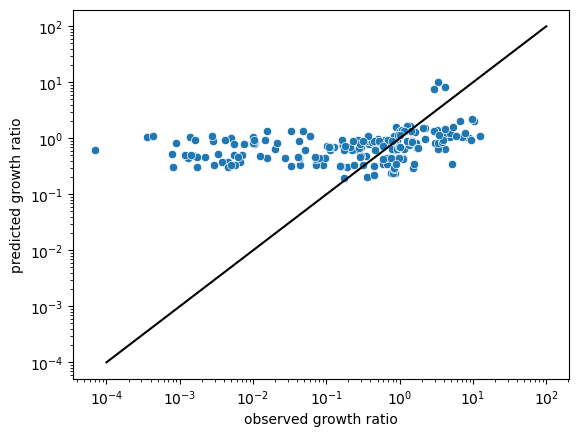

In [110]:
x = np.array(df_speciesAbun_super_agar_ratio.iloc[:, id_pass]).flatten()
y = np.array(growth_rate_all[num_iter - 1]).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.plot([1e-4, 1e2], [1e-4, 1e2], c="black")
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("observed growth ratio")
plt_.set_ylabel("predicted growth ratio")

In [216]:
growth_rate_all = {}
growth_rate_all[0] = pd.DataFrame()
count_p = 7
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
pass_ = 0
id_pass = [pass_, pass_ + 5, pass_ + 10]
# df_speciesAbun_prev_tmp_ = df_speciesAbun_super_agar_prev.iloc[:, id_pass].copy()
# df_speciesAbun_prev_tmp_ = df_speciesAbun_mucin_prev.iloc[:, id_pass].copy()
df_speciesAbun_prev_tmp_ = df_speciesAbun_prev_mdl.iloc[:, id_pass].copy()

for col_ in df_speciesAbun_prev_tmp_.columns.values:
    # growth_rate_all[0][col_] = np.ones((num_species))
    growth_rate_all[0][col_] = np.ones((num_species))


num_iter = 100
for iter_ in range(num_iter):
    if iter_ == 0:
        iter_id = iter_
    else:
        iter_id = iter_ - 1

    if (iter_ == 0) & (pass_ != 0):
        df_growth_rate = \
            compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                            df_speciesAbun_prev_tmp_.copy(), \
                                            p_vec_new[count_p], Ri_avg.copy(), \
                                            # growth_ratio_prev_.copy(), \
                                            growth_rate_all[iter_id].copy(), \
                                            None, df_speciesMetab_cluster,
                                            norm_=False)
    else:
        df_growth_rate = \
            compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                               df_speciesAbun_prev_tmp_.copy(), \
                                               p_vec_new[count_p], Ri_avg.copy(), \
                                               growth_rate_all[iter_id].copy(), \
                                               None, df_speciesMetab_cluster,
                                               norm_=False)

    growth_rate_all[iter_] = df_growth_rate.copy()

Text(0, 0.5, 'predicted growth ratio agar')

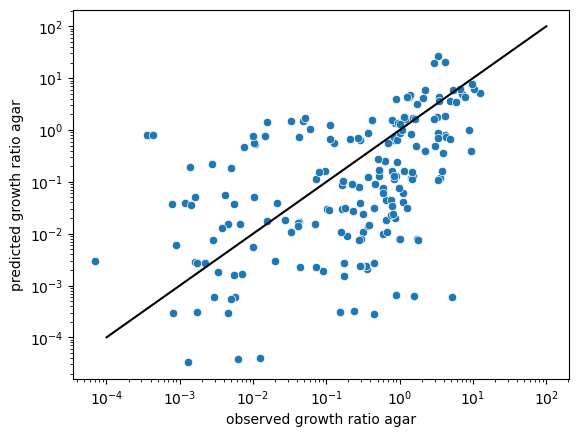

In [176]:
x = np.array(df_speciesAbun_super_agar_ratio.iloc[:, id_pass]).flatten()
# x = np.array(df_speciesAbun_ratio_tmp_).flatten()
y = np.array(growth_rate_all[num_iter - 1]).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.plot([1e-4, 1e2], [1e-4, 1e2], c="black")
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("observed growth ratio agar")
plt_.set_ylabel("predicted growth ratio agar")

Text(0, 0.5, 'predicted growth ratio mucin')

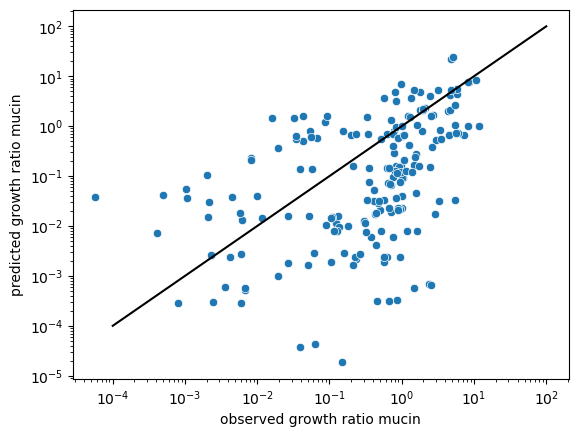

In [153]:
x = np.array(df_speciesAbun_mucin_ratio.iloc[:, id_pass]).flatten()
# x = np.array(df_speciesAbun_ratio_tmp_).flatten()
y = np.array(growth_rate_all[num_iter - 1]).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.plot([1e-4, 1e2], [1e-4, 1e2], c="black")
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("observed growth ratio mucin")
plt_.set_ylabel("predicted growth ratio mucin")

0.9145855991377142


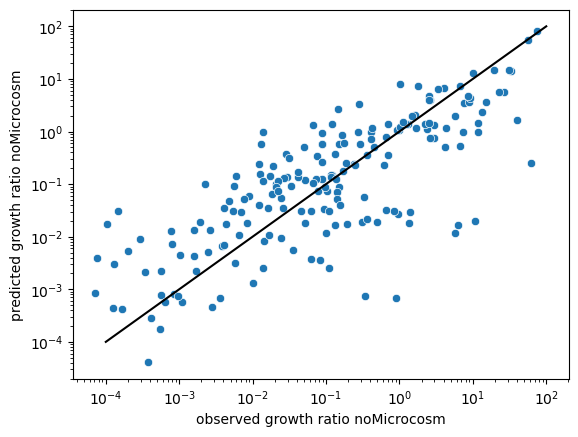

In [218]:
x = np.array(df_speciesAbun_ratio.iloc[:, id_pass]).flatten()
# x = np.array(df_speciesAbun_ratio_tmp_).flatten()
y = np.array(growth_rate_all[num_iter - 1]).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.plot([1e-4, 1e2], [1e-4, 1e2], c="black")
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("observed growth ratio noMicrocosm")
plt_.set_ylabel("predicted growth ratio noMicrocosm")
print(np.sqrt(np.mean(np.power(np.log10(x) - np.log10(y), 2))))

0.9266168758814293
[19]
0.9458332772806983


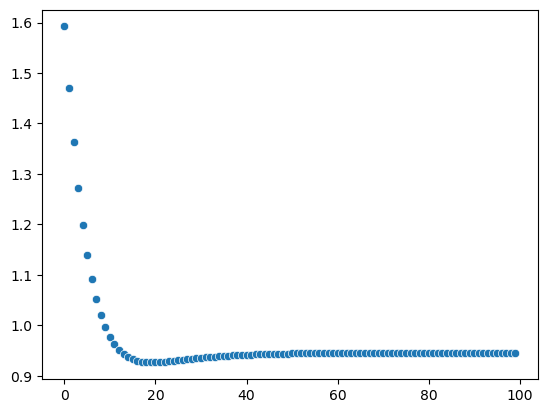

In [190]:
RMSE_vec = np.zeros((num_iter))
for iter_ in range(num_iter):
    x = np.log10(np.array(df_speciesAbun_ratio.iloc[:, id_pass]).flatten())
    y = np.log10(np.array(growth_rate_all[iter_]).flatten())
    RMSE_vec[iter_] = np.sqrt(np.mean(np.power(x - y, 2)))
x = np.arange(num_iter)
y = np.array(RMSE_vec)
plt_ = sns.scatterplot(x=x, y=y)
# plt_.set_yscale("log", base=2)
print(np.min(y))

id_ = np.where(y <= np.min(y))[0]
print(id_)
print(y[num_iter - 1])

## Iterate for inoculum

In [221]:
pass_ = 1
id_pass = [pass_, pass_ + 5, pass_ + 10]
# df_speciesAbun_prev_tmp_ = df_speciesAbun_super_agar_prev.iloc[:, id_pass].copy()
# df_speciesAbun_prev_tmp_ = df_speciesAbun_mucin_prev.iloc[:, id_pass].copy()
df_speciesAbun_prev_tmp_ = df_speciesAbun_prev_mdl.iloc[:, id_pass].copy()
df_speciesAbun_prev_tmp_

,p3_r0,p3_r1,p3_r2
0,1.232587e-04,1.509550e-04,6.802839e-04
1,2.143392e-01,1.983694e-01,2.045056e-01
2,7.893345e-02,9.603154e-03,4.933659e-03
3,1.000000e-08,1.277543e-06,7.965272e-07
4,2.583468e-05,4.145522e-05,1.118852e-04
...,...,...,...
58,2.872359e-02,1.592495e-02,9.989043e-03
59,9.021892e-05,3.475236e-05,3.758673e-05
60,2.920661e-03,2.737841e-03,2.531160e-03
61,1.000000e-08,1.000000e-08,1.000000e-08


In [222]:
growth_rate_all = {}
growth_rate_all[0] = pd.DataFrame()
count_p = 7
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
pass_ = 1
id_pass = [pass_, pass_ + 5, pass_ + 10]
# df_speciesAbun_prev_tmp_ = df_speciesAbun_super_agar_prev.iloc[:, id_pass].copy()
# df_speciesAbun_prev_tmp_ = df_speciesAbun_mucin_prev.iloc[:, id_pass].copy()
df_speciesAbun_prev_tmp_ = df_speciesAbun_prev_mdl.iloc[:, id_pass].copy()

for col_ in df_speciesAbun_prev_tmp_.columns.values:
    # growth_rate_all[0][col_] = np.ones((num_species))
    growth_rate_all[0][col_] = np.ones((num_species))


num_iter = 100
for iter_ in range(num_iter):
    if iter_ == 0:
        iter_id = iter_
    else:
        iter_id = iter_ - 1

    if (iter_ == 0) & (pass_ != 0):
        df_growth_rate = \
            compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                            df_speciesAbun_prev_tmp_.copy(), \
                                            p_vec_new[count_p], Ri_avg.copy(), \
                                            # growth_ratio_prev_.copy(), \
                                            growth_rate_all[iter_id].copy(), \
                                            None, df_speciesMetab_cluster,
                                            norm_=False)
    else:
        df_growth_rate = \
            compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                               df_speciesAbun_prev_tmp_.copy(), \
                                               p_vec_new[count_p], Ri_avg.copy(), \
                                               growth_rate_all[iter_id].copy(), \
                                               None, df_speciesMetab_cluster,
                                               norm_=False)

    growth_rate_all[iter_] = df_growth_rate.copy()

1.3684316447534277
PearsonRResult(statistic=0.3674057057161776, pvalue=7.684824649651443e-07)
SignificanceResult(statistic=0.35757263031626657, pvalue=1.5765981375221433e-06)


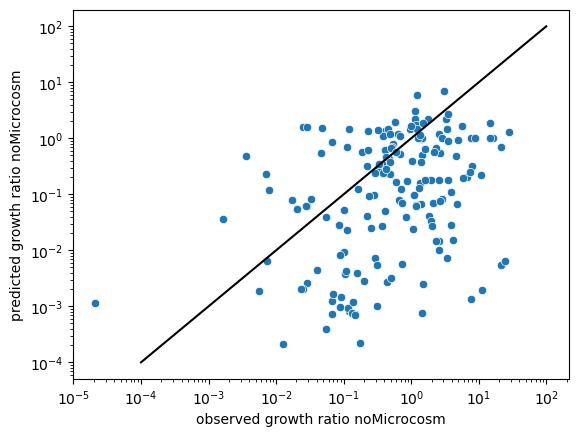

In [231]:
x = np.array(df_speciesAbun_ratio.iloc[:, id_pass]).flatten()
# x = np.array(df_speciesAbun_ratio_tmp_).flatten()
y = np.array(growth_rate_all[num_iter - 1]).flatten()
id_ = np.where(x > 0)[0]
x = x[id_]
y = y[id_]
plt_ = sns.scatterplot(x=x, y=y)
plt_.plot([1e-4, 1e2], [1e-4, 1e2], c="black")
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("observed growth ratio noMicrocosm")
plt_.set_ylabel("predicted growth ratio noMicrocosm")
print(np.sqrt(np.mean(np.power(np.log10(x) - np.log10(y), 2))))
print(scipy.stats.pearsonr(np.log10(x), np.log10(y)))
print(scipy.stats.spearmanr(np.log10(x), np.log10(y)))

0.82960078754367
[2]
1.3684316447534277


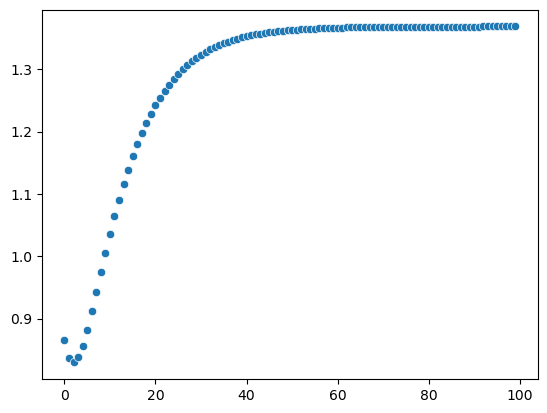

In [227]:
RMSE_vec = np.zeros((num_iter))
for iter_ in range(num_iter):
    x = (np.array(df_speciesAbun_ratio.iloc[:, id_pass]).flatten())
    y = (np.array(growth_rate_all[iter_]).flatten())
    id_ = np.where(x > 0)[0]
    x = x[id_]
    y = y[id_]
    x = np.log10(x)
    y = np.log10(y)
    RMSE_vec[iter_] = np.sqrt(np.mean(np.power(x - y, 2)))
x = np.arange(num_iter)
y = np.array(RMSE_vec)
plt_ = sns.scatterplot(x=x, y=y)
# plt_.set_yscale("log", base=2)
print(np.min(y))

id_ = np.where(y <= np.min(y))[0]
print(id_)
print(y[num_iter - 1])

## predict from inoc to passage 1

In [257]:
growth_rate_all = {}
growth_rate_all[0] = pd.DataFrame()
count_p = 7
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
# Ri_avg = np.exp(-mdl_fit[0])
pass_ = 1
id_pass = [pass_, pass_ + 5, pass_ + 10]
# df_speciesAbun_prev_tmp_ = df_speciesAbun_super_agar_prev.iloc[:, id_pass].copy()
# df_speciesAbun_prev_tmp_ = df_speciesAbun_mucin_prev.iloc[:, id_pass].copy()
df_speciesAbun_prev_tmp_ = df_speciesAbun_inoc.copy()

for col_ in df_speciesAbun_prev_tmp_.columns.values:
    # growth_rate_all[0][col_] = np.ones((num_species))
    growth_rate_all[0][col_] = np.ones((num_species))


num_iter = 100
for iter_ in range(num_iter):
    if iter_ == 0:
        iter_id = iter_
    else:
        iter_id = iter_ - 1

    if (iter_ == 0) & (pass_ != 0):
        df_growth_rate = \
            compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                            df_speciesAbun_prev_tmp_.copy(), \
                                            p_vec_new[count_p], Ri_avg.copy(), \
                                            # growth_ratio_prev_.copy(), \
                                            growth_rate_all[iter_id].copy(), \
                                            None, df_speciesMetab_cluster,
                                            norm_=False)
    else:
        df_growth_rate = \
            compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                               df_speciesAbun_prev_tmp_.copy(), \
                                               p_vec_new[count_p], Ri_avg.copy(), \
                                               growth_rate_all[iter_id].copy(), \
                                               None, df_speciesMetab_cluster,
                                               norm_=False)

    growth_rate_all[iter_] = df_growth_rate.copy()

In [258]:
df_speciesAbun_prev_tmp_

,inoculum
Acidaminococcus fermentans DSMZ 20731,0.009492
Acidaminococcus intestini D21 BEI HM-81,0.007298
Anaerostipes caccae DSMZ 14662,0.044081
Anaerotruncus colihominis DSMZ 17241,0.005461
Bacteroides caccae ATCC 43185,0.043142
...,...
Ruminococcus gnavus ATCC 29149,0.010984
Ruminococcus torques ATCC 27756,0.010870
Slackia exigua ATCC 700122,0.002198
Streptococcus thermophilus LMD-9 ATCC 19258,0.000785


1.5429766375518024
PearsonRResult(statistic=0.2129388857827812, pvalue=0.09382009315377474)
SignificanceResult(statistic=0.17314708141321045, pvalue=0.1747599488065906)


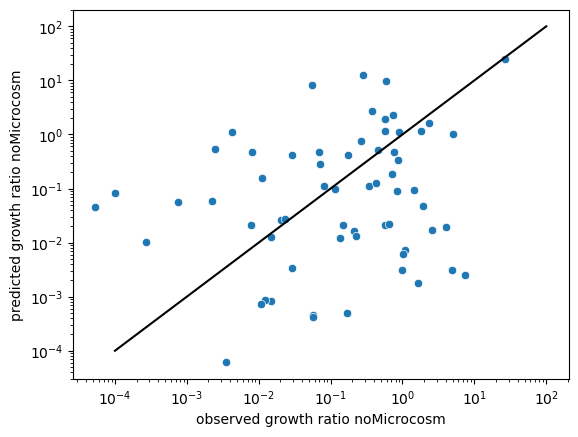

In [259]:
pass_ = 0
id_pass = [pass_, pass_ + 6, pass_ + 12]
x = np.array(df_speciesAbun.iloc[:, id_pass])
for col_ in range(x.shape[1]):
    x[:, col_] /= np.array(df_speciesAbun_inoc.copy()).flatten()
x = 10**np.mean(np.log10(x), axis=1).flatten()
# x = np.array(df_speciesAbun_ratio_tmp_).flatten()
iter_ = num_iter - 1
y = np.array(growth_rate_all[iter_]).flatten()
id_ = np.where(x > 0)[0]
x = x[id_]
y = y[id_]
plt_ = sns.scatterplot(x=x, y=y)
plt_.plot([1e-4, 1e2], [1e-4, 1e2], c="black")
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("observed growth ratio noMicrocosm")
plt_.set_ylabel("predicted growth ratio noMicrocosm")
print(np.sqrt(np.mean(np.power(np.log10(x) - np.log10(y), 2))))
print(scipy.stats.pearsonr(np.log10(x), np.log10(y)))
print(scipy.stats.spearmanr(np.log10(x), np.log10(y)))

1.3542788581902039
[6]
1.5429766375518024


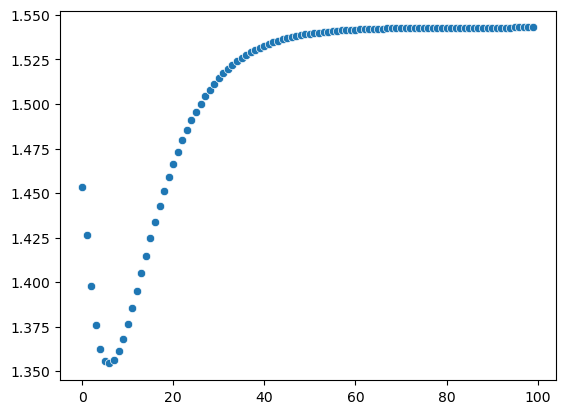

In [260]:
RMSE_vec = np.zeros((num_iter))
for iter_ in range(num_iter):
    x = np.array(df_speciesAbun.iloc[:, id_pass])
    for col_ in range(x.shape[1]):
        x[:, col_] /= np.array(df_speciesAbun_inoc.copy()).flatten()
    x = 10**np.mean(np.log10(x), axis=1).flatten()
    y = (np.array(growth_rate_all[iter_]).flatten())
    id_ = np.where(x > 0)[0]
    x = x[id_]
    y = y[id_]
    x = np.log10(x)
    y = np.log10(y)
    RMSE_vec[iter_] = np.sqrt(np.mean(np.power(x - y, 2)))
x = np.arange(num_iter)
y = np.array(RMSE_vec)
plt_ = sns.scatterplot(x=x, y=y)
# plt_.set_yscale("log", base=2)
print(np.min(y))

id_ = np.where(y <= np.min(y))[0]
print(id_)
print(y[num_iter - 1])

In [205]:
def model_adjust_Ri(x, *Ri):
    growth_rate_all = {}
    growth_rate_all[0] = pd.DataFrame()
    Ri_avg = np.exp(-np.array(Ri))
    p_tmp = x['p_tmp']
    df_speciesMetab_cluster = x['df_speciesMetab_cluster']
    df_speciesAbun_prev_tmp_ = x['df_speciesAbun_prev'].copy()
    for col_ in df_speciesAbun_prev_tmp_.columns.values:
        growth_rate_all[0][col_] = np.ones((num_species))


    num_iter = 30
    for iter_ in range(num_iter):
        if iter_ == 0:
            iter_id = iter_
        else:
            iter_id = iter_ - 1

        if (iter_ == 0) & (pass_ != 0):
            df_growth_rate = \
                compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                                df_speciesAbun_prev_tmp_.copy(), \
                                                p_tmp, Ri_avg, \
                                                # growth_ratio_prev_.copy(), \
                                                growth_rate_all[iter_id].copy(), \
                                                None, df_speciesMetab_cluster,
                                                norm_=False)
        else:
            df_growth_rate = \
                compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                                   df_speciesAbun_prev_tmp_.copy(), \
                                                   p_tmp, Ri_avg, \
                                                   growth_rate_all[iter_id].copy(), \
                                                   None, df_speciesMetab_cluster,
                                                   norm_=False)

        growth_rate_all[iter_] = df_growth_rate.copy()
        
    return np.log10(np.array(growth_rate_all[num_iter - 1]).flatten())

In [206]:
count_p = 7
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg == 0] = 1e-12
pass_ = 0
id_pass = [pass_, pass_ + 5, pass_ + 10]
df_speciesAbun_prev_tmp_ = df_speciesAbun_prev.iloc[:, id_pass].copy()
x = {}
x['p_tmp'] = p_vec_new[count_p]
x['df_speciesMetab_cluster'] = df_speciesMetab_cluster.copy()
x['df_speciesAbun_prev'] = df_speciesAbun_prev_tmp_
ydata = np.log10(np.array(df_speciesAbun_ratio.iloc[:, id_pass]).flatten())
mdl_fit  = curve_fit(model_adjust_Ri, x, ydata, 
                      p0=-np.log(Ri_avg), bounds=(0, np.inf))

3.1036941238904405


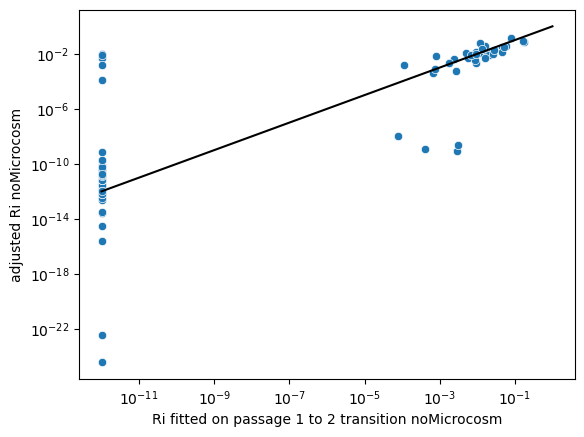

In [211]:
x = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
x[x == 0] = 1e-12
# x = np.array(df_speciesAbun_ratio_tmp_).flatten()
y = np.exp(-mdl_fit[0])
y[y == 0] = 1e-12
plt_ = sns.scatterplot(x=x, y=y)
plt_.plot([1e-12, 1e0], [1e-12, 1e0], c="black")
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_ylabel("adjusted Ri noMicrocosm")
plt_.set_xlabel("Ri fitted on passage 1 to 2 transition noMicrocosm")

print(np.sqrt(np.mean(np.power(np.log10(x) - np.log10(y), 2))))

In [210]:
np.exp(-mdl_fit[0])

array([3.65940906e-02, 7.61058058e-12, 3.44261968e-02, 3.46763619e-11,
       1.30342393e-01, 9.53285858e-03, 4.55303342e-11, 7.77511978e-02,
       1.64256202e-11, 5.21963872e-11, 2.17317379e-03, 3.52538903e-12,
       1.28133352e-11, 6.26923598e-13, 1.98421769e-12, 3.34802401e-02,
       4.57975788e-03, 2.46515923e-13, 1.16641388e-11, 1.43455116e-02,
       3.81047352e-23, 3.70803758e-11, 2.32135117e-11, 5.33456721e-03,
       8.97041278e-03, 1.13090487e-02, 1.88524483e-12, 1.25791833e-11,
       6.68144062e-12, 5.71601913e-11, 2.74983640e-11, 7.97089016e-03,
       3.41528527e-03, 8.81256879e-12, 2.14786417e-12, 3.05667824e-15,
       6.06535388e-02, 1.44001517e-02, 5.92090568e-04, 8.03887808e-12,
       4.45378571e-11, 2.74301018e-11, 1.40263760e-02, 3.01545857e-12,
       1.24864587e-11, 9.21483566e-13, 1.14132660e-08, 1.36982781e-11,
       4.17119134e-04, 3.26582596e-13, 7.67055268e-03, 3.31075214e-11,
       4.93827255e-03, 2.94704355e-02, 2.99863822e-12, 6.58098097e-11,
      

## predict growth ratio with adjusted Ri

In [212]:
growth_rate_all = {}
growth_rate_all[0] = pd.DataFrame()
count_p = 7
Ri_avg = np.exp(-mdl_fit[0].copy())
pass_ = 0
id_pass = [pass_, pass_ + 5, pass_ + 10]
df_speciesAbun_prev_tmp_ = df_speciesAbun_prev.iloc[:, id_pass].copy()
# df_speciesAbun_prev_tmp_ = df_speciesAbun_mucin_prev.iloc[:, id_pass].copy()
# df_speciesAbun_prev_tmp_ = df_speciesAbun_prev_mdl.iloc[:, id_pass].copy()
for col_ in df_speciesAbun_prev_tmp_.columns.values:
    # growth_rate_all[0][col_] = np.ones((num_species))
    growth_rate_all[0][col_] = np.ones((num_species))


num_iter = 100
for iter_ in range(num_iter):
    if iter_ == 0:
        iter_id = iter_
    else:
        iter_id = iter_ - 1

    if (iter_ == 0) & (pass_ != 0):
        df_growth_rate = \
            compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                            df_speciesAbun_prev_tmp_.copy(), \
                                            p_vec_new[count_p], Ri_avg.copy(), \
                                            # growth_ratio_prev_.copy(), \
                                            growth_rate_all[iter_id].copy(), \
                                            None, df_speciesMetab_cluster,
                                            norm_=False)
    else:
        df_growth_rate = \
            compute_growth_ratio_iterate_blind(df_speciesAbun_prev_tmp_.copy(), \
                                               df_speciesAbun_prev_tmp_.copy(), \
                                               p_vec_new[count_p], Ri_avg.copy(), \
                                               growth_rate_all[iter_id].copy(), \
                                               None, df_speciesMetab_cluster,
                                               norm_=False)

    growth_rate_all[iter_] = df_growth_rate.copy()

0.8213354156699927


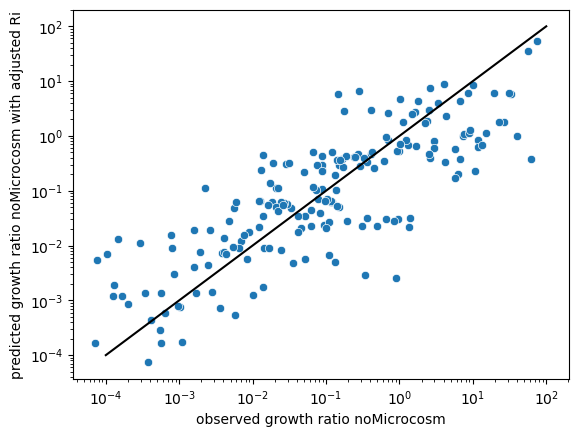

In [213]:
x = np.array(df_speciesAbun_ratio.iloc[:, id_pass]).flatten()
# x = np.array(df_speciesAbun_ratio_tmp_).flatten()
y = np.array(growth_rate_all[num_iter - 1]).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.plot([1e-4, 1e2], [1e-4, 1e2], c="black")
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("observed growth ratio noMicrocosm")
plt_.set_ylabel("predicted growth ratio noMicrocosm with adjusted Ri")

print(np.sqrt(np.mean(np.power(np.log10(x) - np.log10(y), 2))))

In [261]:
count_p = 7
# Ri_tmp = np.exp(-mdl_fit[0].copy())
Ri_tmp = Ri_noMicrocosm_dynamicAll_fit_avg[count_p].copy()
# id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_avg[count_p])
id_order = np.argsort(-Ri_tmp)
Ri_order = Ri_tmp.copy()
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['Ri'] = Ri_tmp.copy()
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[range(20), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
7,7,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.170053
92,92,1,[218],[PYROGLUTAMIC ACID],0.162396
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.081052
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE...",0.057110
53,53,1,[179],[3'-CMP],0.050726
37,37,1,[163],[BETA-LACTOSE],0.045554
15,15,1,[141],[2-HYDROXY-2-METHYLBUTYRIC ACID],0.039668
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.027435
66,66,1,[192],[CYTOSINE],0.025693
19,19,1,[145],[CYSTINE],0.023667


In [262]:
df_metabs_clusters_order.iloc[range(20), 3].values

array([list(['MANNOSE 6-PHOSPHATE', 'GLUCOSE', 'SUCROSE_1', 'GLYCERIC ACID', '1,6-ANHYDRO-B-GLUCOSE', 'HYPOXANTHINE', 'N-ACETYLNEURAMINATE']),
       list(['PYROGLUTAMIC ACID']),
       list(['BETA-ALANINE_0', 'OMEGA-HYDROXYDODECANOIC ACID', 'IS_PHENYLALANINE-2,3,4,5,6-D5_0', 'IS_D15-OCTANOIC ACID_0', 'IS_D19-DECANOIC ACID_0', 'IS_TRIDECANOIC ACID_0', 'IS_D27-TETRADECANOIC ACID_0', 'XANTHINE', '4-ACETAMIDOPHENOL', '3-HYDROXYPHENYLACETIC ACID', 'CADAVERINE', 'CHOLINE', 'LUMICHROME', 'PYRIDOXAMINE', 'SUBERIC ACID']),
       list(["5'-METHYLTHIOADENOSINE", 'ADENINE', 'NICOTINAMIDE', "S-(5'-ADENOSYL)-L-HOMOCYSTEINE", 'URACIL']),
       list(["3'-CMP"]), list(['BETA-LACTOSE']),
       list(['2-HYDROXY-2-METHYLBUTYRIC ACID']),
       list(['N-ACETYLTRYPTOPHAN']), list(['CYTOSINE']),
       list(['CYSTINE']), list(['3-FUROIC ACID']),
       list(['IS_PHENYLALANINE-2,3,4,5,6-D5_1']),
       list(['N-METHYL-ASPARTIC ACID_0', 'STEARIC ACID', 'CITRIC ACID', 'CITRAMALIC ACID', 'ITACONIC ACID', 'AC

In [130]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_temp12'))
df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
# df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
df_speciesAbun_inoc_tmp = pd.DataFrame()
df_speciesAbun_inoc_tmp["inoc"] = 
blindly_pred_abun_growth(p_vec_new, df_speciesMetab_cluster_tmp, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_dynamicAll_fit_joint, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False)

,p2_r0,p2_r1,p2_r2
0,0.003876,0.004024,0.014442
1,0.985640,0.912868,1.290270
2,2.584808,0.282980,0.144247
3,0.000131,0.013950,0.010127
4,0.000338,0.000570,0.001691
...,...,...,...
58,13.214210,5.783778,2.504370
59,0.330822,0.140253,0.153771
60,1.644080,1.502931,1.134514
61,0.025773,0.016188,0.012080


### 20230525: use lasso to remove metabolites and observe performance

In [276]:
date_ = '20230525'
n_repeats = 100
perc_metabs_keep = 0.9
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
count_p = 7
alpha_vec = 10**np.linspace(4, -4, 100)
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}', \
                                        f'sensitivity_analysis_with_p{p_vec_new[count_p]}_lasso_metabs_selection'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
# file_save = os.path.abspath(os.path.join(save_dir, 
#                                          f'{date_}_for_paper_Ri_fit_dynamic' + \
#                                          f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
#                                          f'.pickle'))
# Ri_dynamic_obj = {}
# metabs_kept = {}
num_metabs_clust = df_speciesMetab_cluster.shape[1]
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
RMSE_mat = np.zeros((len(alpha_vec), num_passages - 1, 2))
nnz_metabs = np.zeros((len(alpha_vec)))
for count_a, alpha_ in enumerate(alpha_vec):
    print(f'alpha loop = {count_a}')
    df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
    Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                            df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                            df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                            file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                            save_data=False, verbose=False, method="lasso", alpha=alpha_, \
                            use_loo=False)
    Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
    nnz_metabs[count_a] = len(np.where(Ri_avg > 0)[0])
    
    id_nnz = np.where(Ri_avg > 0)[0]
    if len(id_nnz) >= 5:
        df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_nnz]
        Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                                file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                                save_data=False, verbose=False, method="linear", alpha=alpha_, \
                                use_loo=False)
        Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
    
    Ri_fit = {0: Ri_avg}
    RMSE_sens_complete = np.zeros((num_passages - 1, 2))
    sens_obj_all, RMSE_obj_all = \
        blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                              df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                              df_speciesAbun_prev_mdl, \
                                              df_speciesAbun_ratio_mdl, \
                                              Ri_fit, "dummy", "dummy", \
                                              "dummy", num_passages=6, num_iter=100, \
                                              thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                              save_data_obj=False, \
                                              return_sensitivity_ana=True)
    for pass_ in range(num_passages - 1):
        RMSE_mat[count_a, pass_, 0] = RMSE_obj_all[pass_]["abundance"]
        RMSE_mat[count_a, pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]
    

alpha loop = 0
alpha loop = 1
alpha loop = 2
alpha loop = 3
alpha loop = 4
alpha loop = 5
alpha loop = 6
alpha loop = 7
alpha loop = 8
alpha loop = 9
alpha loop = 10
alpha loop = 11
alpha loop = 12
alpha loop = 13
alpha loop = 14
alpha loop = 15
alpha loop = 16
alpha loop = 17
alpha loop = 18
alpha loop = 19
alpha loop = 20
alpha loop = 21
alpha loop = 22
alpha loop = 23
alpha loop = 24
alpha loop = 25
alpha loop = 26
alpha loop = 27
alpha loop = 28
alpha loop = 29
alpha loop = 30
alpha loop = 31
alpha loop = 32
alpha loop = 33
alpha loop = 34
alpha loop = 35
alpha loop = 36
alpha loop = 37
alpha loop = 38
alpha loop = 39
alpha loop = 40
alpha loop = 41
alpha loop = 42
alpha loop = 43
alpha loop = 44
alpha loop = 45
alpha loop = 46
alpha loop = 47
alpha loop = 48
alpha loop = 49
alpha loop = 50
alpha loop = 51
alpha loop = 52
alpha loop = 53
alpha loop = 54
alpha loop = 55
alpha loop = 56
alpha loop = 57
alpha loop = 58
alpha loop = 59
alpha loop = 60
alpha loop = 61
alpha loop = 62
al

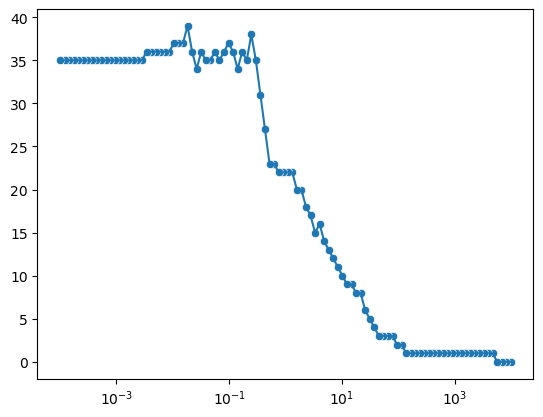

In [277]:
y = nnz_metabs
x = alpha_vec
id_ = np.arange(100)
plt_ = sns.scatterplot(x=x[id_], y=y[id_])
plt_ = sns.lineplot(x=x[id_], y=y[id_])
plt_.set_xscale("log", base=10)

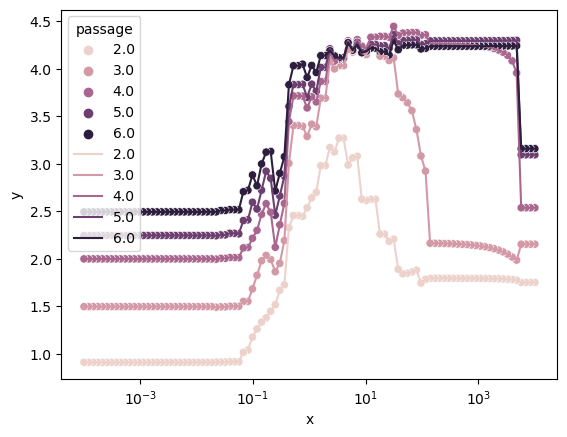

In [278]:
x = alpha_vec
y = RMSE_mat[:, :, 0].flatten()
x = np.zeros((len(alpha_vec), num_passages - 1))
passage_ = np.zeros((len(alpha_vec), num_passages - 1))
for pass_ in range(num_passages - 1):
    x[:, pass_] = alpha_vec.copy()
    passage_[:, pass_] = pass_ + 2
x = x.flatten()
passage_ = passage_.flatten()
df_plt = pd.DataFrame(data={"x" : x, "y" : y, "passage" : passage_})

plt_ = sns.scatterplot(data=df_plt, x="x", y="y", hue="passage")
plt_ = sns.lineplot(data=df_plt, x="x", y="y", hue="passage")
plt_.set_xscale("log", base=10)

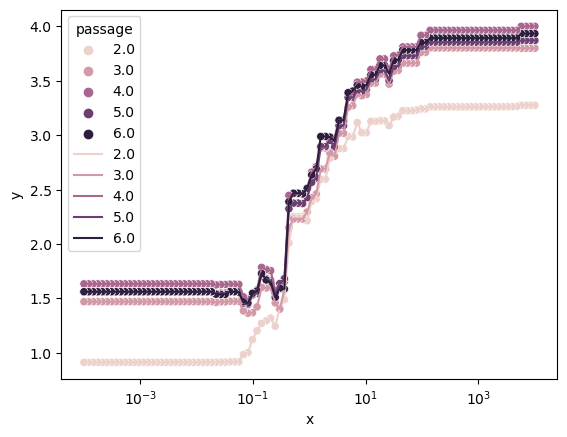

In [281]:
x = alpha_vec
y = RMSE_mat[:, :, 1].flatten()
x = np.zeros((len(alpha_vec), num_passages - 1))
passage_ = np.zeros((len(alpha_vec), num_passages - 1))
for pass_ in range(num_passages - 1):
    x[:, pass_] = alpha_vec.copy()
    passage_[:, pass_] = pass_ + 2
x = x.flatten()
passage_ = passage_.flatten()
df_plt = pd.DataFrame(data={"x" : x, "y" : y, "passage" : passage_})

plt_ = sns.scatterplot(data=df_plt, x="x", y="y", hue="passage")
plt_ = sns.lineplot(data=df_plt, x="x", y="y", hue="passage")
plt_.set_xscale("log", base=10)

In [285]:
id_ = np.where(RMSE_mat[:, 1, 1] == np.min(RMSE_mat[:, 1, 1]))[0][0]
alpha_vec[id_]

0.08111308307896856

In [287]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
# Ri_fit = {0: Ri_noMicrocosm_dynamicAll_fit_joint[count_p]}
id_nnz = np.where(Ri_noMicrocosm_dynamicAll_fit_joint[count_p] > 0)[0]
df_speciesMetab_tmp = df_speciesMetab_cluster.iloc[:, id_nnz].copy()
Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                        df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                        file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                        save_data=False, verbose=False, method="linear", alpha=alpha_, \
                        use_loo=False)
Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
Ri_fit = {0: Ri_avg}
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                          df_speciesAbun_prev_mdl, \
                                          df_speciesAbun_ratio_mdl, \
                                          Ri_fit, save_dir, save_dir, \
                                          save_dir, num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=True, \
                                          save_data_obj=True, \
                                          return_sensitivity_ana=True)

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1875: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1876: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2001: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2002: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1875: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

In [288]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}_inoc'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
# Ri_fit = {0: Ri_noMicrocosm_dynamicAll_fit_joint[count_p]}
id_nnz = np.where(Ri_noMicrocosm_dynamicAll_fit_joint[count_p] > 0)[0]
df_speciesMetab_tmp = df_speciesMetab_cluster.iloc[:, id_nnz].copy()
Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                        df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                        file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                        save_data=False, verbose=False, method="linear", alpha=alpha_, \
                        use_loo=False)
Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
Ri_fit = {0: Ri_avg}
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                          df_speciesAbun_prev_mdl, \
                                          df_speciesAbun_ratio_mdl, \
                                          Ri_fit, save_dir, save_dir, \
                                          save_dir, num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=True, \
                                          save_data_obj=True, \
                                          return_sensitivity_ana=True)

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1408: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1409: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1548: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1549: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1408: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

In [290]:
id_nnz_metabs = np.where(Ri_noMicrocosm_dynamicAll_fit_joint[count_p] > 0)[0]

date_ = '20230525'
n_repeats = 100
perc_metabs_keep = 0.9
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
count_p = 7
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_remove_single_metabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
# file_save = os.path.abspath(os.path.join(save_dir, 
#                                          f'{date_}_for_paper_Ri_fit_dynamic' + \
#                                          f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
#                                          f'.pickle'))
# Ri_dynamic_obj = {}
# metabs_kept = {}
num_metabs_clust = df_speciesMetab_cluster.shape[1]
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
RMSE_mat = np.zeros((len(id_nnz_metabs), num_passages - 1, 2))
nnz_metabs = np.zeros((len(id_nnz_metabs)))
for count_a, id_rm in enumerate(id_nnz_metabs):
    print(f'loop = {count_a}')
    df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
    id_keep = list(set(range(num_metabs_clust)) - set([id_rm]))
    df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
    Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                            df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                            df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                            file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                            save_data=False, verbose=False, method="linear", alpha=0, \
                            use_loo=False)
    Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
    Ri_tmp = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
    Ri_tmp = Ri_tmp[id_keep]
    nnz_metabs[count_a] = len(np.where((Ri_avg > 0) & (Ri_tmp == 0))[0])

    
    Ri_fit = {0: Ri_avg}
    RMSE_sens_complete = np.zeros((num_passages - 1, 2))
    sens_obj_all, RMSE_obj_all = \
        blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                              df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                              df_speciesAbun_prev_mdl, \
                                              df_speciesAbun_ratio_mdl, \
                                              Ri_fit, "dummy", "dummy", \
                                              "dummy", num_passages=6, num_iter=100, \
                                              thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                              save_data_obj=False, \
                                              return_sensitivity_ana=True)
    for pass_ in range(num_passages - 1):
        RMSE_mat[count_a, pass_, 0] = RMSE_obj_all[pass_]["abundance"]
        RMSE_mat[count_a, pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]
    

loop = 0
loop = 1
loop = 2
loop = 3
loop = 4
loop = 5
loop = 6
loop = 7
loop = 8
loop = 9
loop = 10
loop = 11
loop = 12
loop = 13
loop = 14
loop = 15
loop = 16
loop = 17
loop = 18
loop = 19
loop = 20
loop = 21
loop = 22
loop = 23
loop = 24
loop = 25
loop = 26
loop = 27
loop = 28
loop = 29
loop = 30
loop = 31
loop = 32
loop = 33
loop = 34


In [291]:
RMSE_mat_full = np.zeros((num_passages - 1, 2))

df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                          df_speciesAbun_prev_mdl, \
                                          df_speciesAbun_ratio_mdl, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat_full[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat_full[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]
    

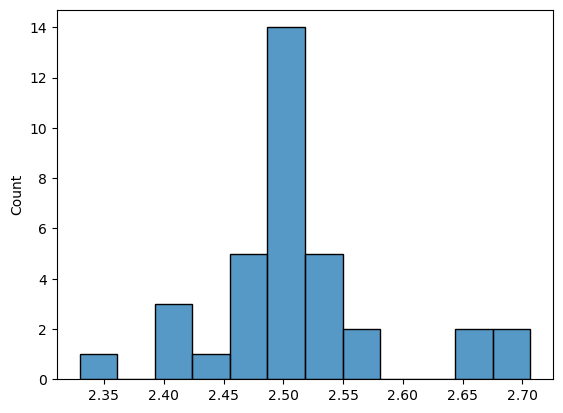

In [305]:
y = RMSE_mat[:, 4, 0].flatten()
plt_ = sns.histplot(x=y)

In [303]:
RMSE_mat_full[:, 0]

array([0.91344521, 1.49869795, 2.00010674, 2.24655865, 2.49406527])

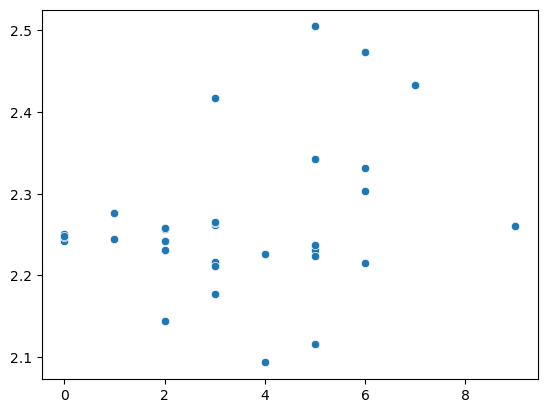

In [310]:
plt_ = sns.scatterplot(x=nnz_metabs, y=RMSE_mat[:, 3, 0].flatten())

In [315]:
num_metabs_rm = 40
metab_rm_list = []
RMSE_traj = np.zeros((num_metabs_rm, 2))

date_ = '20230525'
n_repeats = 100
perc_metabs_keep = 0.9
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
count_p = 7
num_metabs_clust = df_speciesMetab_cluster.shape[1]
for l_ in range(num_metabs_rm):
    print(f'loop = {l_}')
    if l_ == 0:
        id_nnz_metabs = np.where(Ri_noMicrocosm_dynamicAll_fit_joint[count_p] > 0)[0]
    else:
        id_nnz_metabs = np.where(Ri_running > 0)[0]
    
    # Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
    #                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
    #                                 df_speciesAbun_ratio_mdl, p_vec_new, \
    #                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
    RMSE_mat = np.zeros((len(id_nnz_metabs), num_passages - 1, 2))
    nnz_metabs = np.zeros((len(id_nnz_metabs)))
    error_ = np.inf
    for count_a, id_rm in enumerate(id_nnz_metabs):
#         print(f'loop = {count_a}')
        df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
        id_rm_list = metab_rm_list + [id_rm]
        id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))
        df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
        Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                                file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                                save_data=False, verbose=False, method="linear", alpha=0, \
                                use_loo=False)
        
        Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
        Ri_tmp = np.zeros((num_metabs_clust))
        Ri_tmp[id_keep] = Ri_avg.copy()
#         nnz_metabs[count_a] = len(np.where((Ri_avg > 0) & (Ri_tmp == 0))[0])


        Ri_fit = {0: Ri_avg}
        RMSE_sens_complete = np.zeros((num_passages - 1, 2))
        sens_obj_all, RMSE_obj_all = \
            blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                                  df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                                  df_speciesAbun_prev_mdl, \
                                                  df_speciesAbun_ratio_mdl, \
                                                  Ri_fit, "dummy", "dummy", \
                                                  "dummy", num_passages=6, num_iter=100, \
                                                  thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                                  save_data_obj=False, \
                                                  return_sensitivity_ana=True)
        for pass_ in range(num_passages - 1):
            RMSE_mat[count_a, pass_, 0] = RMSE_obj_all[pass_]["abundance"]
            RMSE_mat[count_a, pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]
            
    id_ = np.where(RMSE_mat[:, 0, 0] == np.min(RMSE_mat[:, 0, 0]))[0][0]
    df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
    id_rm_list = metab_rm_list + [id_nnz_metabs[id_]]
    id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))
    df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
    Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                            df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                            df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                            file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                            save_data=False, verbose=False, method="linear", alpha=0, \
                            use_loo=False)

    Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
    Ri_running = np.zeros((num_metabs_clust))
    Ri_running[id_keep] = Ri_avg.copy()
    metab_rm_list += [id_nnz_metabs[id_]]
    RMSE_traj[l_, 0] = RMSE_mat[id_, 0, 0]
    RMSE_traj[l_, 1] = RMSE_mat[id_, 0, 1]
    
    

loop = 0
loop = 1
loop = 2
loop = 3
loop = 4
loop = 5
loop = 6
loop = 7
loop = 8
loop = 9
loop = 10
loop = 11
loop = 12
loop = 13
loop = 14
loop = 15
loop = 16
loop = 17
loop = 18
loop = 19
loop = 20
loop = 21
loop = 22
loop = 23
loop = 24
loop = 25
loop = 26
loop = 27
loop = 28
loop = 29
loop = 30
loop = 31
loop = 32
loop = 33
loop = 34
loop = 35
loop = 36
loop = 37
loop = 38
loop = 39


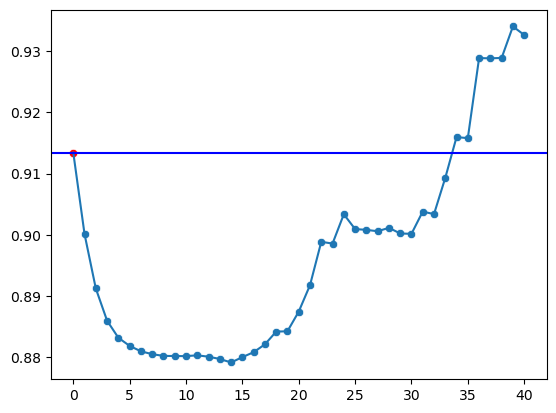

In [316]:
pass_ = 1
plt_ = sns.lineplot(x=range(num_metabs_rm + 1), y=[RMSE_mat_full[0, 0]] + \
                    list(RMSE_traj[:, 0].flatten()))
plt_ = sns.scatterplot(x=np.arange(num_metabs_rm) + 1, \
                       y=list(RMSE_traj[:, 0].flatten()))
plt_ = sns.scatterplot(x=[0], \
                       y=[RMSE_mat_full[0, 0]], c="red")
plt_.axhline(y=RMSE_mat_full[0, 0], c="blue")

In [322]:
RMSE_mat = np.zeros((num_passages - 1, 2))
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
id_rm_list = list(np.array(metab_rm_list)[range(14)])
id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                        df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                        file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                        save_data=False, verbose=False, method="linear", alpha=0, \
                        use_loo=False)

Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
Ri_fit = {0: Ri_avg}
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                          df_speciesAbun_prev_mdl, \
                                          df_speciesAbun_ratio_mdl, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]

In [324]:
RMSE_mat[:, 0]

array([0.87911065, 1.40008412, 1.85972165, 2.13155734, 2.44358187])

In [326]:
RMSE_mat_full[:, 0]

array([0.91344521, 1.49869795, 2.00010674, 2.24655865, 2.49406527])

In [348]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_remove_single_metabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
# Ri_fit = {0: Ri_noMicrocosm_dynamicAll_fit_joint[count_p]}
id_nnz = np.where(Ri_noMicrocosm_dynamicAll_fit_joint[count_p] > 0)[0]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
id_rm_list = list(np.array(metab_rm_list)[range(10)])
# id_rm_list = []
id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))

df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                        df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                        file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                        save_data=False, verbose=False, method="linear", alpha=alpha_, \
                        use_loo=False, df_speciesAbun_ratio_nonoise=df_speciesAbun_ratio_mdl)
Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
id_rm_more = list(np.where(Ri_avg == 0)[0])
id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list + list(np.array(id_keep)[id_rm_more])))
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                        df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                        file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                        save_data=False, verbose=False, method="linear", alpha=alpha_, \
                        use_loo=False, df_speciesAbun_ratio_nonoise=df_speciesAbun_ratio_mdl)
Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
Ri_fit = {0: Ri_avg}
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                          df_speciesAbun_prev_mdl, \
                                          df_speciesAbun_ratio_mdl, \
                                          Ri_fit, save_dir, save_dir, \
                                          save_dir, num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=True, \
                                          save_data_obj=True, \
                                          return_sensitivity_ana=True)

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

In [337]:
df_metabs_clusters_keep = df_metabs_clusters.iloc[id_keep, :].copy()
id_order = np.argsort(-Ri_avg)
Ri_order = Ri_avg.copy()
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters_keep.copy()
df_metabs_clusters_order['Ri'] = Ri_avg
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[:, :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE...",0.143195
92,92,1,[218],[PYROGLUTAMIC ACID],0.125528
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.119426
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.117273
53,53,1,[179],[3'-CMP],0.051941
37,37,1,[163],[BETA-LACTOSE],0.051328
15,15,1,[141],[2-HYDROXY-2-METHYLBUTYRIC ACID],0.050695
19,19,1,[145],[CYSTINE],0.024193
24,24,1,[150],"[IS_PHENYLALANINE-2,3,4,5,6-D5_1]",0.021261
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.019992


In [368]:
date_ = '20230525'
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
count_p = 7
num_metabs_clust = df_speciesMetab_cluster.shape[1]
noise_fac = np.linspace(5, 15, 11) / 10
num_rep = 20
RMSE_traj = np.zeros((num_rep, num_passages - 1, 2))
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
Ri_avg = np.zeros((num_metabs_clust))
for l_ in range(num_rep):
    print(f'loop = {l_}')
    
    fac_ = np.random.choice(noise_fac, 1, replace=True)
    df_speciesAbun_prev_tmp = df_speciesAbun_prev_mdl.copy()
    df_speciesAbun_prev_tmp *= fac_ * np.ones_like(df_speciesAbun_prev_mdl)
    fac_ = np.random.choice(noise_fac, 1, replace=True)
    df_speciesAbun_ratio_tmp = df_speciesAbun_ratio_mdl.copy()
    df_speciesAbun_ratio_tmp *= (fac_ / 4) * np.ones_like(df_speciesAbun_prev_mdl)
    df_speciesAbun_next_tmp = df_speciesAbun_next_mdl.copy()

    df_speciesAbun_prev_noise = df_speciesAbun_prev_tmp.copy()
    df_speciesAbun_ratio_noise = df_speciesAbun_ratio_tmp.copy()
    df_speciesAbun_next_noise = df_speciesAbun_next_tmp.copy()
    df_speciesAbun_ratio_nonoise = df_speciesAbun_ratio_mdl.copy()

    Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                            df_speciesAbun_prev_noise, df_speciesAbun_next_noise, \
                            df_speciesAbun_ratio_noise, [p_vec_new[count_p]], \
                            file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                            save_data=False, verbose=False, method="linear", alpha=0, \
                            use_loo=False, df_speciesAbun_ratio_nonoise=df_speciesAbun_ratio_nonoise)

    Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
# Ri_avg /= num_rep
    Ri_fit = {0: Ri_avg}
    sens_obj_all, RMSE_obj_all = \
        blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                              df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                              df_speciesAbun_prev_mdl, \
                                              df_speciesAbun_ratio_mdl, \
                                              Ri_fit, "dummy", "dummy", \
                                              "dummy", num_passages=6, num_iter=100, \
                                              thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                              save_data_obj=False, \
                                              return_sensitivity_ana=True)
    for pass_ in range(num_passages - 1):
        RMSE_traj[l_, pass_, 0] = RMSE_obj_all[pass_]["abundance"]
        RMSE_traj[l_, pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]    

loop = 0
loop = 1
loop = 2
loop = 3
loop = 4
loop = 5
loop = 6
loop = 7
loop = 8
loop = 9
loop = 10
loop = 11
loop = 12
loop = 13
loop = 14
loop = 15
loop = 16
loop = 17
loop = 18
loop = 19


### Fit dynamic Ri for passage 1 to 2 with all metabolites and no clusters

In [189]:
date_ = '20230523'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_rm = [1, 2, 3, 4]
Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
                                df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                                df_speciesAbun_next_mdl.iloc[:, id_keep], \
                                df_speciesAbun_ratio_mdl.iloc[:, id_keep], p_vec_new, \
                                file_save, num_passages=5, pass_rm=pass_rm, num_brep=3)
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[3, 4])
# Ri_dynamic_obj = fit_ss_Ri(df_speciesMetab, df_speciesAbun_mdl, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, \
#                                       file_save, num_passages=6, pass_rm=[0, 1, 2])
# Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
#                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                        df_speciesAbun_ratio_mdl, \
#                        file_save=file_save, num_passages=6, pass_rm=pass_rm)
    
with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001
count = 1, p_tmp = 0.01
count = 2, p_tmp = 0.05
count = 3, p_tmp = 0.06
count = 4, p_tmp = 0.07
count = 5, p_tmp = 0.08
count = 6, p_tmp = 0.09
count = 7, p_tmp = 0.1
count = 8, p_tmp = 0.125
count = 9, p_tmp = 0.15
count = 10, p_tmp = 0.175
count = 11, p_tmp = 0.2
count = 12, p_tmp = 0.3
count = 13, p_tmp = 0.4
count = 14, p_tmp = 0.5
count = 15, p_tmp = 0.55
count = 16, p_tmp = 0.6
count = 17, p_tmp = 0.65
count = 18, p_tmp = 0.7


In [42]:
# Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_steadyState_fit_all']
# Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_steadyState_fit_avg']
# Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_steadyState_fit_joint']

# Ri_noMicrocosm_dynamicAll_fit_joint = {}
# for count_p in range(len(p_vec_new)):
#     Ri_noMicrocosm_dynamicAll_fit_joint[count_p] = Ri_dynamic_obj['Ri_noMicrocosm_steadyState_fit_joint'].copy()

In [26]:
date_ = '20230523'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 

In [190]:
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [191]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}', \
                                        f'RHS_vs_LHS', 'dynamic'))

if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_for_paper_RHS_vs_LHS_dynamic_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab, df_speciesAbun_prev_mdl, \
                      df_speciesAbun_next_mdl, df_speciesAbun_ratio_mdl, save_file, pass_rm=[0, 2, 3, 4], \
                      num_passages=5, fit_type="dynamic", p_tmp=p_tmp)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 1, p = 0.01


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 2, p = 0.05


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 3, p = 0.06


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 4, p = 0.07


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 5, p = 0.08


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 6, p = 0.09


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 7, p = 0.1


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 8, p = 0.125


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 9, p = 0.15


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 10, p = 0.175


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 11, p = 0.2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 12, p = 0.3


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 13, p = 0.4


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 14, p = 0.5


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 15, p = 0.55


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 16, p = 0.6


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 17, p = 0.65


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 18, p = 0.7


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


In [379]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}', \
                                        f'RHS_vs_LHS', 'steady_state'))

if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_for_paper_RHS_vs_LHS_steady_state' + \
                                             f'_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab, df_speciesAbun_mdl, \
                      df_speciesAbun_mdl, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
                      num_passages=6, fit_type="steady_state", p_tmp=p_tmp)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 1, p = 0.01


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 2, p = 0.05


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 3, p = 0.06


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 4, p = 0.07


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 5, p = 0.08


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 6, p = 0.09


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 7, p = 0.1


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 8, p = 0.125


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 9, p = 0.15


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 10, p = 0.175


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 11, p = 0.2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 12, p = 0.3


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 13, p = 0.4


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 14, p = 0.5


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 15, p = 0.55


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 16, p = 0.6


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 17, p = 0.65


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 18, p = 0.7


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1192: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1193: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2093: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2094: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microb

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2093: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2094: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2093: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2094: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/uti

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2093: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2094: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microb

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2093: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2094: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2093: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2094: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/uti

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2093: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2094: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microb

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2093: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2094: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2093: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2094: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/uti

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2093: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2094: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1967: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1968: UserWarning: FixedFormatter should only be used together with FixedLocator
  save_dir = \
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microb

KeyboardInterrupt: 

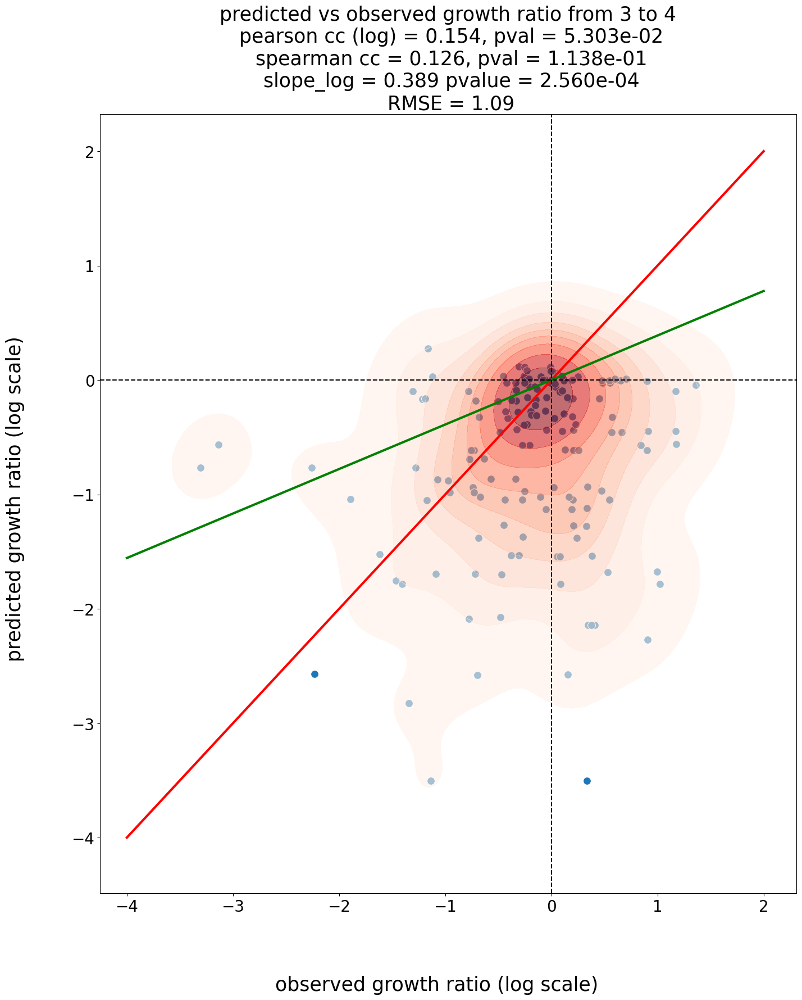

In [36]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}'))
# df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
# df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth_without_inoc(p_vec_new, df_speciesMetab, \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_dynamicAll_fit_joint, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False)

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1965: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2090: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2091: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1964: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

KeyboardInterrupt: 

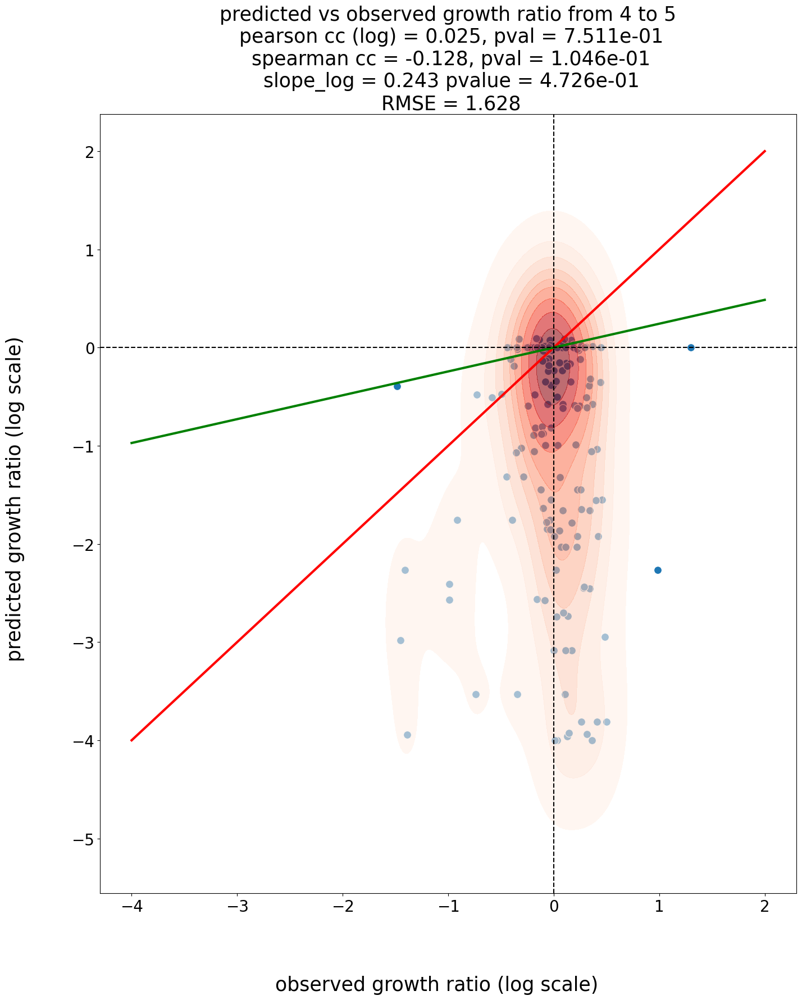

In [28]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}_agar'))
# df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
# df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth_without_inoc(p_vec_new, df_speciesMetab, \
                         df_speciesAbun_inoc, df_speciesAbun_super_agar, \
                         df_speciesAbun_super_agar_prev, \
                         df_speciesAbun_super_agar_ratio, \
                         Ri_noMicrocosm_dynamicAll_fit_joint, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False)

In [202]:
num_metabs_rm = 200
metab_rm_list = []
RMSE_traj = np.zeros((num_metabs_rm, 2))

date_ = '20230525'
n_repeats = 100
perc_metabs_keep = 0.9
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
count_p = 7
num_metabs_clust = df_speciesMetab.shape[1]
for l_ in range(num_metabs_rm):
    print(f'loop = {l_}')
    if l_ == 0:
        id_nnz_metabs = np.where(Ri_noMicrocosm_dynamicAll_fit_joint[count_p] > 0)[0]
    else:
        id_nnz_metabs = np.where(Ri_running > 0)[0]
    
    # Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
    #                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
    #                                 df_speciesAbun_ratio_mdl, p_vec_new, \
    #                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
    RMSE_mat = np.zeros((len(id_nnz_metabs), num_passages - 1, 2))
    nnz_metabs = np.zeros((len(id_nnz_metabs)))
    error_ = np.inf
    for count_a, id_rm in enumerate(id_nnz_metabs):
#         print(f'loop = {count_a}')
        df_speciesMetab_tmp = df_speciesMetab.copy()
        id_rm_list = metab_rm_list + [id_rm]
        id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))
        df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
        Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                                file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                                save_data=False, verbose=False, method="linear", alpha=0, \
                                use_loo=False)
        
        Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
        Ri_tmp = np.zeros((num_metabs_clust))
        Ri_tmp[id_keep] = Ri_avg.copy()
#         nnz_metabs[count_a] = len(np.where((Ri_avg > 0) & (Ri_tmp == 0))[0])


        Ri_fit = {0: Ri_avg}
        RMSE_sens_complete = np.zeros((num_passages - 1, 2))
        sens_obj_all, RMSE_obj_all = \
            blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                                  df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                                  df_speciesAbun_prev_mdl, \
                                                  df_speciesAbun_ratio_mdl, \
                                                  Ri_fit, "dummy", "dummy", \
                                                  "dummy", num_passages=6, num_iter=100, \
                                                  thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                                  save_data_obj=False, \
                                                  return_sensitivity_ana=True)
        for pass_ in range(num_passages - 1):
            RMSE_mat[count_a, pass_, 0] = RMSE_obj_all[pass_]["abundance"]
            RMSE_mat[count_a, pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]
            
    id_ = np.where(RMSE_mat[:, 0, 0] == np.min(RMSE_mat[:, 0, 0]))[0][0]
    df_speciesMetab_tmp = df_speciesMetab.copy()
    id_rm_list = metab_rm_list + [id_nnz_metabs[id_]]
    id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))
    df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
    Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                            df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                            df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                            file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                            save_data=False, verbose=False, method="linear", alpha=0, \
                            use_loo=False)

    Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
    Ri_running = np.zeros((num_metabs_clust))
    Ri_running[id_keep] = Ri_avg.copy()
    metab_rm_list += [id_nnz_metabs[id_]]
    RMSE_traj[l_, 0] = RMSE_mat[id_, 0, 0]
    RMSE_traj[l_, 1] = RMSE_mat[id_, 0, 1]
    
save_obj = {"metab_rm_list" : metab_rm_list, \
            "RMSE_traj" : RMSE_traj}


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}'))
save_file = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_greedily_remove_metabs_nocluster' + \
                                         f'.pickle'))
with open(save_file, "wb") as file_:
     pickle.dump(save_obj, file_) 

loop = 0
loop = 1
loop = 2
loop = 3
loop = 4
loop = 5
loop = 6
loop = 7
loop = 8
loop = 9
loop = 10
loop = 11
loop = 12
loop = 13
loop = 14
loop = 15
loop = 16
loop = 17
loop = 18
loop = 19
loop = 20
loop = 21
loop = 22
loop = 23
loop = 24
loop = 25
loop = 26
loop = 27
loop = 28
loop = 29
loop = 30
loop = 31
loop = 32
loop = 33
loop = 34
loop = 35
loop = 36
loop = 37
loop = 38
loop = 39
loop = 40
loop = 41
loop = 42
loop = 43
loop = 44
loop = 45
loop = 46
loop = 47
loop = 48
loop = 49
loop = 50
loop = 51
loop = 52
loop = 53
loop = 54
loop = 55
loop = 56
loop = 57
loop = 58
loop = 59
loop = 60
loop = 61
loop = 62
loop = 63
loop = 64
loop = 65
loop = 66
loop = 67
loop = 68
loop = 69
loop = 70
loop = 71
loop = 72
loop = 73
loop = 74
loop = 75
loop = 76
loop = 77
loop = 78
loop = 79
loop = 80
loop = 81
loop = 82
loop = 83
loop = 84
loop = 85
loop = 86
loop = 87
loop = 88
loop = 89
loop = 90
loop = 91
loop = 92
loop = 93
loop = 94
loop = 95
loop = 96
loop = 97
loop = 98
loop = 99
loop = 100

In [204]:
save_obj = {"metab_rm_list" : metab_rm_list, \
            "RMSE_traj" : RMSE_traj}


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
save_file = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_greedily_remove_metabs_nocluster' + \
                                         f'.pickle'))
with open(save_file, "wb") as file_:
     pickle.dump(save_obj, file_) 

In [205]:
RMSE_mat_full = np.zeros((num_passages - 1, 2))

df_speciesMetab_tmp = df_speciesMetab.copy()
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                          df_speciesAbun_prev_mdl, \
                                          df_speciesAbun_ratio_mdl, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat_full[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat_full[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]
    

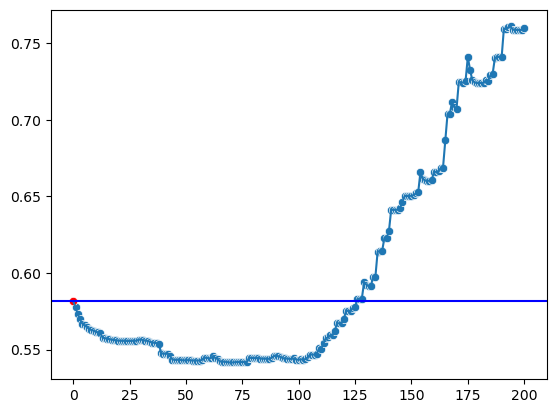

In [206]:
pass_ = 1
num_ = num_metabs_rm
id_ = np.arange(num_)
plt_ = sns.lineplot(x=range(num_ + 1), y=[RMSE_mat_full[0, 0]] + \
                    list(RMSE_traj[id_, 0].flatten()))
plt_ = sns.scatterplot(x=np.arange(num_) + 1, \
                       y=list(RMSE_traj[id_, 0].flatten()))
plt_ = sns.scatterplot(x=[0], \
                       y=[RMSE_mat_full[0, 0]], c="red")
plt_.axhline(y=RMSE_mat_full[0, 0], c="blue")

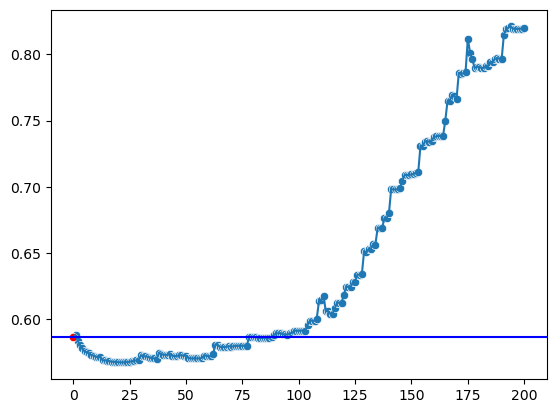

In [208]:
pass_ = 1
num_ = num_metabs_rm
id_ = np.arange(num_)
plt_ = sns.lineplot(x=range(num_ + 1), y=[RMSE_mat_full[0, 1]] + \
                    list(RMSE_traj[id_, 1].flatten()))
plt_ = sns.scatterplot(x=np.arange(num_) + 1, \
                       y=list(RMSE_traj[id_, 1].flatten()))
plt_ = sns.scatterplot(x=[0], \
                       y=[RMSE_mat_full[0, 1]], c="red")
plt_.axhline(y=RMSE_mat_full[0, 1], c="blue")

In [211]:
metab_names[np.array(metab_rm_list)[range(50)]]

array(['PYRUVIC ACID', '1-METHYLGUANIDINE', 'ETHYL 4-AMINOBENZOIC ACID',
       'HYPOXANTHINE', 'HEPTADECANOIC ACID', 'MALEAMIC ACID',
       'RAC-GLYCEROL 1-MYRISTATE', 'PROPIONYLCARNITINE',
       'N-ACETYL-METHIONINE', 'SUCROSE_0', 'PHENYLETHANOLAMINE',
       '3-HYDROXYPROPIONIC ACID', 'GLYCINE', 'CINNAMIC ACID', 'SPERMINE',
       'THYMIDINE', 'PROLINE', 'CINNAMALDEHYDE', 'CYTOSINE', 'OLEIC ACID',
       'DEOXYCYTIDINE', 'RIBOFLAVIN', '1-METHYL-HYDANTOIN',
       '5-METHYLCYTOSINE', 'LINOLEIC ACID', '1-METHYLADENOSINE',
       'PANTOTHENIC ACID', 'XANTHURENIC ACID',
       '1,2-DIDECANOYL-SN-GLYCERO-3-PHOSPHOCHOLINE', 'SPERMIDINE',
       'IS_4-BROMO-PHENYLALANINE_0', 'IS_D27-TETRADECANOIC ACID_0',
       "5'-METHYLTHIOADENOSINE", 'METHYL BETA-GALACTOSIDE',
       '4-ETHYLOCTANOIC ACID', '2-AMINO-2-METHYLPROPANOIC ACID',
       'ACETYLCHOLINE', '1,6-ANHYDRO-B-GLUCOSE',
       'IS_INDOLE-2,4,5,6,7-D5-3-ACETIC ACID_1', 'TRANEXAMIC ACID',
       'N-ACETYL-TYROSINE', 'ETHANOLAMINE PHO

### fit dyanmic Ri after removing metabolites from greedy search

In [281]:
date_ = '20230523'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_remove_metabs_greedy'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
pass_keep = np.arange(num_passages - 1)
# id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
# training using 2 replicates
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1)
pass_rm = [2, 3, 4]
# pass_rm = [0, 1]
id_metabs_rm = np.array(metab_rm_list)[range(70)]
id_metabs = np.arange(df_speciesMetab.shape[1])
id_metabs = list(set(list(id_metabs)) - set(list(id_metabs_rm)))
df_speciesMetab_tmp = df_speciesMetab.iloc[:, id_metabs].copy()

# test on clusters
id_metabs = np.arange(df_speciesMetab_cluster.shape[1])
df_speciesMetab_tmp = df_speciesMetab_cluster.iloc[:, id_metabs].copy()
Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                                df_speciesAbun_next_mdl.iloc[:, id_keep], \
                                df_speciesAbun_ratio_mdl.iloc[:, id_keep], p_vec_new, \
                                file_save, num_passages=5, pass_rm=pass_rm, num_brep=2)
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[3, 4])
# Ri_dynamic_obj = fit_ss_Ri(df_speciesMetab, df_speciesAbun_mdl, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, \
#                                       file_save, num_passages=6, pass_rm=[0, 1, 2])
# Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
#                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                        df_speciesAbun_ratio_mdl, \
#                        file_save=file_save, num_passages=6, pass_rm=pass_rm)
    
with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


count = 1, p_tmp = 0.01
count = 2, p_tmp = 0.05
count = 3, p_tmp = 0.06
count = 4, p_tmp = 0.07
count = 5, p_tmp = 0.08
count = 6, p_tmp = 0.09
count = 7, p_tmp = 0.1
count = 8, p_tmp = 0.125
count = 9, p_tmp = 0.15
count = 10, p_tmp = 0.175
count = 11, p_tmp = 0.2
count = 12, p_tmp = 0.3
count = 13, p_tmp = 0.4
count = 14, p_tmp = 0.5


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)


count = 15, p_tmp = 0.55
count = 16, p_tmp = 0.6
count = 17, p_tmp = 0.65
count = 18, p_tmp = 0.7


In [282]:
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [214]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_remove_metabs_greedy', \
                                        f'RHS_vs_LHS', 'dynamic'))

if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_for_paper_RHS_vs_LHS_dynamic_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab.iloc[:, id_metabs].copy(), df_speciesAbun_prev_mdl, \
                      df_speciesAbun_next_mdl, df_speciesAbun_ratio_mdl, save_file, pass_rm=[0, 2, 3, 4], \
                      num_passages=5, fit_type="dynamic", p_tmp=p_tmp)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 1, p = 0.01


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 2, p = 0.05


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 3, p = 0.06


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 4, p = 0.07


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 5, p = 0.08


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 6, p = 0.09


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 7, p = 0.1


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 8, p = 0.125


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 9, p = 0.15


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 10, p = 0.175


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 11, p = 0.2


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 12, p = 0.3


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 13, p = 0.4


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 14, p = 0.5


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 15, p = 0.55


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 16, p = 0.6


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 17, p = 0.65


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 18, p = 0.7


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


In [215]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_remove_metabs_greedy'))
# df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
# df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth_without_inoc(p_vec_new, df_speciesMetab.iloc[:, id_metabs].copy(), \
                         df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl, \
                         Ri_noMicrocosm_dynamicAll_fit_joint, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False)

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

In [230]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_remove_metabs_greedy_start_at_passage2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
# df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
# df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_keep = np.arange(num_passages)
id_keep_2 = list(pass_keep) + list(pass_keep + num_passages) + list(pass_keep + 2 * num_passages)

# tmp Ri vec
Ri_fit = {}
for count_p in range(len(p_vec_new)):
    Ri_fit[count_p] = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
blindly_pred_abun_growth_without_inoc(p_vec_new, df_speciesMetab.iloc[:, id_metabs].copy(), \
                         df_speciesAbun_inoc, df_speciesAbun_mdl.iloc[:, id_keep_2], \
                         df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                         df_speciesAbun_ratio_mdl.iloc[:, id_keep], \
                         Ri_fit, save_dir, save_dir, \
                         save_dir, num_passages=6, num_iter=100, \
                         thresh_zero=1e-8, Ri_ss=False, num_brep=3)

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt

### Null model

In [283]:
count_p = 7
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# pass_keep = np.arange(1, num_passages - 1)
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_keep = np.arange(num_passages)
id_keep_2 = list(pass_keep) + list(pass_keep + num_passages) + list(pass_keep + 2 * num_passages)

# predict on third replicate
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep + 2 * (num_passages - 1))
pass_keep = np.arange(num_passages)
id_keep_2 = list(pass_keep + 2 * num_passages)
num_brep = 1


sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl.iloc[:, id_keep_2], \
                                          df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                                          df_speciesAbun_ratio_mdl.iloc[:, id_keep], \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True, num_brep=num_brep)

In [276]:
Ri_tmp = np.zeros((df_speciesMetab.shape[1]))
Ri_tmp[id_metabs] = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()

id_order = np.argsort(-Ri_tmp)
metab_names[id_order[range(30)]]
# Ri_tmp[id_order[range(30)]]

array(['MANNOSE 6-PHOSPHATE', 'SERINE', 'PYROGLUTAMIC ACID',
       'IS_4-CHLORO-PHENYLALANINE_2', 'PHENYLACETYLGLYCINE',
       '2,6-DIAMINOHEPTANEDIOIC ACID', 'IS_TRIDECANOIC ACID_1',
       'IS_D27-TETRADECANOIC ACID_1', 'OPHTHALMIC ACID', 'CYSTINE',
       'PYRIDOXAMINE', 'N6-(DELTA2-ISOPENTENYL)-ADENINE',
       '2-(4-HYDROXYPHENYL)PROPIONIC ACID', 'ADENOSINE',
       'IS_PHENYLALANINE-2,3,4,5,6-D5_1',
       'IS_PHENYLALANINE-2,3,4,5,6-D5_3', '3-METHOXYTYRAMINE',
       'CITRIC ACID', 'N-ACETYLTRYPTOPHAN', '2-AMINOBENZOIC ACID',
       'CAPRYLOYL GLYCINE', '5-HYDROXY-TRYPTOPHAN', 'BETA-LACTOSE',
       '4-AMINOBENZOIC ACID', '3-HYDROXY-2-METHYL-4-PYRONE',
       'IS_TRYPTOPHAN-2,4,5,6,7-D5_2', '8-HYDROXYQUINOLINE_1',
       '4-HYDROXYBENZALDEHYDE', 'HISTAMINE',
       'IS_TRYPTOPHAN-2,4,5,6,7-D5_0'], dtype=object)

In [285]:
id_order = np.argsort(-Ri_noMicrocosm_dynamicAll_fit_joint[count_p])
Ri_order = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_order = Ri_order[id_order]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['Ri'] = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order.iloc[range(20), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
7,7,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.209438
92,92,1,[218],[PYROGLUTAMIC ACID],0.128423
1,1,25,"[1, 6, 7, 24, 48, 62, 64, 66, 78, 83, 86, 90, ...","[NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ...",0.059492
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.053050
45,45,1,[171],[ACETYLCHOLINE],0.048321
90,90,1,[216],[PYRIDOXINE],0.028861
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.027330
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE...",0.027089
66,66,1,[192],[CYTOSINE],0.023083
37,37,1,[163],[BETA-LACTOSE],0.021652


row = 0, col = 0
row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_6443/2790158742.py:114: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)
/tmp/ipykernel_6443/2790158742.py:112: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_6443/2790158742.py:114: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_6443/2790158742.py:112: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


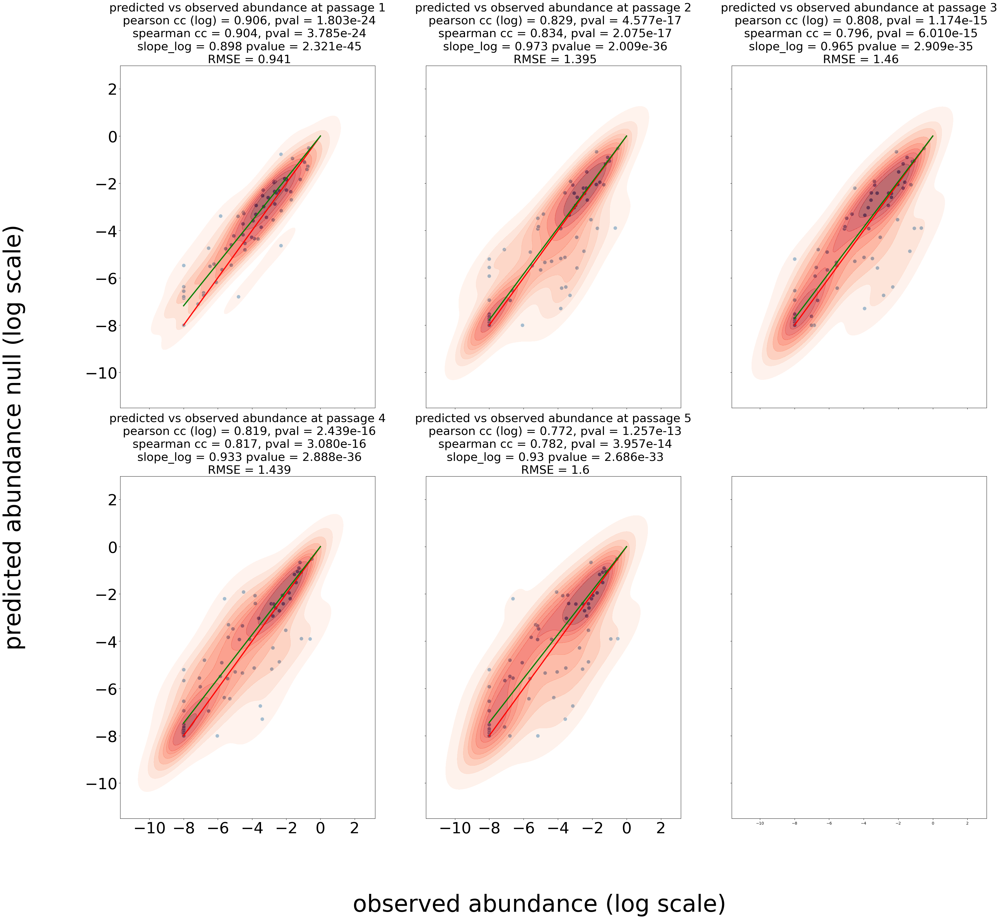

In [287]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance null (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 1:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = growth_rate_all.copy()

    b_ = range(3)
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages, \
#                                                     pass_ + 1 + 2 * num_passages]])
#     predict on 1 replicate
    x = \
        np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1 + 2 * num_passages]])
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 2, \
#                                                     pass_ + 2 + num_passages, \
#                                                     pass_ + 2 + 2 * num_passages]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_ + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + (num_passages - 1), \
#                                                     pass_ + 1 + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

# save_dir = \
#     os.path.abspath(os.path.join(dir_save_abun_obj, \
#                                     f'predicted_vs_observed_abundance_p{p_tmp}'))
# if not os.path.exists(save_dir):
#     # Create a new directory because it does not exist
#     os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance_' + \
#                                             f'consolidated' + \
#                                             f'_with_p{p_tmp}.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close(fig.figure)

In [241]:
count_p = 7
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
Ri_fit = {0: Ri_avg}
# pass_keep = np.arange(1, num_passages - 1)
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_keep = np.arange(num_passages)
id_keep_2 = list(pass_keep) + list(pass_keep + num_passages) + list(pass_keep + 2 * num_passages)
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab.iloc[:, id_metabs].copy(), \
                                          df_speciesAbun_inoc, df_speciesAbun_super_agar.iloc[:, id_keep_2], \
                                          df_speciesAbun_super_agar_prev.iloc[:, id_keep], \
                                          df_speciesAbun_super_agar_ratio.iloc[:, id_keep], \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True, num_brep=3)

row = 0, col = 0
row = 0, col = 1
row = 0, col = 2


/tmp/ipykernel_6443/1676324371.py:109: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 0
row = 1, col = 1


/tmp/ipykernel_6443/1676324371.py:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_6443/1676324371.py:109: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)
/tmp/ipykernel_6443/1676324371.py:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


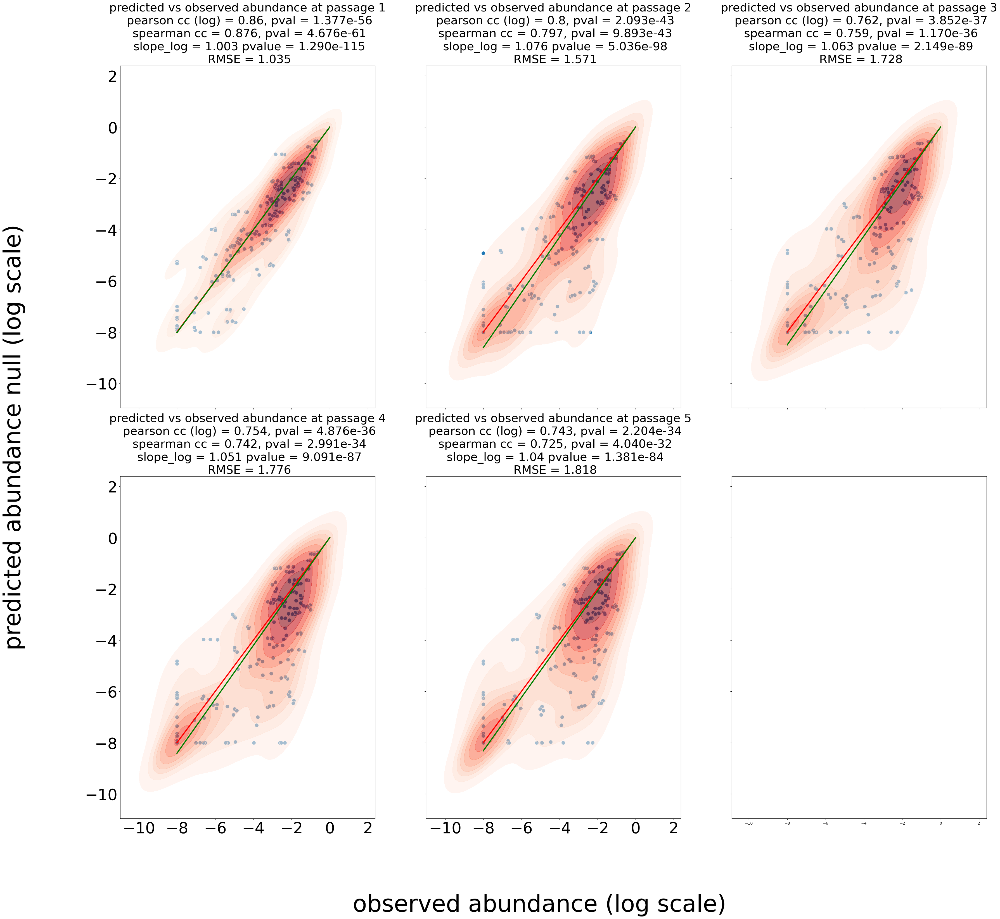

In [244]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance null (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 1:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = growth_rate_all.copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_super_agar.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 2, \
#                                                     pass_ + 2 + num_passages, \
#                                                     pass_ + 2 + 2 * num_passages]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + (num_passages - 1), \
#                                                     pass_ + 1 + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

# save_dir = \
#     os.path.abspath(os.path.join(dir_save_abun_obj, \
#                                     f'predicted_vs_observed_abundance_p{p_tmp}'))
# if not os.path.exists(save_dir):
#     # Create a new directory because it does not exist
#     os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance_' + \
#                                             f'consolidated' + \
#                                             f'_with_p{p_tmp}.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close(fig.figure)

In [245]:
count_p = 7
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
Ri_fit = {0: Ri_avg}
# pass_keep = np.arange(1, num_passages - 1)
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_keep = np.arange(num_passages)
id_keep_2 = list(pass_keep) + list(pass_keep + num_passages) + list(pass_keep + 2 * num_passages)
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab.iloc[:, id_metabs].copy(), \
                                          df_speciesAbun_inoc, df_speciesAbun_mucin.iloc[:, id_keep_2], \
                                          df_speciesAbun_mucin_prev.iloc[:, id_keep], \
                                          df_speciesAbun_mucin_ratio.iloc[:, id_keep], \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True, num_brep=3)

row = 0, col = 0
row = 0, col = 1


/tmp/ipykernel_6443/987482569.py:109: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 2
row = 1, col = 0
row = 1, col = 1


/tmp/ipykernel_6443/987482569.py:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_6443/987482569.py:109: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)
/tmp/ipykernel_6443/987482569.py:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


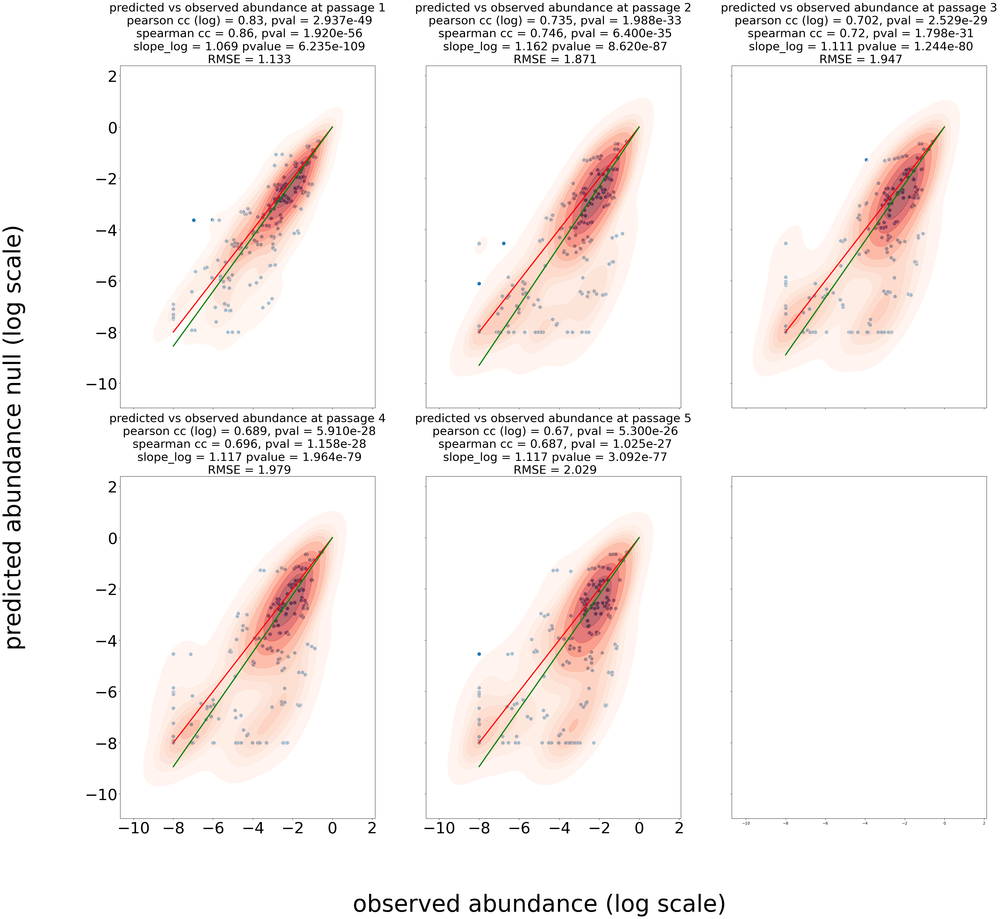

In [246]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance null (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 1:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = growth_rate_all.copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mucin.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 2, \
#                                                     pass_ + 2 + num_passages, \
#                                                     pass_ + 2 + 2 * num_passages]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + (num_passages - 1), \
#                                                     pass_ + 1 + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

# save_dir = \
#     os.path.abspath(os.path.join(dir_save_abun_obj, \
#                                     f'predicted_vs_observed_abundance_p{p_tmp}'))
# if not os.path.exists(save_dir):
#     # Create a new directory because it does not exist
#     os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance_' + \
#                                             f'consolidated' + \
#                                             f'_with_p{p_tmp}.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close(fig.figure)

## compare against null model

In [198]:
count_p = 7
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p]
Ri_fit = {0: Ri_avg}
# pass_keep = np.arange(1, num_passages - 1)
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_keep = np.arange(num_passages)
id_keep_2 = list(pass_keep) + list(pass_keep + num_passages) + list(pass_keep + 2 * num_passages)
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab.copy(), \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl.iloc[:, id_keep_2], \
                                          df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                                          df_speciesAbun_ratio_mdl.iloc[:, id_keep], \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True, num_brep=3)

In [197]:
df_speciesAbun_mdl.iloc[:, id_keep_2]

,p2_r0,p3_r0,p4_r0,p5_r0,p6_r0,p2_r1,p3_r1,p4_r1,p5_r1,p6_r1,p2_r2,p3_r2,p4_r2,p5_r2,p6_r2
Acidaminococcus fermentans DSMZ 20731,1.232587e-04,6.704587e-06,1.964384e-05,2.923860e-04,6.674918e-04,1.509550e-04,2.801973e-04,3.247537e-03,2.649064e-02,6.867454e-03,6.802839e-04,2.546092e-04,1.037398e-04,1.317724e-04,2.793396e-04
Acidaminococcus intestini D21 BEI HM-81,2.143392e-01,3.034948e-01,2.783072e-01,2.449287e-01,2.852345e-01,1.983694e-01,2.674704e-01,3.043407e-01,2.476548e-01,2.650648e-01,2.045056e-01,2.981957e-01,3.043595e-01,3.054243e-01,2.736223e-01
Anaerostipes caccae DSMZ 14662,7.893345e-02,4.178763e-02,1.553076e-02,2.513826e-02,7.685045e-03,9.603154e-03,3.142386e-02,1.700029e-02,2.282783e-02,6.528065e-03,4.933659e-03,1.727806e-02,7.776625e-03,6.220632e-02,8.449614e-03
Anaerotruncus colihominis DSMZ 17241,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.277543e-06,2.257240e-07,1.000000e-08,8.028099e-08,1.000000e-08,7.965272e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.575602e-07
Bacteroides caccae ATCC 43185,2.583468e-05,3.153010e-06,3.753517e-06,2.028774e-06,2.470496e-06,4.145522e-05,4.789548e-06,6.430825e-06,1.331149e-06,1.814534e-06,1.118852e-04,1.638908e-04,2.938171e-06,5.076057e-06,2.018581e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ruminococcus gnavus ATCC 29149,2.872359e-02,6.526354e-03,3.918121e-03,4.421267e-03,5.849030e-03,1.592495e-02,6.138713e-03,5.560732e-03,6.711834e-03,1.701515e-03,9.989043e-03,3.268566e-03,2.781552e-03,6.712029e-03,5.861230e-03
Ruminococcus torques ATCC 27756,9.021892e-05,2.965475e-06,4.094933e-06,1.882528e-05,1.090201e-05,3.475236e-05,5.534024e-05,1.792223e-05,6.581487e-05,4.976816e-05,3.758673e-05,4.198384e-05,3.080377e-05,1.010013e-05,8.941000e-05
Slackia exigua ATCC 700122,2.920661e-03,1.421295e-03,2.227100e-03,1.239252e-03,9.714653e-04,2.737841e-03,1.899006e-03,7.986064e-04,3.016710e-04,3.447447e-04,2.531160e-03,3.458196e-03,4.025108e-03,1.840863e-03,1.107381e-03
Streptococcus thermophilus LMD-9 ATCC 19258,1.000000e-08,8.662693e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.459906e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08


In [177]:
sens_obj_all[0]['growth_rate_all']

,p2_r0,p2_r1,p2_r2
0,0.019330,0.034310,0.039873
1,0.918236,0.980685,0.924437
2,0.290927,0.412402,0.463150
3,1.000000,0.002476,0.002486
4,0.000313,0.000287,0.000257
...,...,...,...
58,0.800322,1.476648,1.713307
59,0.443227,1.142454,0.832987
60,1.184703,1.174616,1.276405
61,1.000000,1.000000,1.000000


row = 0, col = 0
row = 0, col = 1


/tmp/ipykernel_6443/3515162461.py:109: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 2
row = 1, col = 0
row = 1, col = 1


/tmp/ipykernel_6443/3515162461.py:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_6443/3515162461.py:109: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)
/tmp/ipykernel_6443/3515162461.py:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


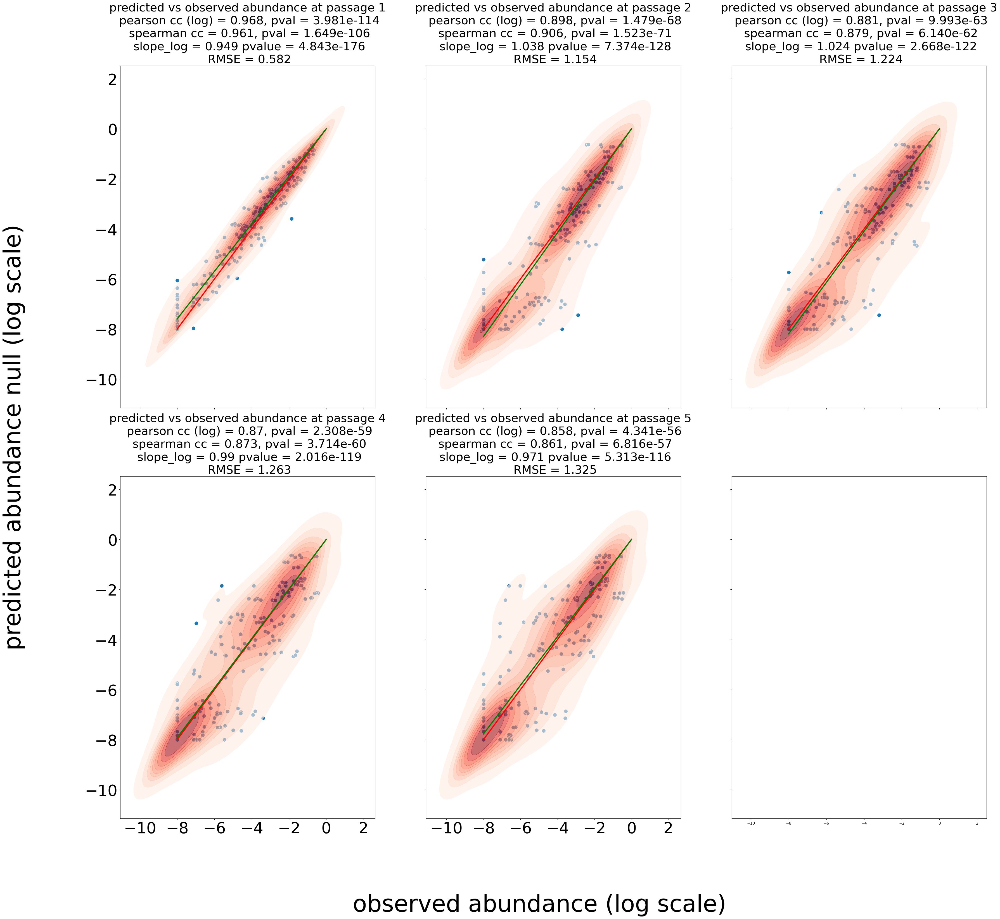

In [200]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance null (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 1:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = growth_rate_all.copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 2, \
#                                                     pass_ + 2 + num_passages, \
#                                                     pass_ + 2 + 2 * num_passages]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + (num_passages - 1), \
#                                                     pass_ + 1 + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

# save_dir = \
#     os.path.abspath(os.path.join(dir_save_abun_obj, \
#                                     f'predicted_vs_observed_abundance_p{p_tmp}'))
# if not os.path.exists(save_dir):
#     # Create a new directory because it does not exist
#     os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance_' + \
#                                             f'consolidated' + \
#                                             f'_with_p{p_tmp}.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close(fig.figure)

row = 0, col = 0
row = 0, col = 1


/tmp/ipykernel_6443/1375334154.py:109: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_6443/1375334154.py:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_6443/1375334154.py:109: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)
/tmp/ipykernel_6443/1375334154.py:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


row = 1, col = 1


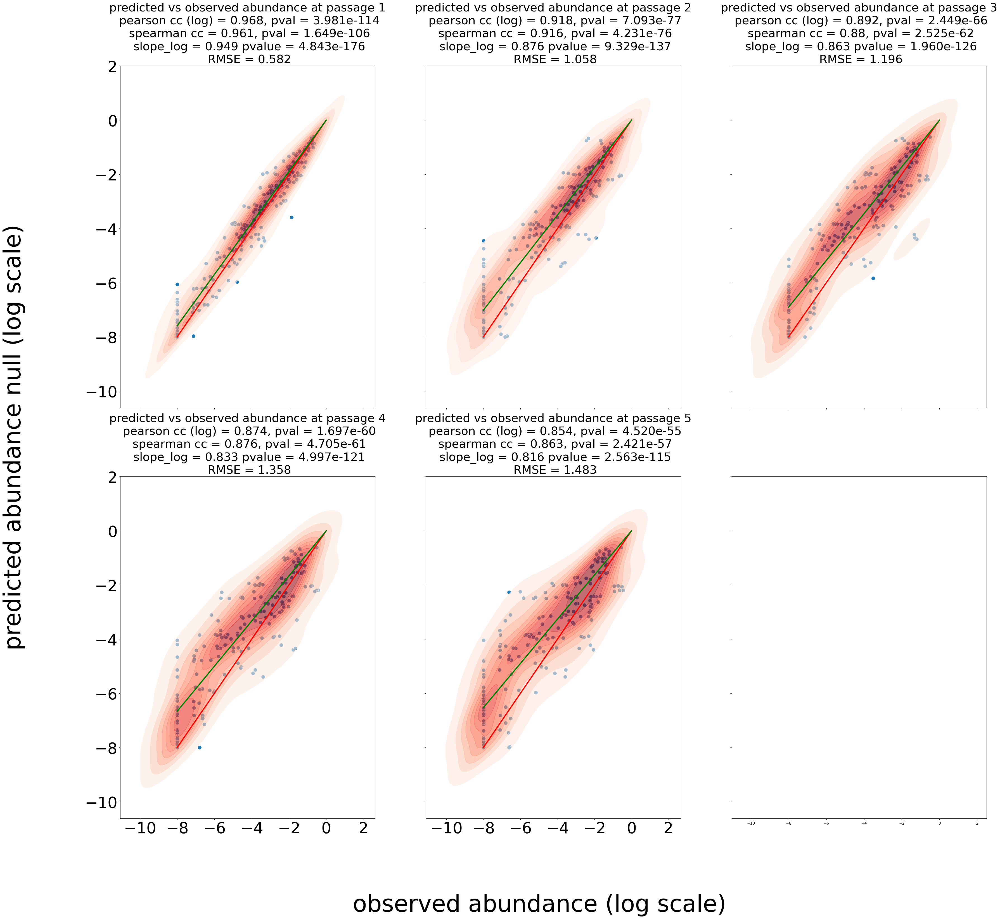

In [201]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance null (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 0:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = growth_rate_all.copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 2, \
#                                                     pass_ + 2 + num_passages, \
#                                                     pass_ + 2 + 2 * num_passages]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + (num_passages - 1), \
#                                                     pass_ + 1 + 2 * (num_passages - 1)]])
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

# save_dir = \
#     os.path.abspath(os.path.join(dir_save_abun_obj, \
#                                     f'predicted_vs_observed_abundance_p{p_tmp}'))
# if not os.path.exists(save_dir):
#     # Create a new directory because it does not exist
#     os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance_' + \
#                                             f'consolidated' + \
#                                             f'_with_p{p_tmp}.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close(fig.figure)

row = 0, col = 0
row = 0, col = 1


/tmp/ipykernel_6443/2508786796.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_6443/2508786796.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_6443/2508786796.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)
/tmp/ipykernel_6443/2508786796.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


row = 1, col = 1


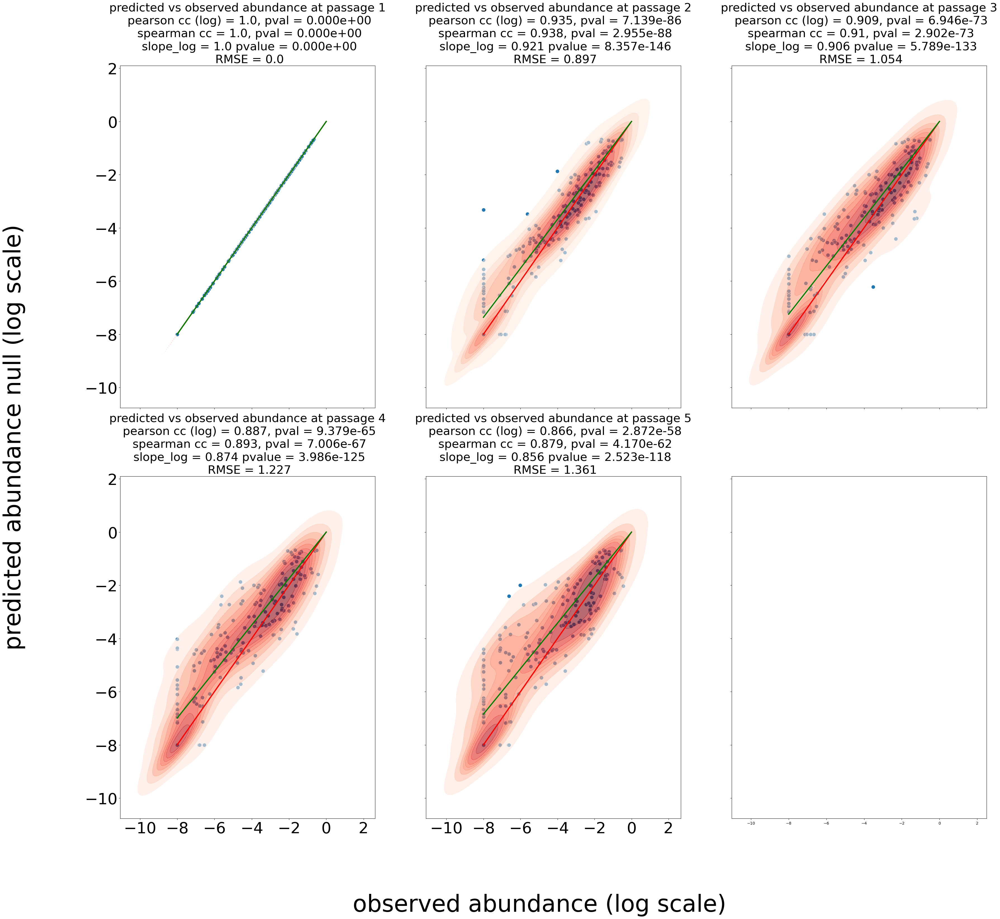

In [69]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance null (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ == 0:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
        df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
                                                    pass_ + (num_passages - 1), \
                                                    pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

# save_dir = \
#     os.path.abspath(os.path.join(dir_save_abun_obj, \
#                                     f'predicted_vs_observed_abundance_p{p_tmp}'))
# if not os.path.exists(save_dir):
#     # Create a new directory because it does not exist
#     os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance_' + \
#                                             f'consolidated' + \
#                                             f'_with_p{p_tmp}.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close(fig.figure)

In [70]:
reducer = umap.UMAP(metric=distance_metric, n_components=2, random_state=random_seed)
embedding = reducer.fit_transform(np.array(df_speciesAbun_mdl.copy()))

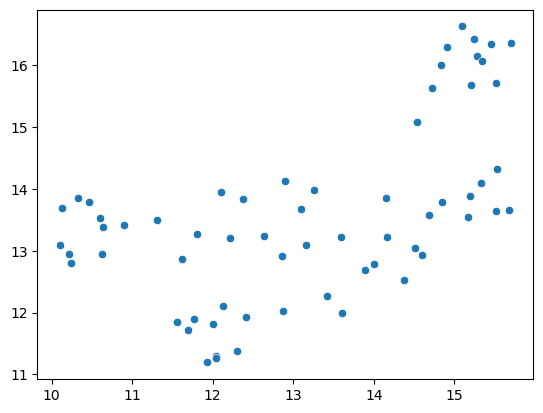

In [71]:
x = embedding[:, 0]
y = embedding[:, 1]
plt_ = sns.scatterplot(x=x, y=y)

In [118]:
pass_ = 5


div_js = np.zeros(((num_passages), 3))
for pass_ in range(num_passages):
    count_ = 0
    if pass_ == 0:
        comp_type = []
#         comp_int_type = []
    reps_ = {}
    reps_[0] = np.array(df_speciesAbun_mdl)[:, [pass_]]
    reps_[1] = np.array(df_speciesAbun_mdl)[:, [pass_ + num_passages]]
    reps_[2] = np.array(df_speciesAbun_mdl)[:, [pass_ + 2 * num_passages]]
    for r_1 in range(2):
        for r_2 in range(r_1 + 1, 3):
            if pass_ == 0:
                comp_type.append(f'r{r_1} vs r{r_2}')
#                 comp_int_type.append(count_)
            div_js[pass_, count_] = scipy.spatial.distance.jensenshannon(reps_[r_1], reps_[r_2])
            count_ += 1

In [137]:
np.tile(np.array(comp_type).reshape((1, num_bioRep)), np.array([num_passages, 1]))

array([['r0 vs r1', 'r0 vs r2', 'r1 vs r2'],
       ['r0 vs r1', 'r0 vs r2', 'r1 vs r2'],
       ['r0 vs r1', 'r0 vs r2', 'r1 vs r2'],
       ['r0 vs r1', 'r0 vs r2', 'r1 vs r2'],
       ['r0 vs r1', 'r0 vs r2', 'r1 vs r2'],
       ['r0 vs r1', 'r0 vs r2', 'r1 vs r2']], dtype='<U8')

In [136]:
np.reshape(np.array(comp_type), (1, num_bioRep))

array([['r0 vs r1', 'r0 vs r2', 'r1 vs r2']], dtype='<U8')

Text(0, 0.5, 'Jensen-Shannon divergence')

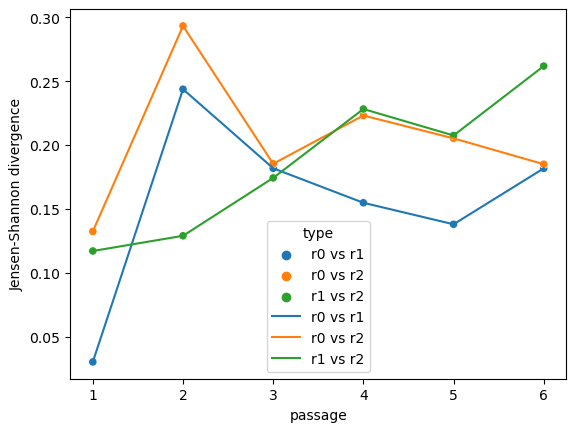

In [141]:
x = np.array(list(np.arange(num_passages) + 1) * 3).flatten()
y = div_js.flatten(order='F')
col_ = np.tile(np.array(comp_type).reshape((1, num_bioRep)), np.array([num_passages, 1]))
df_plt = pd.DataFrame(data={"x" : x, "y" : y, "type" : col_.flatten(order='F')})
plt_ = sns.scatterplot(df_plt, x="x", y="y", hue="type")
plt_ = sns.lineplot(df_plt, x="x", y="y", hue="type")
plt_.set_xlabel("passage")
plt_.set_ylabel("Jensen-Shannon divergence")

In [262]:
corr_rep = np.zeros((num_passages, 3))
corrpval_rep = np.zeros((num_passages, 3))
for pass_ in range(num_passages):
    count_ = 0
    if pass_ == 0:
        comp_type = []
    for rep_1 in range(2):
        id_1 = [pass_ + rep_1 * num_passages]
        for rep_2 in range(rep_1 + 1, 3):
            if pass_ == 0:
                comp_type.append(f'r{rep_1} vs r{rep_2}')
            id_2 = [pass_ + rep_2 * num_passages]
            x = df_speciesAbun_mdl.iloc[:, id_1].copy()
            y = df_speciesAbun_mdl.iloc[:, id_2].copy()
            tmp = scipy.stats.pearsonr(np.log10(x.values.flatten()), np.log10(y.values.flatten()))
            corr_rep[pass_, count_] = tmp[0]
            corrpval_rep[pass_, count_] = tmp[1]
            count_ += 1
        
            

Text(0, 0.5, 'correlation')

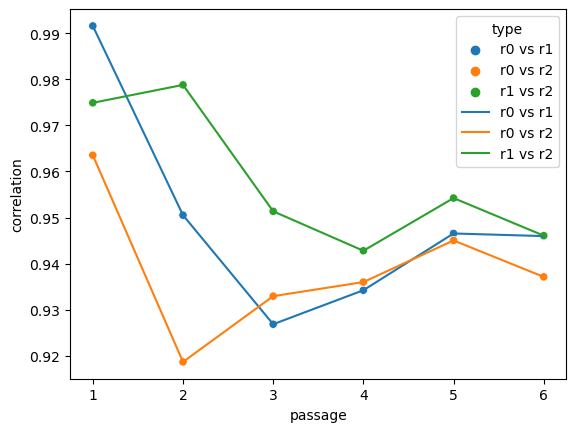

In [263]:
x = np.array(list(np.arange(num_passages) + 1) * 3).flatten()
y = corr_rep.flatten(order='F')
col_ = np.tile(np.array(comp_type).reshape((1, num_bioRep)), np.array([num_passages, 1]))
df_plt = pd.DataFrame(data={"x" : x, "y" : y, "type" : col_.flatten(order='F')})
plt_ = sns.scatterplot(df_plt, x="x", y="y", hue="type")
plt_ = sns.lineplot(df_plt, x="x", y="y", hue="type")
plt_.set_xlabel("passage")
plt_.set_ylabel("correlation")